In [1]:
#https://www.kaggle.com/akashsri99/deep-learning-iris-dataset-keras/notebook
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from keras.utils import to_categorical
import seaborn as sns
from sklearn.model_selection import train_test_split

Using TensorFlow backend.


In [2]:
dataset = pd.read_csv('dataset_cl_sp_nodp.csv',sep=';')

In [3]:
dataset = dataset[dataset['comp opt'] != 'NF']
dataset = dataset.reset_index(drop=True)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722400 entries, 0 to 722399
Data columns (total 34 columns):
size vector     722400 non-null int64
comp opt        722400 non-null object
label           722400 non-null object
threads         722400 non-null int64
id              722400 non-null int64
PAPI_L1_DCM     722400 non-null int64
PAPI_L3_TCM     722400 non-null int64
PAPI_TOT_INS    722400 non-null int64
PAPI_REF_CYC    722400 non-null int64
PAPI_L2_LDM     722400 non-null int64
PAPI_SR_INS     722400 non-null int64
time_x          722400 non-null int64
PAPI_BR_UCN     722400 non-null int64
PAPI_BR_CN      722400 non-null int64
PAPI_BR_TKN     722400 non-null int64
PAPI_BR_MSP     722400 non-null int64
time_y          722400 non-null int64
PAPI_FP_OPS     722400 non-null int64
PAPI_L1_LDM     722400 non-null int64
PAPI_L1_STM     722400 non-null int64
time_x.1        722400 non-null int64
PAPI_SP_OPS     722400 non-null int64
PAPI_LD_INS     722400 non-null int64
PAPI_L2_STM  

In [4]:
dataset

,size vector,comp opt,label,threads,id,PAPI_L1_DCM,PAPI_L3_TCM,PAPI_TOT_INS,PAPI_REF_CYC,PAPI_L2_LDM,...,time_y.1,PAPI_TLB_DM,PAPI_L2_DCH,time_x.1.1,time_y.1.1,P_index,ideal,affinity,T_list,P_list
0,3000,O2,Copy_E,5,1,5194,543,1361874,2458692,1415,...,1,115,3346,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
1,3000,O2,Copy_E,5,2,3981,78,1145149,1994742,869,...,0,61,2724,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
2,3000,O2,Copy_E,5,3,3730,50,1162368,2025702,844,...,0,45,2476,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
3,3000,O2,Copy_E,5,4,3533,46,1159110,2023560,801,...,0,57,2625,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
4,3000,O2,Copy_E,5,5,3530,37,1115404,1941156,785,...,0,44,2566,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
5,3000,O2,Copy_E,5,6,3461,36,1113848,1937898,764,...,0,58,2482,1,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
6,3000,O2,Copy_E,5,7,3541,38,1122671,1955610,821,...,0,57,2583,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
7,3000,O2,Copy_E,5,8,3658,33,1171838,2045970,892,...,0,50,2517,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
8,3000,O2,Copy_E,5,9,3441,45,1125059,1956780,785,...,0,41,2520,0,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."
9,3000,O2,Copy_E,5,10,3700,53,1168407,2031516,793,...,1,58,2499,1,0.000004,0.000016,1,spread,"[1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[5e-06, 9.6e-06, 1e-05, 1.28e-05, 1.6e-05, 1.9..."


In [5]:
from sklearn.utils import shuffle
dataset = shuffle(dataset)
dataset

,size vector,comp opt,label,threads,id,PAPI_L1_DCM,PAPI_L3_TCM,PAPI_TOT_INS,PAPI_REF_CYC,PAPI_L2_LDM,...,time_y.1,PAPI_TLB_DM,PAPI_L2_DCH,time_x.1.1,time_y.1.1,P_index,ideal,affinity,T_list,P_list
714605,9000,O2,2D4PStencil_E,12,606,4293,70,3707365,7123788,793,...,0,38,2868,0,0.000007,0.000027,6,close,"[6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12]","[9.82e-06, 1.1e-05, 1.11e-05, 1.15e-05, 1.1599..."
573305,200000,O2,Copy_E,11,6,53521,66,4531887,7606458,13711,...,0,88,26755,1,0.000041,0.000076,12,close,"[12, 11, 10, 9, 3, 8, 4, 2, 7, 5, 1, 6]","[5.6899999999999994e-05, 7.58e-05, 0.000106598..."
527186,9000000,O2,Copy_E,9,87,2254086,2118936,54483688,164553858,607583,...,9,1353,86783,8,0.008178,0.034383,1,close,"[1, 2, 3, 11, 12, 10, 9, 4, 8, 5, 7, 6]","[0.017506, 0.018659705, 0.026866578, 0.0301158..."
464143,160000000,O2,Copy_E,10,44,40008360,38928206,812310161,2791557864,10407010,...,134,3852,923551,134,0.133667,0.605587,1,close,"[1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6]","[0.295034, 0.299196347, 0.44505964600000003, 0..."
596723,1000000,O2,Triad_E,3,324,381441,263743,7930647,15402222,147077,...,2,1170,134460,2,0.001956,0.004145,12,close,"[12, 11, 10, 1, 9, 2, 8, 3, 7, 4, 5, 6]","[0.001167328, 0.001536917, 0.002169104, 0.0027..."
192181,40000000,O2,Triad_E,9,382,15049773,12961757,291751467,838220472,6635779,...,42,2302,2103121,43,0.042172,0.154628,2,spread,"[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]","[0.053097057, 0.06834267599999999, 0.085460535..."
175979,100000,O2,Add_E,6,280,41410,101,2172219,3238344,10976,...,0,57,21503,1,0.000035,0.000041,10,spread,"[10, 8, 9, 11, 12, 6, 5, 7, 4, 3, 2, 1]","[2.7300000000000006e-05, 3.2899999999999987e-0..."
523058,9000,O2,Scale_E,8,159,4436,46,2213096,4118562,846,...,1,90,3204,0,0.000005,0.000014,2,close,"[2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12]","[9.14e-06, 1.0300000000000001e-05, 1.05e-05, 1..."
110506,5000000,O2,2D4PStencil_E,9,607,2501441,895442,57409474,92711412,335276,...,5,969,1588784,4,0.004129,0.013604,2,spread,"[2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11]","[0.005714749, 0.006853379000000001, 0.00717277..."
328671,10000,O2,Triad_E,7,372,7183,144,1835436,3287826,875,...,0,59,5880,0,0.000006,0.000014,5,spread,"[5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12]","[1e-05, 1.07e-05, 1.09e-05, 1.11e-05, 1.2e-05,..."


In [6]:
labels =  dataset['label'].tolist()
labels_train ,labels_pred = train_test_split(labels,test_size=0.2,random_state=0) 
size_vectors = dataset['size vector'].tolist()
size_vectors_train ,size_vectors_pred = train_test_split(size_vectors,test_size=0.2,random_state=0) 
comp_opts = dataset['comp opt'].tolist()
comp_opts_train ,comp_opts_pred = train_test_split(comp_opts,test_size=0.2,random_state=0) 
threads = dataset['threads'].tolist()
threads_train ,threads_pred = train_test_split(threads,test_size=0.2,random_state=0) 

In [7]:
P_list =  dataset['P_list'].tolist()
P_list_train ,P_list_pred = train_test_split(P_list,test_size=0.2,random_state=0) 
P_list_train

['[0.310323993, 0.318411, 0.412163657, 0.515687633, 0.54119661, 0.54255703, 0.57194954, 0.609922124, 0.656227625, 0.676456652, 0.718099943, 0.81144295]',
 '[5.3799999999999986e-05, 7.37e-05, 9.719999999999999e-05, 0.00011587899999999999, 0.000134907, 0.000151585, 0.000155516, 0.00018, 0.000183332, 0.000190699, 0.00022455400000000002, 0.00028900000000000003]',
 '[0.000357261, 0.00038040400000000004, 0.000465186, 0.000835605, 0.001212966, 0.001652735, 0.0019089999999999999, 0.002018831, 0.002416344, 0.002843845, 0.0032387220000000003, 0.003672795]',
 '[0.142757727, 0.155825397, 0.19283766, 0.204598063, 0.229892705, 0.275331925, 0.278927, 0.289101099, 0.338323735, 0.356707863, 0.403101566, 0.420313056]',
 '[0.189342, 0.19747433600000008, 0.272083339, 0.33953554700000005, 0.355734116, 0.36220772100000004, 0.3738044720000001, 0.406194665, 0.433581249, 0.44679747799999997, 0.48667935, 0.551600096]',
 '[6e-06, 6.25e-06, 8e-06, 8e-06, 1e-05, 1.2e-05, 1.4000000000000001e-05, 1.6e-05, 2.81000000

In [8]:
T_list =  dataset['T_list'].tolist()
T_list_train ,T_list_pred = train_test_split(T_list,test_size=0.2,random_state=0) 
T_list_train

['[2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6]',
 '[12, 11, 10, 9, 3, 8, 4, 5, 7, 2, 6, 1]',
 '[11, 12, 10, 9, 8, 2, 1, 7, 3, 4, 5, 6]',
 '[2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11]',
 '[1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6]',
 '[3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12]',
 '[6, 4, 8, 5, 3, 7, 10, 9, 2, 12, 11, 1]',
 '[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]',
 '[10, 7, 9, 6, 8, 5, 12, 11, 4, 3, 2, 1]',
 '[1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6]',
 '[2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6]',
 '[4, 6, 5, 7, 8, 3, 2, 10, 9, 12, 11, 1]',
 '[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]',
 '[2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6]',
 '[6, 9, 4, 8, 10, 5, 7, 3, 11, 12, 2, 1]',
 '[2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12]',
 '[3, 5, 6, 2, 1, 4, 7, 8, 9, 10, 11, 12]',
 '[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]',
 '[12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1]',
 '[1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6]',
 '[1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6]',
 '[1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6]',
 '[11, 10, 12, 9, 8, 7, 6, 5, 4,

In [56]:
T_list_train

['[2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6]',
 '[12, 11, 10, 9, 3, 8, 4, 5, 7, 2, 6, 1]',
 '[11, 12, 10, 9, 8, 2, 1, 7, 3, 4, 5, 6]',
 '[2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11]',
 '[1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6]',
 '[3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12]',
 '[6, 4, 8, 5, 3, 7, 10, 9, 2, 12, 11, 1]',
 '[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]',
 '[10, 7, 9, 6, 8, 5, 12, 11, 4, 3, 2, 1]',
 '[1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6]',
 '[2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6]',
 '[4, 6, 5, 7, 8, 3, 2, 10, 9, 12, 11, 1]',
 '[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]',
 '[2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6]',
 '[6, 9, 4, 8, 10, 5, 7, 3, 11, 12, 2, 1]',
 '[2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12]',
 '[3, 5, 6, 2, 1, 4, 7, 8, 9, 10, 11, 12]',
 '[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]',
 '[12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1]',
 '[1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6]',
 '[1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6]',
 '[1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6]',
 '[11, 10, 12, 9, 8, 7, 6, 5, 4,

In [55]:
T_list_pred

['[2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6]',
 '[3, 2, 5, 4, 6, 7, 8, 1, 9, 10, 11, 12]',
 '[3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12]',
 '[4, 3, 2, 5, 6, 7, 1, 8, 9, 10, 11, 12]',
 '[1, 2, 3, 11, 10, 12, 4, 8, 9, 5, 7, 6]',
 '[2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11]',
 '[12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1]',
 '[2, 3, 1, 12, 11, 10, 4, 9, 8, 5, 7, 6]',
 '[1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6]',
 '[3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12]',
 '[8, 10, 9, 6, 7, 5, 12, 11, 4, 3, 2, 1]',
 '[2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11]',
 '[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]',
 '[2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11]',
 '[12, 11, 10, 9, 8, 2, 3, 7, 1, 4, 5, 6]',
 '[11, 10, 12, 9, 8, 7, 6, 3, 5, 4, 2, 1]',
 '[6, 9, 4, 8, 10, 5, 7, 3, 11, 12, 2, 1]',
 '[9, 11, 8, 6, 7, 10, 4, 5, 12, 3, 2, 1]',
 '[2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6]',
 '[6, 8, 5, 4, 10, 7, 9, 3, 11, 12, 2, 1]',
 '[2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12]',
 '[8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1]',
 '[3, 2, 4, 1, 5, 6, 7, 8, 9, 10

In [9]:
def erase_from_dataset(dataset_in):
    del dataset_in['id']
    del dataset_in['size vector']
    del dataset_in['comp opt']
    del dataset_in['label']
    del dataset_in['threads']
    del dataset_in['time_x']
    del dataset_in['time_y']
    del dataset_in['time_x.1']
    del dataset_in['time_y.1']
    del dataset_in['time_x.1.1']
    del dataset_in['time_y.1.1']
    del dataset_in['P_index']
    del dataset_in['P_list']
    del dataset_in['T_list']
    dataset_in = dataset_in.reset_index(drop=True)

    print(list(dataset_in))
    print(dataset_in.info())
    
erase_from_dataset(dataset)

['PAPI_L1_DCM', 'PAPI_L3_TCM', 'PAPI_TOT_INS', 'PAPI_REF_CYC', 'PAPI_L2_LDM', 'PAPI_SR_INS', 'PAPI_BR_UCN', 'PAPI_BR_CN', 'PAPI_BR_TKN', 'PAPI_BR_MSP', 'PAPI_FP_OPS', 'PAPI_L1_LDM', 'PAPI_L1_STM', 'PAPI_SP_OPS', 'PAPI_LD_INS', 'PAPI_L2_STM', 'PAPI_TLB_DM', 'PAPI_L2_DCH', 'ideal', 'affinity']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722400 entries, 0 to 722399
Data columns (total 20 columns):
PAPI_L1_DCM     722400 non-null int64
PAPI_L3_TCM     722400 non-null int64
PAPI_TOT_INS    722400 non-null int64
PAPI_REF_CYC    722400 non-null int64
PAPI_L2_LDM     722400 non-null int64
PAPI_SR_INS     722400 non-null int64
PAPI_BR_UCN     722400 non-null int64
PAPI_BR_CN      722400 non-null int64
PAPI_BR_TKN     722400 non-null int64
PAPI_BR_MSP     722400 non-null int64
PAPI_FP_OPS     722400 non-null int64
PAPI_L1_LDM     722400 non-null int64
PAPI_L1_STM     722400 non-null int64
PAPI_SP_OPS     722400 non-null int64
PAPI_LD_INS     722400 non-null int64
PAPI_L2_STM     722400 non

In [10]:
dataset

,PAPI_L1_DCM,PAPI_L3_TCM,PAPI_TOT_INS,PAPI_REF_CYC,PAPI_L2_LDM,PAPI_SR_INS,PAPI_BR_UCN,PAPI_BR_CN,PAPI_BR_TKN,PAPI_BR_MSP,PAPI_FP_OPS,PAPI_L1_LDM,PAPI_L1_STM,PAPI_SP_OPS,PAPI_LD_INS,PAPI_L2_STM,PAPI_TLB_DM,PAPI_L2_DCH,ideal,affinity
714605,4293,70,3707365,7123788,793,37959,8257,896891,495841,1786,33906,3148,635,0,555428,189,38,2868,6,close
573305,53521,66,4531887,7606458,13711,228534,8247,1130359,704495,1646,42,26690,24235,0,714106,14515,88,26755,12,close
527186,2254086,2118936,54483688,164553858,607583,9028639,8224,11842543,10528973,8570,48,638667,522361,0,10387217,479845,1353,86783,1,close
464143,40008360,38928206,812310161,2791557864,10407010,160029670,8292,166182500,164457488,123027,39,10543929,8537520,0,161866031,7844550,3852,923551,1,close
596723,381441,263743,7930647,15402222,147077,1027884,8169,1234135,1138466,2387,2010707,214867,106253,0,2150388,70707,1170,134460,12,close
192181,15049773,12961757,291751467,838220472,6635779,40028772,8357,43891667,42252444,47430,80609326,7865495,3615511,0,81852469,2838928,2302,2103121,2,spread
175979,41410,101,2172219,3238344,10976,128226,8065,495917,324346,1461,100027,26663,12171,0,447138,4740,57,21503,10,spread
523058,4436,46,2213096,4118562,846,38616,8254,554440,307967,1632,9034,3336,928,0,339971,202,90,3204,2,close
110506,2501441,895442,57409474,92711412,335276,5019299,8209,7195154,6143352,7927,20083716,1757162,496975,0,20998187,310623,969,1588784,2,spread
328671,7183,144,1835436,3287826,875,39381,8246,482154,269855,1773,20030,5572,1634,0,307362,254,59,5880,5,spread


In [11]:
affinity_list = ['close','spread']
def doSomething(x):
    return affinity_list.index(x)

dataset['affinity'] = dataset['affinity'].apply(doSomething)
#for elem in dataset.affinity:
#dataset.affinity = affinity_list.index(dataset.affinity)
#dataset.affinity

c:\python36\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [12]:
y = dataset['ideal'].tolist()
del dataset['ideal']
y

[6,
 12,
 1,
 1,
 12,
 2,
 10,
 2,
 2,
 5,
 1,
 3,
 2,
 2,
 6,
 2,
 1,
 2,
 10,
 1,
 3,
 6,
 2,
 2,
 1,
 2,
 8,
 12,
 12,
 2,
 6,
 3,
 4,
 2,
 6,
 2,
 1,
 12,
 2,
 11,
 5,
 2,
 4,
 6,
 1,
 2,
 5,
 2,
 6,
 4,
 10,
 2,
 4,
 4,
 8,
 11,
 2,
 4,
 3,
 3,
 2,
 12,
 2,
 12,
 3,
 4,
 3,
 8,
 2,
 9,
 4,
 2,
 12,
 5,
 8,
 9,
 1,
 4,
 6,
 12,
 2,
 11,
 1,
 2,
 3,
 10,
 3,
 12,
 10,
 12,
 2,
 2,
 3,
 12,
 2,
 10,
 8,
 9,
 4,
 2,
 12,
 9,
 1,
 3,
 1,
 10,
 4,
 12,
 12,
 5,
 2,
 4,
 9,
 8,
 1,
 3,
 1,
 3,
 6,
 2,
 12,
 2,
 4,
 6,
 12,
 11,
 2,
 6,
 2,
 6,
 1,
 12,
 1,
 2,
 2,
 6,
 10,
 2,
 1,
 2,
 1,
 12,
 1,
 12,
 1,
 2,
 2,
 12,
 3,
 2,
 6,
 1,
 1,
 9,
 6,
 11,
 6,
 6,
 2,
 12,
 1,
 2,
 10,
 2,
 12,
 10,
 2,
 12,
 8,
 11,
 2,
 2,
 10,
 6,
 2,
 12,
 6,
 3,
 2,
 6,
 11,
 4,
 2,
 2,
 8,
 2,
 11,
 2,
 1,
 8,
 6,
 12,
 3,
 10,
 6,
 4,
 2,
 5,
 6,
 8,
 11,
 2,
 4,
 1,
 3,
 1,
 8,
 2,
 2,
 1,
 4,
 2,
 2,
 6,
 10,
 2,
 2,
 11,
 3,
 12,
 6,
 12,
 1,
 2,
 2,
 1,
 12,
 1,
 12,
 10,
 1,
 1,
 2,
 10,
 2,
 6,
 

In [13]:
dataset = dataset.reindex_axis(sorted(dataset.columns), axis=1)
list(dataset)

c:\python36\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: '.reindex_axis' is deprecated and will be removed in a future version. Use '.reindex' instead.
  """Entry point for launching an IPython kernel.


['PAPI_BR_CN',
 'PAPI_BR_MSP',
 'PAPI_BR_TKN',
 'PAPI_BR_UCN',
 'PAPI_FP_OPS',
 'PAPI_L1_DCM',
 'PAPI_L1_LDM',
 'PAPI_L1_STM',
 'PAPI_L2_DCH',
 'PAPI_L2_LDM',
 'PAPI_L2_STM',
 'PAPI_L3_TCM',
 'PAPI_LD_INS',
 'PAPI_REF_CYC',
 'PAPI_SP_OPS',
 'PAPI_SR_INS',
 'PAPI_TLB_DM',
 'PAPI_TOT_INS',
 'affinity']

In [14]:
X = dataset.iloc[:,0:19].values
print(X)

[[  896891     1786   495841 ...       38  3707365        0]
 [ 1130359     1646   704495 ...       88  4531887        0]
 [11842543     8570 10528973 ...     1353 54483688        0]
 ...
 [  595311     1701   325847 ...       67  1774192        1]
 [   83747     1363    57637 ...       31   382629        0]
 [   62265     1459    65854 ...      135   446081        0]]


In [15]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
scaler_x = MaxAbsScaler()
scaler_x.fit(X)
X_scaled =  scaler_x.transform(X)
#print (X_scaled)

In [16]:
#from sklearn.model_selection import train_test_split
X_scaled_train ,X_pred_scaled, Y_train, y_pred_train = train_test_split(X_scaled,y,test_size=0.2,random_state=0) 

In [17]:
#Defining the model 
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.optimizers import SGD,Adam


model = Sequential()

In [18]:
model.add(Dense(100,input_shape=(19,),activation='tanh'))
#model.add(Dense(50,activation='relu'))
#model.add(Dense(20,activation='relu'))
model.add(Dense(1))

In [19]:
#model.compile(Adam(lr=0.001),'categorical_crossentropy',metrics=['accuracy'])
model.compile(loss='mae', optimizer='rmsprop')

In [20]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 100)               2000      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 101       
Total params: 2,101
Trainable params: 2,101
Non-trainable params: 0
_________________________________________________________________


In [21]:
import keras
stopper = keras.callbacks.EarlyStopping(monitor='val_loss', patience=400, verbose=1, baseline=None, mode='auto',restore_best_weights=True)
callback = [stopper] if True else None
print(len(X_pred_scaled),len(y_pred_train))

144480 144480


In [22]:
#fitting the model and predicting 
history = model.fit(X_scaled_train,Y_train,batch_size=100,epochs=1000,shuffle=1,validation_data = (X_pred_scaled, y_pred_train))
#history = model.fit(X_scaled,Y_train,batch_size=100,epochs=1000,shuffle=1,validation_data = (X_pred_scaled, y_pred_train),  callbacks=callback)

Train on 577920 samples, validate on 144480 samples
Epoch 1/1000
577920/577920 [==============================] - 4s 7us/step - loss: 2.6944 - val_loss: 2.5318
Epoch 2/1000
577920/577920 [==============================] - 4s 7us/step - loss: 2.4650 - val_loss: 2.4313
Epoch 3/1000
577920/577920 [==============================] - 4s 7us/step - loss: 2.3803 - val_loss: 2.3777
Epoch 4/1000
577920/577920 [==============================] - 4s 7us/step - loss: 2.3268 - val_loss: 2.3053
Epoch 5/1000
577920/577920 [==============================] - 4s 7us/step - loss: 2.2481 - val_loss: 2.1935
Epoch 6/1000
577920/577920 [==============================] - 4s 7us/step - loss: 2.1166 - val_loss: 2.0283
Epoch 7/1000
577920/577920 [==============================] - 4s 7us/step - loss: 1.9473 - val_loss: 1.8659
Epoch 8/1000
577920/577920 [==============================] - 4s 7us/step - loss: 1.8250 - val_loss: 1.7734
Epoch 9/1000
577920/577920 [==============================] - 4s 7us/step - loss: 1.

577920/577920 [==============================] - 4s 7us/step - loss: 0.7365 - val_loss: 0.7358
Epoch 76/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.7344 - val_loss: 0.7243
Epoch 77/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.7320 - val_loss: 0.7405
Epoch 78/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.7298 - val_loss: 0.7291
Epoch 79/1000
577920/577920 [==============================] - 4s 8us/step - loss: 0.7277 - val_loss: 0.7459
Epoch 80/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.7259 - val_loss: 0.7182
Epoch 81/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.7238 - val_loss: 0.7139
Epoch 82/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.7219 - val_loss: 0.7253
Epoch 83/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.7202 - val_loss: 0.7174
Epoch 84/1000
577920/577920 [====

Epoch 150/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6485 - val_loss: 0.6592
Epoch 151/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6477 - val_loss: 0.6492
Epoch 152/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6472 - val_loss: 0.6428
Epoch 153/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6462 - val_loss: 0.6508
Epoch 154/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6456 - val_loss: 0.6364
Epoch 155/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6452 - val_loss: 0.6551
Epoch 156/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6443 - val_loss: 0.6689
Epoch 157/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6436 - val_loss: 0.6444
Epoch 158/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6430 - val_loss: 0.6591
Epoch 159/

577920/577920 [==============================] - 4s 6us/step - loss: 0.6119 - val_loss: 0.6097
Epoch 225/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.6116 - val_loss: 0.6254
Epoch 226/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6115 - val_loss: 0.6078
Epoch 227/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6110 - val_loss: 0.6190
Epoch 228/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.6107 - val_loss: 0.6013
Epoch 229/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.6104 - val_loss: 0.6143
Epoch 230/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.6100 - val_loss: 0.6048
Epoch 231/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.6096 - val_loss: 0.6190
Epoch 232/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.6094 - val_loss: 0.6456
Epoch 233/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5903 - val_loss: 0.5968
Epoch 299/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5900 - val_loss: 0.6213
Epoch 300/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5899 - val_loss: 0.5993
Epoch 301/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5897 - val_loss: 0.5860
Epoch 302/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5893 - val_loss: 0.5980
Epoch 303/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5892 - val_loss: 0.6067
Epoch 304/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5890 - val_loss: 0.5812
Epoch 305/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5886 - val_loss: 0.5838
Epoch 306/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5884 - val_loss: 0.5982
Epoch 307/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5745 - val_loss: 0.6091
Epoch 373/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5744 - val_loss: 0.5763
Epoch 374/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5743 - val_loss: 0.5764
Epoch 375/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5740 - val_loss: 0.5758
Epoch 376/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5739 - val_loss: 0.5903
Epoch 377/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5736 - val_loss: 0.5690
Epoch 378/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5735 - val_loss: 0.5870
Epoch 379/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5733 - val_loss: 0.5672
Epoch 380/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5733 - val_loss: 0.5635
Epoch 381/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5628 - val_loss: 0.5600
Epoch 447/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5627 - val_loss: 0.5698
Epoch 448/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5626 - val_loss: 0.5878
Epoch 449/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5624 - val_loss: 0.5777
Epoch 450/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5623 - val_loss: 0.5633
Epoch 451/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5620 - val_loss: 0.5536
Epoch 452/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5618 - val_loss: 0.5626
Epoch 453/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5618 - val_loss: 0.5649
Epoch 454/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5617 - val_loss: 0.5554
Epoch 455/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5531 - val_loss: 0.5756
Epoch 521/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5530 - val_loss: 0.5454
Epoch 522/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5529 - val_loss: 0.5649
Epoch 523/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5527 - val_loss: 0.5642
Epoch 524/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5526 - val_loss: 0.5584
Epoch 525/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5524 - val_loss: 0.5501
Epoch 526/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5524 - val_loss: 0.5522
Epoch 527/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5522 - val_loss: 0.5684
Epoch 528/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5521 - val_loss: 0.5573
Epoch 529/1000
577920/577

577920/577920 [==============================] - 4s 6us/step - loss: 0.5450 - val_loss: 0.5531
Epoch 595/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5448 - val_loss: 0.5388
Epoch 596/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5449 - val_loss: 0.5548
Epoch 597/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5447 - val_loss: 0.6018
Epoch 598/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5446 - val_loss: 0.5362
Epoch 599/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5443 - val_loss: 0.5359
Epoch 600/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5442 - val_loss: 0.5472
Epoch 601/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5442 - val_loss: 0.5397
Epoch 602/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5441 - val_loss: 0.5355
Epoch 603/1000
577920/577

577920/577920 [==============================] - 4s 6us/step - loss: 0.5383 - val_loss: 0.5630
Epoch 669/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5381 - val_loss: 0.5621
Epoch 670/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5381 - val_loss: 0.5537
Epoch 671/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5380 - val_loss: 0.5303
Epoch 672/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5379 - val_loss: 0.5438
Epoch 673/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5378 - val_loss: 0.5390
Epoch 674/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5379 - val_loss: 0.5397
Epoch 675/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5376 - val_loss: 0.5541
Epoch 676/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5376 - val_loss: 0.5497
Epoch 677/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5327 - val_loss: 0.5282
Epoch 743/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5328 - val_loss: 0.5388
Epoch 744/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5327 - val_loss: 0.5400
Epoch 745/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5326 - val_loss: 0.5332
Epoch 746/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5326 - val_loss: 0.5258
Epoch 747/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5325 - val_loss: 0.5279
Epoch 748/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5325 - val_loss: 0.5447
Epoch 749/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5324 - val_loss: 0.5333
Epoch 750/1000
577920/577920 [==============================] - 5s 8us/step - loss: 0.5323 - val_loss: 0.5274
Epoch 751/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5286 - val_loss: 0.5219
Epoch 817/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5285 - val_loss: 0.5262
Epoch 818/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5285 - val_loss: 0.5334
Epoch 819/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5284 - val_loss: 0.5235
Epoch 820/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5284 - val_loss: 0.5282
Epoch 821/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5285 - val_loss: 0.5246
Epoch 822/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5284 - val_loss: 0.5437
Epoch 823/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5283 - val_loss: 0.5199
Epoch 824/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5283 - val_loss: 0.5449
Epoch 825/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5251 - val_loss: 0.5250
Epoch 891/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5251 - val_loss: 0.5332
Epoch 892/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5250 - val_loss: 0.5156
Epoch 893/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5252 - val_loss: 0.5330
Epoch 894/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5250 - val_loss: 0.5364
Epoch 895/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5250 - val_loss: 0.5234
Epoch 896/1000
577920/577920 [==============================] - 4s 6us/step - loss: 0.5250 - val_loss: 0.5538
Epoch 897/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5248 - val_loss: 0.5230
Epoch 898/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5248 - val_loss: 0.5168
Epoch 899/1000
577920/577

577920/577920 [==============================] - 4s 7us/step - loss: 0.5221 - val_loss: 0.5267
Epoch 965/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5222 - val_loss: 0.5214
Epoch 966/1000
577920/577920 [==============================] - 4s 8us/step - loss: 0.5222 - val_loss: 0.5250
Epoch 967/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5220 - val_loss: 0.5414
Epoch 968/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5220 - val_loss: 0.5256
Epoch 969/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5219 - val_loss: 0.5130
Epoch 970/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5219 - val_loss: 0.5153
Epoch 971/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5218 - val_loss: 0.5332
Epoch 972/1000
577920/577920 [==============================] - 4s 7us/step - loss: 0.5219 - val_loss: 0.5170
Epoch 973/1000
577920/577

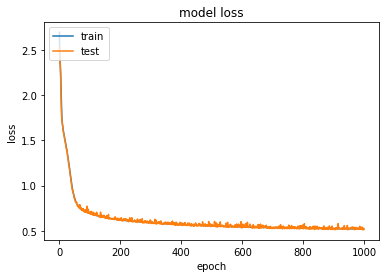

In [23]:
#plt.ylim(0.0,1)
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Training

In [84]:
pred_Y_relu = model.predict(X_scaled_train)
#print (pred_Y_relu.tolist())

In [85]:
#print (Y_train)

In [86]:
aux0 = 0
aux1 = 0
aux_1 = 0
aux_2 = 0
auxf = 0
for f, b, T_l in zip(Y_train, pred_Y_relu.tolist(), T_list_train):
    #eq_fb = (int(b) == f)
    if f == int(b[0]):
        aux0 = aux0 + 1
        #print(f, b[0], True)
    elif f == (int(b[0])+1):
        aux1 = aux1 + 1
        #print(f, b[0], True)
    elif f == (int(b[0])-1):
        aux_1 = aux_1 + 1
        #print(f, b[0], True)
    else:
        auxf = auxf + 1
        print(f, b[0], T_l, round(f),  False)
        if round(f) == int(T_l[1]):
            aux_2 = aux_2 + 1
            print(f, b[0], T_l, round(f),  True)
print(aux0, aux1, aux_1, auxf)
print(aux_2)

5 7.822615623474121 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.822615623474121 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
6 8.39735221862793 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
11 9.955347061157227 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
11 8.301654815673828 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.706428050994873 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.706428050994873 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.577601432800293 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 8.262568473815918 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
8 6.517303466796875 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.517303466796875 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
4 6.418711185455322 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.418711185455322 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
11 8.244068145751953 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.7673802375793457 [4, 2, 3, 5, 1, 6, 7, 8,

3 1.623998761177063 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.623998761177063 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 3.738430976867676 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.738430976867676 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
12 10.872304916381836 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
11 8.89985179901123 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
10 8.625178337097168 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
6 4.81258487701416 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.81258487701416 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.8804259300231934 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8804259300231934 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.255373477935791 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.255373477935791 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
3 1.7827357053756714 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7827357053756714 [3, 1, 2, 4, 5, 6, 7, 8, 

6 3.0402536392211914 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.442706108093262 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.442706108093262 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
5 3.2874927520751953 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.2874927520751953 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.8561640977859497 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8561640977859497 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 12.217498779296875 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
4 1.8310240507125854 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.8310240507125854 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
2 11.783912658691406 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.783912658691406 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.764568328857422 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.764568328857422 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 11.848267555236816 [2, 3, 12, 11, 10, 4, 

5 7.7862043380737305 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.7862043380737305 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
9 7.903704643249512 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.903704643249512 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 2.9678196907043457 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9678196907043457 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 7.887611389160156 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.887611389160156 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
6 4.962208271026611 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.962208271026611 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
4 2.7365875244140625 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7365875244140625 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 2.9434432983398438 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9434432983398438 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
9 7.103102684020996 [9, 6, 8, 7, 10, 5, 4, 12, 

2 11.838683128356934 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 1.4183777570724487 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4183777570724487 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.6333537101745605 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.6333537101745605 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
9 7.95197868347168 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 False
9 7.95197868347168 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 True
4 2.7479825019836426 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7479825019836426 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 7.812783241271973 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.812783241271973 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 2.39567232131958 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.39567232131958 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.859968185424805 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
10 8.0348482131958 [10, 6, 12, 5, 9, 7, 11, 4, 8, 

2 11.846431732177734 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.846431732177734 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 8.421346664428711 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.421346664428711 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
3 1.6903375387191772 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6903375387191772 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 2.316100597381592 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.316100597381592 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.5714412927627563 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.5714412927627563 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 4.804168701171875 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.804168701171875 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 8.808560371398926 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 8.828130722045898 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.828130722045898 [6, 5, 8, 7, 9, 4, 3, 11, 

4 2.804532527923584 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.804532527923584 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.940701961517334 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.940701961517334 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.408814907073975 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.408814907073975 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
4 2.657543182373047 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.657543182373047 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 10.028300285339355 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
12 10.878143310546875 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
4 6.705057144165039 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.705057144165039 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
9 7.869100570678711 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.869100570678711 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
9 7.5682220458984375 [9, 6, 8, 7, 10, 5, 4, 12, 

6 8.639177322387695 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.639177322387695 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 2.972228527069092 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.972228527069092 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 1.8747638463974 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8747638463974 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.7312960624694824 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.7312960624694824 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
12 9.84972095489502 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
10 8.135204315185547 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
8 6.517274856567383 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.517274856567383 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
3 1.9202009439468384 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9202009439468384 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 9.906371116638184 [11, 10, 12, 9, 8, 7, 6, 5, 4,

8 6.22861909866333 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
3 1.6601730585098267 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6601730585098267 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.78168773651123 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.78168773651123 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
2 11.789298057556152 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.789298057556152 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
5 2.7611823081970215 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.7611823081970215 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
3 1.7196990251541138 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.7196990251541138 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
9 7.891481399536133 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.891481399536133 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
12 9.763269424438477 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
4 2.7886714935302734 [4, 3, 5, 6, 1, 9, 7, 8, 

3 1.9964898824691772 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.9964898824691772 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
3 1.4534019231796265 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.4534019231796265 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
12 9.906845092773438 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
6 2.673635959625244 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.673635959625244 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.902302265167236 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.902302265167236 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
9 7.920402526855469 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.920402526855469 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
12 8.52228832244873 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
6 4.432332992553711 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.432332992553711 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
3 1.9873265027999878 [3, 2, 1, 4, 6, 5, 7, 8, 9

4 2.8122944831848145 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.228503227233887 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.228503227233887 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
5 3.124124526977539 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.124124526977539 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
5 3.589600086212158 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.589600086212158 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
10 12.278910636901855 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 8.70981502532959 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.70981502532959 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 1.8946493864059448 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.8946493864059448 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
4 2.4007668495178223 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.4007668495178223 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
3 1.6409043073654175 [3, 2, 1, 4, 5, 6, 7, 8, 10,

4 2.203986167907715 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.56766414642334 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.56766414642334 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.6207391023635864 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6207391023635864 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.493650436401367 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.493650436401367 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
10 8.220111846923828 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
8 6.811976432800293 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.811976432800293 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
3 1.458438754081726 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.458438754081726 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 4.702301502227783 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.702301502227783 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
12 10.058553695678711 [12, 10, 11, 8, 9, 7, 6, 5, 4, 

6 8.81435489654541 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.81435489654541 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
9 7.652589797973633 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.652589797973633 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 2.709289073944092 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.709289073944092 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
6 2.2279372215270996 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.2279372215270996 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
12 9.851564407348633 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 3.763486385345459 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.763486385345459 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
2 11.847344398498535 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.847344398498535 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 4.5877909660339355 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.5877909660339355 [6, 5, 8, 4, 7, 9, 3, 10, 11

3 1.688855767250061 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.688855767250061 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 2.1565732955932617 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.1565732955932617 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
6 4.479060649871826 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.479060649871826 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
9 7.232804298400879 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.232804298400879 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 3.000385284423828 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.000385284423828 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.7432379722595215 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.7432379722595215 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
4 1.6868916749954224 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.6868916749954224 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
5 2.3965139389038086 [5, 6, 2, 4, 3, 1, 7, 8, 9, 

6 4.58576774597168 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
9 7.31104850769043 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.31104850769043 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 8.740592956542969 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.740592956542969 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 2.7987804412841797 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7987804412841797 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.9938745498657227 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.9938745498657227 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
5 2.2695112228393555 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.2695112228393555 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
4 2.788949966430664 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.788949966430664 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
4 2.6972813606262207 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6972813606262207 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10

5 3.54536771774292 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 2.8801589012145996 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.8801589012145996 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
11 9.981460571289062 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
12 10.001777648925781 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.611631989479065 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.611631989479065 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.18009090423584 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.18009090423584 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
2 0.9870182275772095 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9870182275772095 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 7.81983757019043 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.81983757019043 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
10 8.987342834472656 [10, 12, 9, 11, 7, 8, 6, 5, 3, 4, 2, 1] 10 False
4 2.8511810302734375 [4, 2, 3, 5, 1, 6, 7, 8, 9,

3 1.749524712562561 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 8.170927047729492 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.170927047729492 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
10 12.20600414276123 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
5 3.6772141456604004 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.6772141456604004 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
11 8.072957038879395 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
10 8.03653621673584 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.568790078163147 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.568790078163147 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 2.939480781555176 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.939480781555176 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.203776359558105 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
10 8.548069953918457 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
8 6.507091045379639 [8, 7, 5, 10, 6, 9, 3, 1

6 4.675248146057129 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.675248146057129 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
6 3.607198715209961 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.607198715209961 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 3.304687976837158 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.304687976837158 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
4 2.6240415573120117 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6240415573120117 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 7.626251220703125 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.626251220703125 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
10 12.270763397216797 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
5 8.20798397064209 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 8.20798397064209 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
8 6.244495391845703 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.244495391845703 [8, 7, 10, 5, 9, 6, 4, 12, 11, 

5 3.2815756797790527 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
4 2.8728575706481934 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.8728575706481934 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
5 3.311735153198242 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.311735153198242 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.103128433227539 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.103128433227539 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
12 10.263847351074219 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
6 4.311527729034424 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.311527729034424 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
4 2.810275077819824 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.810275077819824 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.958623886108398 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
5 3.748258113861084 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.748258113861084 [5, 4, 3, 6, 2, 7, 8, 1, 9

4 2.903393268585205 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.903393268585205 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.8697142601013184 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8697142601013184 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 1.5800138711929321 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5800138711929321 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
12 10.309335708618164 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
11 9.637574195861816 [11, 10, 8, 9, 6, 12, 7, 5, 4, 3, 2, 1] 11 False
3 1.4110115766525269 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.4110115766525269 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 4.107607364654541 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.107607364654541 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.8166069984436035 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8166069984436035 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
10 7.620534896850586 [10, 9, 7, 6, 8, 5, 

5 3.821157932281494 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
6 4.4534101486206055 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.4534101486206055 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
5 3.345548629760742 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.345548629760742 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
8 6.62003755569458 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.62003755569458 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.6891655921936035 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6891655921936035 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.608509063720703 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.608509063720703 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
9 11.021997451782227 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.021997451782227 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
12 9.98550796508789 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 3.3030343055725098 [6, 2, 4, 3, 7, 5, 1, 8, 9, 1

6 4.713951587677002 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.713951587677002 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
4 2.79769229888916 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.79769229888916 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.023561477661133 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.023561477661133 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
4 2.7203869819641113 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.7203869819641113 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
9 7.989508628845215 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.989508628845215 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
12 10.00634479522705 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 6.1190571784973145 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.1190571784973145 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
10 7.736461639404297 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 2.8963818550109863 [6, 2, 4, 3, 5, 1, 7, 8, 9,

6 4.9464874267578125 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.9464874267578125 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
3 1.397642731666565 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.397642731666565 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 2.3544206619262695 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3544206619262695 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.452374458312988 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.452374458312988 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
12 10.969371795654297 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
10 8.101396560668945 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
4 1.7608720064163208 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.7608720064163208 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
4 2.9028987884521484 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.9028987884521484 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
6 8.594331741333008 [6, 8, 5, 7, 11, 9, 4

6 2.9271507263183594 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9271507263183594 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 3.3338394165039062 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.3338394165039062 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
5 3.6741461753845215 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.6741461753845215 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 4.316511154174805 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.316511154174805 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
9 7.146894454956055 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.146894454956055 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 2.4181923866271973 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.4181923866271973 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
12 8.62511157989502 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
3 1.639389157295227 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.639389157295227 [3, 1, 2, 4, 6, 7, 5, 8, 

2 11.865727424621582 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.865727424621582 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
2 11.767496109008789 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.767496109008789 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 2.776041030883789 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.776041030883789 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
11 8.600345611572266 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
5 3.7807607650756836 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.7807607650756836 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 2.8768367767333984 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8768367767333984 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.8680663108825684 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.8680663108825684 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
2 11.852970123291016 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.852970123291016 [2, 3, 12, 11, 10, 9

4 2.8829283714294434 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
11 8.912961959838867 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
4 2.940540313720703 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.940540313720703 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
1 3.369960308074951 [1, 2, 3, 5, 4, 6, 7, 8, 9, 10, 11, 12] 1 False
1 3.369960308074951 [1, 2, 3, 5, 4, 6, 7, 8, 9, 10, 11, 12] 1 True
4 2.7442245483398438 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.7442245483398438 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
10 12.209810256958008 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
4 2.725818157196045 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.725818157196045 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 3.705422878265381 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.705422878265381 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
9 7.217266082763672 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.217266082763672 [9, 6, 8, 7, 10, 5, 4, 12,

8 6.468736171722412 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.8476243019104004 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.8476243019104004 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
4 2.844822883605957 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.844822883605957 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
9 7.911769866943359 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.911769866943359 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
3 1.8641215562820435 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8641215562820435 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
6 8.563244819641113 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.563244819641113 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
4 2.903776168823242 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.903776168823242 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.29909610748291 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.29909610748291 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3,

6 4.639186859130859 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
3 1.790021538734436 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.790021538734436 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
12 9.902883529663086 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 3.700887680053711 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 3.700887680053711 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
9 7.753634452819824 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.753634452819824 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
2 11.811640739440918 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.811640739440918 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.8674230575561523 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.8674230575561523 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
12 9.927376747131348 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
9 7.880446434020996 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.880446434020996 [9, 8, 10, 7, 12, 11, 6, 5

6 3.0347766876220703 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
8 6.77614688873291 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.77614688873291 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
6 4.525827407836914 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.525827407836914 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
2 11.873205184936523 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.873205184936523 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
10 7.837772369384766 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
5 7.77762508392334 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.77762508392334 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
4 2.7966718673706055 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.7966718673706055 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 8.313838005065918 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.313838005065918 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
8 6.898816108703613 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11

4 2.8921632766723633 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.9722747802734375 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9722747802734375 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.873478889465332 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.873478889465332 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.331592559814453 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.331592559814453 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
12 10.87321949005127 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
10 7.976188659667969 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
5 3.7887563705444336 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.7887563705444336 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
3 1.67568838596344 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.67568838596344 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
4 2.589360237121582 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.589360237121582 [4, 2, 3, 5, 1, 6, 7, 8, 9,

8 6.7266435623168945 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.7266435623168945 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
6 2.08272123336792 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.08272123336792 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.7910213470458984 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.7910213470458984 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
5 3.4407153129577637 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.4407153129577637 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 8.245862007141113 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 8.488789558410645 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.488789558410645 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
5 3.4737911224365234 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.4737911224365234 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
11 9.921140670776367 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
9 7.780886650085449 [9, 8, 6, 5, 10, 4, 3, 11,

10 8.196385383605957 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
5 2.154949188232422 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.154949188232422 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 2.485996723175049 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.485996723175049 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.9149961471557617 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9149961471557617 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.948752403259277 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.9501081705093384 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9501081705093384 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.3044352531433105 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.3044352531433105 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
12 9.984976768493652 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.5731247663497925 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5731247663497925 [3, 1, 2, 4, 5, 6, 

9 7.818258285522461 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.818258285522461 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
6 8.53985595703125 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.53985595703125 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 4.216283321380615 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.216283321380615 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
9 7.258625030517578 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.258625030517578 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
11 8.753582954406738 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.4644641876220703 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4644641876220703 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.903840065002441 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.903840065002441 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
8 6.571785926818848 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.571785926818848 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11

5 3.470259189605713 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 2.9481496810913086 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9481496810913086 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.7925809621810913 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7925809621810913 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
2 0.9869016408920288 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9869016408920288 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 4.669347763061523 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.669347763061523 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
10 8.454888343811035 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
7 5.973357677459717 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 False
7 5.973357677459717 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
6 4.833282947540283 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.833282947540283 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
11 9.663594245910645 [11, 10, 8, 9, 6, 7, 12, 5

3 1.6042009592056274 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6042009592056274 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.336687088012695 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
11 8.948195457458496 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
3 1.877996563911438 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.877996563911438 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.339278221130371 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
2 0.9997698068618774 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9997698068618774 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
8 6.786809921264648 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.786809921264648 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
6 3.217438220977783 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.217438220977783 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
9 11.0578031539917 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.0578031539917 [9, 12, 11, 7, 8, 10, 6, 

4 2.9734559059143066 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 6.059802532196045 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 False
4 6.059802532196045 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
6 3.8592028617858887 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 3.8592028617858887 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
12 10.114522933959961 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.7864465713500977 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7864465713500977 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.443570137023926 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
12 8.29521656036377 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
5 3.147249221801758 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.147249221801758 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
8 6.836055755615234 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.836055755615234 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
8 6.414963245391846 [8, 4, 6, 7, 10, 5, 9, 

9 7.7144670486450195 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 8.242639541625977 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.242639541625977 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.9272499084472656 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.9272499084472656 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
8 6.939983367919922 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.939983367919922 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
3 1.8221365213394165 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8221365213394165 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.206200122833252 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.206200122833252 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
8 6.917538642883301 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.917538642883301 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
4 2.6053061485290527 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6053061485290527 [4, 2, 3, 5, 1, 6, 7, 8, 9, 

4 6.609929084777832 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.609929084777832 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
11 8.926495552062988 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
2 4.027052879333496 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 False
2 4.027052879333496 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
4 1.9684494733810425 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.9684494733810425 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
3 1.7435778379440308 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7435778379440308 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 2.633331775665283 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.633331775665283 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 11.865288734436035 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.865288734436035 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
11 8.416725158691406 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
3 1.7038394212722778 [3, 2, 1, 4, 6, 5, 7, 8

5 7.824069976806641 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
3 1.7730284929275513 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7730284929275513 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 9.57556438446045 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
6 2.3270931243896484 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3270931243896484 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.433102607727051 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.433102607727051 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 7.691928863525391 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.691928863525391 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
12 9.884397506713867 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.5434600114822388 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5434600114822388 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.8253093957901 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8253093957901 [3, 2, 1, 4, 5, 6, 7, 8, 10, 

6 4.694310188293457 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
10 7.89449405670166 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
6 3.6163644790649414 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.6163644790649414 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
5 2.7777585983276367 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.7777585983276367 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.421062469482422 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.421062469482422 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
5 3.5107827186584473 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.5107827186584473 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
8 6.960541725158691 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.960541725158691 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 3.8817920684814453 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.8817920684814453 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
5 3.885194778442383 [5, 4, 3, 6, 2, 7, 8, 1, 9

4 6.376333713531494 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
7 5.975595474243164 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 False
7 5.975595474243164 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
4 2.5972986221313477 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.5972986221313477 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.0364317893981934 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0364317893981934 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.170578002929688 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.170578002929688 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.684475898742676 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.684475898742676 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.8421512842178345 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8421512842178345 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.8330183029174805 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.8330183029174805 [8, 7, 5, 10, 6, 9, 3, 12, 

5 2.4051690101623535 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
12 9.790067672729492 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
3 1.6331900358200073 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6331900358200073 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 2.756619453430176 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.756619453430176 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
9 7.978156089782715 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.978156089782715 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
8 6.692181587219238 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.692181587219238 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
7 5.978435516357422 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 False
7 5.978435516357422 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
6 8.598471641540527 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.598471641540527 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
11 8.019373893737793 [11, 10, 9, 8, 6, 7, 5, 12, 4

10 8.219908714294434 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
2 11.72446346282959 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.72446346282959 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
2 0.9990311861038208 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9990311861038208 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
5 3.507019519805908 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.507019519805908 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
10 8.559097290039062 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 4.14598274230957 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.14598274230957 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
3 1.7454081773757935 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7454081773757935 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.539090156555176 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.539090156555176 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.992371082305908 [4, 2, 3, 5, 1, 6, 7, 8, 9, 

5 3.290249824523926 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
4 2.782773494720459 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.782773494720459 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.7298130989074707 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7298130989074707 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 1.7344609498977661 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7344609498977661 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.569222927093506 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.569222927093506 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
2 11.788162231445312 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.788162231445312 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
5 3.799257278442383 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.799257278442383 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 4.891977310180664 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.891977310180664 [6, 5, 3, 4, 8, 7, 2, 10, 9, 

6 3.247060775756836 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.352414608001709 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.352414608001709 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
2 11.787697792053223 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.787697792053223 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 2.336909294128418 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.336909294128418 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
6 3.884364128112793 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 3.884364128112793 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
6 4.5368146896362305 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.5368146896362305 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
6 3.6082448959350586 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.6082448959350586 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
5 3.406057357788086 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.406057357788086 [5, 4, 3, 6, 2, 7, 1, 8, 9, 1

8 6.913562774658203 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 4.465112686157227 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.465112686157227 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
12 10.02164363861084 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.6037588119506836 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.6037588119506836 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 11.795761108398438 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.795761108398438 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
6 3.382528305053711 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.382528305053711 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
11 9.987485885620117 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
4 1.657310128211975 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.657310128211975 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
9 7.698566436767578 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.698566436767578 [9, 8, 10, 7, 12, 11, 6, 5

4 2.1486587524414062 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
2 11.843438148498535 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.843438148498535 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 3.1663012504577637 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1663012504577637 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.5961285829544067 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5961285829544067 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 2.3908519744873047 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.3908519744873047 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 8.084869384765625 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.084869384765625 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
10 8.559547424316406 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 3.114760398864746 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.114760398864746 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
12 10.001208305358887 [12, 10, 11, 8, 9, 7, 

4 1.647617220878601 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 3.1416425704956055 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.1416425704956055 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
5 3.6185436248779297 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.6185436248779297 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
5 3.825289726257324 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.825289726257324 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 8.224811553955078 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
3 1.5108720064163208 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5108720064163208 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 8.46890926361084 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.46890926361084 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
6 4.392971038818359 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.392971038818359 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
6 8.18362808227539 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11

8 6.941511154174805 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 4.611428737640381 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.611428737640381 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
9 7.2750244140625 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.2750244140625 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
2 11.852350234985352 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.852350234985352 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.2665367126464844 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.2665367126464844 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 2.478158950805664 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.478158950805664 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.231328010559082 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 8.007617950439453 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.007617950439453 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
6 3.1238746643066406 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11

6 3.3570308685302734 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.3570308685302734 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.701835036277771 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.701835036277771 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
5 7.74398136138916 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.74398136138916 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
4 6.381981372833252 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.381981372833252 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
8 6.2750349044799805 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.2750349044799805 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
10 8.428997993469238 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 8.224967956542969 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
10 7.927048683166504 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
10 8.910945892333984 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
6 4.620965957641602 [6, 3, 5, 7, 4, 8, 2, 9, 

3 1.7561477422714233 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7561477422714233 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.8850412368774414 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.8850412368774414 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 8.683895111083984 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.683895111083984 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
3 1.8968325853347778 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8968325853347778 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.311079502105713 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.311079502105713 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
2 11.79762077331543 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.79762077331543 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
9 7.855484962463379 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.855484962463379 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 1.759482502937317 [4, 3, 1, 5, 6, 2, 7, 8, 9, 1

6 3.247011184692383 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.247011184692383 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 8.050531387329102 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
3 1.5492795705795288 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.5492795705795288 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
3 1.9681655168533325 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 False
3 1.9681655168533325 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
6 4.731860160827637 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.731860160827637 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
3 1.651492714881897 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.651492714881897 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.842806816101074 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.842806816101074 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
5 3.4290266036987305 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.4290266036987305 [5, 4, 3, 6, 2, 7, 8, 1,

4 2.839000701904297 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.839000701904297 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.7550597190856934 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7550597190856934 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.5359115600585938 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.5359115600585938 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
5 3.699594020843506 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.699594020843506 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
8 6.179282188415527 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.179282188415527 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
2 0.986028790473938 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.986028790473938 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.6013294458389282 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.6013294458389282 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
7 5.934172630310059 [7, 5, 6, 9, 4, 8, 10, 3, 11,

6 4.935902118682861 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.935902118682861 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
12 9.503157615661621 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 4.726122856140137 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.726122856140137 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 8.594070434570312 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 8.064470291137695 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.064470291137695 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
11 8.017611503601074 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
6 3.3095855712890625 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.3095855712890625 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 7.501702308654785 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
9 7.932897567749023 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.932897567749023 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
2 11.867518424987793 [2, 12, 11, 10, 3, 9, 

4 2.812710762023926 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
6 2.953242301940918 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.953242301940918 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.8811769485473633 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.8811769485473633 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
3 1.4684466123580933 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4684466123580933 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
12 10.816193580627441 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
9 7.3179473876953125 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.3179473876953125 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
11 8.939324378967285 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
8 6.944714546203613 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.944714546203613 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
5 3.0057930946350098 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.0057930946350098 [5, 4, 3, 6, 2, 7, 1,

3 1.7376688718795776 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.7816972732543945 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7816972732543945 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 8.270386695861816 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
4 2.789193630218506 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.789193630218506 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.686290264129639 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.686290264129639 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
4 2.8422327041625977 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8422327041625977 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.661664009094238 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.661664009094238 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 1.84404456615448 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.84404456615448 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
5 3.759762763977051 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10

4 2.308706760406494 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.308706760406494 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
4 2.8385729789733887 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8385729789733887 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.195669651031494 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.195669651031494 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
10 8.066276550292969 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 8.300262451171875 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.300262451171875 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
6 4.60293436050415 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.60293436050415 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
10 8.39090347290039 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.6174250841140747 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.6174250841140747 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
10 7.869836807250977 [10, 9, 7, 6, 8, 5, 12, 11, 

6 2.9580154418945312 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9580154418945312 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 6.1475324630737305 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.1475324630737305 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
6 2.7666096687316895 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.7666096687316895 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.5261282920837402 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.5261282920837402 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 8.265817642211914 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
8 6.30081033706665 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.30081033706665 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
11 9.687230110168457 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
3 1.9835582971572876 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9835582971572876 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.5629220008850098 [4, 2, 3, 5, 1, 6, 7, 8

4 2.884216785430908 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 3.140770435333252 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.140770435333252 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.822136878967285 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.822136878967285 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 9.940997123718262 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
2 11.82959270477295 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.82959270477295 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 2.5200095176696777 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.5200095176696777 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
5 2.8623647689819336 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.8623647689819336 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
9 7.252657890319824 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.252657890319824 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
2 11.832159042358398 [2, 12, 11, 10, 3, 9, 4, 8, 

4 2.818814754486084 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.818814754486084 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
5 3.4898500442504883 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.4898500442504883 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 4.963037490844727 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.963037490844727 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
6 3.199653148651123 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.199653148651123 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
5 3.0125460624694824 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.0125460624694824 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
2 11.866256713867188 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.866256713867188 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.917344093322754 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.917344093322754 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 6.066715717315674 [4, 5, 6, 3, 8, 7, 9, 10, 2, 

4 2.8167452812194824 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 8.25479793548584 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
10 7.841965675354004 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 8.221479415893555 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 8.602052688598633 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.602052688598633 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
2 11.865767478942871 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.865767478942871 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
8 6.981660842895508 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.981660842895508 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
10 7.956949234008789 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
2 11.78345012664795 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.78345012664795 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 4.419675827026367 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.419675827026367 [6, 5, 8, 4, 7, 9, 3, 10, 1

6 2.6199727058410645 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.6199727058410645 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.481318473815918 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.481318473815918 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
11 9.861063957214355 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
3 1.9444087743759155 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.9444087743759155 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
12 9.666980743408203 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
3 1.9920283555984497 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9920283555984497 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 2.899050235748291 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.899050235748291 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.6226032972335815 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6226032972335815 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.639187335968018 [6, 3, 5, 7, 4, 8, 2, 

10 8.095051765441895 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
11 8.450751304626465 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 1.7343188524246216 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.7343188524246216 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 4.496034145355225 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.496034145355225 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
4 1.7613261938095093 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.7613261938095093 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
4 2.8259472846984863 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8259472846984863 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.90053653717041 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.90053653717041 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 8.644739151000977 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.644739151000977 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
3 1.7349299192428589 [3, 2, 1, 4, 5, 6, 7, 8, 

6 3.8386759757995605 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 3.8386759757995605 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
6 4.535414218902588 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.535414218902588 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 4.963613510131836 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.963613510131836 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
6 4.779924392700195 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.779924392700195 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
5 3.9026050567626953 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.9026050567626953 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
10 12.212592124938965 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 8.470288276672363 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.470288276672363 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
10 8.26310920715332 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
2 0.9858204126358032 [2, 1, 3, 12, 4, 11, 10, 

10 8.130738258361816 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
10 12.029040336608887 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
3 1.7490626573562622 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7490626573562622 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 6.144337177276611 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.144337177276611 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
9 7.816629409790039 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.816629409790039 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
12 10.984410285949707 [12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1] 12 False
10 8.871359825134277 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
9 7.9243316650390625 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.9243316650390625 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
12 10.947361946105957 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.8308639526367188 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8308639526367188 [4, 2, 3, 5, 

2 4.014957904815674 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
8 6.484599590301514 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.484599590301514 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
3 1.7452174425125122 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7452174425125122 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
10 8.473628997802734 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
4 1.9642170667648315 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.9642170667648315 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
3 1.7835520505905151 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7835520505905151 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 2.3024206161499023 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.3024206161499023 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.973043441772461 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
8 6.201189994812012 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.201189994812012 [8, 7, 10, 5, 9, 6, 4,

5 3.2551522254943848 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 4.296811103820801 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.296811103820801 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
2 0.9927397966384888 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9927397966384888 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
12 9.387356758117676 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
4 2.7456212043762207 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7456212043762207 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 2.8909616470336914 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 2.8909616470336914 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
2 11.846939086914062 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.846939086914062 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.7479625940322876 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.7479625940322876 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
11 8.073769569396973 [11, 10, 9, 8, 6, 7, 

4 6.022377014160156 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.022377014160156 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
6 3.4424757957458496 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.4424757957458496 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
10 7.976457595825195 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
8 6.621814250946045 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.621814250946045 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.659247398376465 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.659247398376465 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.508060336112976 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.508060336112976 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 2.939725875854492 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.939725875854492 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
6 4.456637859344482 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.456637859344482 [6, 5, 8, 4, 7, 9, 3, 10, 11, 

6 2.1758952140808105 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.1758952140808105 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
9 7.258401870727539 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.258401870727539 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
5 3.7467541694641113 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.7467541694641113 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
5 3.830082416534424 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.830082416534424 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
4 1.6268113851547241 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.6268113851547241 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
3 1.4224070310592651 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4224070310592651 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.556900978088379 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.556900978088379 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 1.7434250116348267 [3, 1, 2, 4, 6, 7, 5, 8, 9

6 8.66825008392334 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.66825008392334 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
8 6.782469749450684 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.782469749450684 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
8 6.82781982421875 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.82781982421875 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
4 2.874248504638672 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.874248504638672 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
4 2.753232002258301 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.753232002258301 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.525674343109131 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.525674343109131 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 1.9663499593734741 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.9663499593734741 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 4.853803634643555 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 

8 6.471286296844482 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.7726945877075195 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.7726945877075195 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
10 7.555680274963379 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
2 0.9907933473587036 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9907933473587036 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.5327852964401245 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.5327852964401245 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
4 2.9092392921447754 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.9092392921447754 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 9.92927360534668 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
4 2.6805825233459473 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6805825233459473 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.310553550720215 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
11 8.055441856384277 [11, 10, 9, 8, 6, 7,

4 2.784846305847168 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 7.85633659362793 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.85633659362793 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 2.627823829650879 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.627823829650879 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 7.9647064208984375 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.9647064208984375 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
4 2.363043785095215 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.363043785095215 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.811734199523926 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.811734199523926 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 3.3729872703552246 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.3729872703552246 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.7253284454345703 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7253284454345703 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10,

5 3.217186450958252 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.217186450958252 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
3 1.611110806465149 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.611110806465149 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.284280776977539 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
4 6.017050266265869 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 False
4 6.017050266265869 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
3 1.9920202493667603 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9920202493667603 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 8.249626159667969 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
5 7.783626556396484 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.783626556396484 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
4 2.6444334983825684 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.6444334983825684 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.335155963897705 [4, 2, 3, 5, 1, 6, 7, 8, 9, 

10 8.323296546936035 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
12 9.700885772705078 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
11 8.924908638000488 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
11 9.944635391235352 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
2 0.9859210252761841 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9859210252761841 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 6.380650997161865 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.380650997161865 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
4 2.732396125793457 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.732396125793457 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 11.865108489990234 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.865108489990234 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
2 11.847332954406738 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.847332954406738 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
9 7.879441261291504 [9, 8, 6, 5, 10, 4,

3 1.9396272897720337 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
4 2.1044082641601562 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.1044082641601562 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
5 3.2750349044799805 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.2750349044799805 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
3 1.7438758611679077 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7438758611679077 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.976998805999756 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.976998805999756 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
3 1.611763834953308 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.611763834953308 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
5 3.5362753868103027 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.5362753868103027 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
3 1.8001772165298462 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.8001772165298462 [3, 2, 1, 4, 6, 5, 7, 8,

3 1.985282301902771 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.858501434326172 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.858501434326172 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 2.9800944328308105 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9800944328308105 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.8581948280334473 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8581948280334473 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 9.924307823181152 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
2 0.9974361658096313 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9974361658096313 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
8 6.273656368255615 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.273656368255615 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
6 4.700760364532471 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.700760364532471 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 8.4443941116333 [10, 9, 8, 7, 6, 5, 4, 3, 12

2 11.866898536682129 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.866898536682129 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 1.8265641927719116 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8265641927719116 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.975976943969727 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 False
9 7.975976943969727 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 True
3 1.9388993978500366 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9388993978500366 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.620024681091309 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.620024681091309 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 4.062526226043701 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.062526226043701 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
2 11.865760803222656 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.865760803222656 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.995956540107727 [3, 2, 1, 4, 5, 6, 7, 8, 10

4 2.9866552352905273 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 1.6351083517074585 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.6351083517074585 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
10 8.431769371032715 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
3 1.8696309328079224 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8696309328079224 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.8684067726135254 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.8684067726135254 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
8 6.946834564208984 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.946834564208984 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
3 1.694109320640564 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.694109320640564 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.684229850769043 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.684229850769043 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
3 1.4354416131973267 [3, 1, 2, 4, 5, 6, 7, 8, 

12 8.524657249450684 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
10 8.311570167541504 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
9 7.797985076904297 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.797985076904297 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
3 1.6205452680587769 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.6205452680587769 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
11 9.952414512634277 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
4 6.025009632110596 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.025009632110596 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
4 2.9964609146118164 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.9964609146118164 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
10 8.519001960754395 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
11 8.90928840637207 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
3 1.9392205476760864 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.9392205476760864 [3, 1, 2, 4, 6, 7

4 2.9016714096069336 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9016714096069336 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 9.997567176818848 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
4 2.959794044494629 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.959794044494629 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.648490905761719 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
5 3.1670689582824707 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.1670689582824707 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
5 3.8342719078063965 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.8342719078063965 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.6783016920089722 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6783016920089722 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.824443817138672 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.824443817138672 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 2.181365489959717 [4, 3, 1, 5, 6, 2, 7, 

11 9.99827766418457 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
5 2.585592269897461 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.585592269897461 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
10 12.002577781677246 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
6 8.45387077331543 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.45387077331543 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
4 2.773965835571289 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.773965835571289 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
4 2.8313465118408203 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8313465118408203 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.504962921142578 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.504962921142578 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
11 9.683279991149902 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
6 3.0840492248535156 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0840492248535156 [6, 2, 4, 3, 5, 1, 7, 8, 

5 7.868722915649414 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.868722915649414 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
9 7.258764266967773 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.258764266967773 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
5 3.876512050628662 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.876512050628662 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
8 6.634941101074219 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.634941101074219 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
9 7.355859756469727 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.355859756469727 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
3 1.8065072298049927 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.8065072298049927 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 4.529965877532959 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.529965877532959 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
3 1.7220159769058228 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 

3 1.9455949068069458 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 8.955391883850098 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
6 4.5369157791137695 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.5369157791137695 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
5 3.4261631965637207 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.4261631965637207 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
6 4.981375217437744 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.981375217437744 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
4 2.5121283531188965 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.5121283531188965 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 4.311256408691406 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.311256408691406 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.958313465118408 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.958313465118408 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
11 8.269522666931152 [11, 10, 9, 8, 6, 7, 5, 1

12 8.549468040466309 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
2 11.782487869262695 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.782487869262695 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 2.6541900634765625 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.6541900634765625 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
10 7.981930732727051 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
4 2.9781532287597656 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.9781532287597656 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 4.29824161529541 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.29824161529541 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
5 3.636845111846924 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.636845111846924 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 4.374700546264648 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.374700546264648 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
10 8.583425521850586 [10, 6, 12, 5, 9, 7, 11, 

4 2.9113173484802246 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
12 8.414773941040039 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
3 1.9370537996292114 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9370537996292114 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.8775858879089355 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8775858879089355 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.974061965942383 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.974061965942383 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.757579803466797 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
5 3.641900062561035 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.641900062561035 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
2 11.739373207092285 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.739373207092285 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 1.6784120798110962 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.6784120798110962 [3, 2, 1, 4, 5, 6, 7,

6 4.733252048492432 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.733252048492432 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
9 11.043691635131836 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.043691635131836 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.8662375211715698 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8662375211715698 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.8393845558166504 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8393845558166504 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
8 6.873668670654297 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.873668670654297 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
3 1.9047666788101196 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9047666788101196 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
11 8.465259552001953 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.839271068572998 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.839271068572998 [4, 3, 5, 2, 6, 1, 7, 8,

12 9.633830070495605 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
3 1.5421253442764282 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.5421253442764282 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
6 3.143758773803711 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.143758773803711 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 4.787988185882568 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.787988185882568 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 8.81420612335205 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 3.36928129196167 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.36928129196167 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.9133399724960327 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9133399724960327 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.756833076477051 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.756833076477051 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
3 1.6162952184677124 [3, 2, 1, 4, 6, 5, 7, 8, 9, 

8 6.6456193923950195 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
8 6.267475605010986 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.267475605010986 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
8 6.5792694091796875 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.5792694091796875 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
8 6.743014335632324 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.743014335632324 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
6 2.898311138153076 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.898311138153076 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
8 6.947052001953125 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.947052001953125 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 4.873140335083008 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.873140335083008 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
12 10.889579772949219 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.760517120361328 [4, 3, 5, 2, 6, 1, 7, 8, 9, 1

5 3.8036603927612305 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.8036603927612305 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
9 11.087929725646973 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.087929725646973 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
6 2.2150731086730957 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.2150731086730957 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
2 11.867405891418457 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.867405891418457 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
6 4.094594478607178 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.094594478607178 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.3662853240966797 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.3662853240966797 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
4 2.7069902420043945 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.7069902420043945 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
2 11.794590950012207 [2, 12, 11, 10, 3, 9, 

4 2.933255195617676 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.933255195617676 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 11.724080085754395 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.724080085754395 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
4 2.6436595916748047 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6436595916748047 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.7418426275253296 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7418426275253296 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 8.400291442871094 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.400291442871094 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 3.394773483276367 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.394773483276367 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.7763938903808594 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7763938903808594 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.7208499908447266 [6, 2, 4, 3, 5, 1, 7, 8, 9

5 3.5542283058166504 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.5542283058166504 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
2 11.782154083251953 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.782154083251953 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
12 9.66295051574707 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
12 8.725505828857422 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
6 4.635796070098877 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.635796070098877 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
12 10.27774715423584 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
4 2.7955636978149414 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7955636978149414 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.5639142990112305 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.5639142990112305 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
3 1.9061211347579956 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9061211347579956 [3, 5, 2, 1, 4, 6,

9 7.6928510665893555 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.6928510665893555 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
6 8.679443359375 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.679443359375 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
3 1.658979058265686 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.658979058265686 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.189491271972656 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
3 1.9929674863815308 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9929674863815308 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.7126528024673462 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7126528024673462 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 8.221076965332031 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
10 8.536381721496582 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
10 8.45229434967041 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
4 2.7652673721313477 [4, 2, 3, 5, 6, 1, 7, 8, 9,

2 0.9844876527786255 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.5743370056152344 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.5743370056152344 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 11.812965393066406 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.812965393066406 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 2.2634434700012207 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.2634434700012207 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
4 6.032505512237549 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 False
4 6.032505512237549 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
4 2.844980239868164 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.844980239868164 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.607005596160889 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.607005596160889 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
5 7.7061967849731445 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.7061967849731445 [5, 6, 9, 8, 10, 7, 11, 4,

6 3.4776902198791504 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.4776902198791504 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
12 10.02795124053955 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
8 6.358845233917236 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.358845233917236 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
9 11.061357498168945 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.061357498168945 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
4 2.983166217803955 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.983166217803955 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.455211639404297 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.455211639404297 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 2.9262423515319824 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9262423515319824 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.8166584968566895 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.8166584968566895 [4, 2, 3, 6, 5, 8, 7, 1,

6 4.856633186340332 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
3 1.889508605003357 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.889508605003357 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.4184054136276245 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.4184054136276245 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
3 1.9751156568527222 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9751156568527222 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
6 4.2552337646484375 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.2552337646484375 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
6 4.7881178855896 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.7881178855896 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
4 2.347484588623047 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.347484588623047 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.872778296470642 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.872778296470642 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 1

8 6.973523139953613 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 4.804506301879883 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 False
6 4.804506301879883 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
4 2.9650564193725586 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.9650564193725586 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
8 6.700750350952148 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.700750350952148 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
4 2.650646209716797 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.650646209716797 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.7775777578353882 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7775777578353882 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 8.164694786071777 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
6 4.642767906188965 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.642767906188965 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
9 11.020822525024414 [9, 12, 11, 7, 8, 10, 6, 5, 

3 5.392796516418457 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 False
3 5.392796516418457 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
10 12.031961441040039 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
4 6.457348823547363 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.457348823547363 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
3 1.7467116117477417 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7467116117477417 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.988518714904785 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.988518714904785 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
4 2.7760772705078125 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7760772705078125 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.4833688735961914 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4833688735961914 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.9928845167160034 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9928845167160034 [3, 1, 2, 4, 5, 6, 7, 8

10 8.331708908081055 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 4.866603374481201 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.866603374481201 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
2 11.78861141204834 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.78861141204834 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
4 2.866201400756836 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.866201400756836 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.60322380065918 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.60322380065918 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
4 2.8618178367614746 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8618178367614746 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.9659528732299805 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 2.9659528732299805 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
5 3.500168800354004 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.500168800354004 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10

8 6.3033599853515625 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.3033599853515625 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
12 9.913421630859375 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
5 3.774557590484619 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.774557590484619 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.7613741159439087 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.7613741159439087 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
5 8.20962142944336 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 8.20962142944336 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
4 2.745572566986084 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.745572566986084 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
6 2.404853343963623 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.404853343963623 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.590072631835938 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.590072631835938 [6, 8, 5, 7, 11, 9, 4, 10, 12,

4 2.775733470916748 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.775733470916748 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 8.14128303527832 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
5 2.711747646331787 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.711747646331787 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
3 1.7290819883346558 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7290819883346558 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
2 4.692912578582764 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 False
2 4.692912578582764 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 True
10 8.213586807250977 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
11 9.598188400268555 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
5 2.9257469177246094 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.9257469177246094 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
11 8.03307819366455 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
8 6.257492542266846 [8, 7, 10, 5, 9, 6, 4, 

3 1.984554648399353 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 0.9865647554397583 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9865647554397583 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.808205008506775 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.808205008506775 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
8 6.615163803100586 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.615163803100586 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
3 1.603903889656067 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.603903889656067 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.750845432281494 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.750845432281494 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
2 11.810074806213379 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.810074806213379 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.845788598060608 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.845788598060608 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10,

6 4.903850555419922 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.903850555419922 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
3 1.4412027597427368 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4412027597427368 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.783817768096924 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.783817768096924 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
3 1.5813862085342407 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.5813862085342407 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
10 12.232030868530273 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
12 8.359905242919922 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
6 2.529905319213867 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.529905319213867 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
5 3.5109739303588867 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.5109739303588867 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 6.420228958129883 [4, 5, 6, 3, 8, 7, 10, 

6 8.539344787597656 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.539344787597656 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
4 2.734992027282715 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.734992027282715 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 9.52457046508789 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
8 6.728133201599121 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.728133201599121 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
8 6.578200817108154 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.578200817108154 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 6.4280009269714355 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.4280009269714355 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
3 1.5804120302200317 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.5804120302200317 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
10 8.92702579498291 [10, 12, 9, 11, 7, 8, 6, 5, 3, 4, 2, 1] 10 False
11 9.985095977783203 [11, 10, 8, 9, 6, 7, 12, 5,

6 3.0753722190856934 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
5 2.77186918258667 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.77186918258667 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
4 2.9647274017333984 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9647274017333984 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.9506124258041382 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9506124258041382 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.661386489868164 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.661386489868164 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
3 1.7137948274612427 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7137948274612427 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.8197523355484009 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.8197523355484009 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 4.8944807052612305 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 False
6 4.8944807052612305 [6, 4, 5, 8, 7, 3, 10, 9, 

4 2.334930896759033 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.334930896759033 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
3 1.671761393547058 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.671761393547058 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
6 4.965325832366943 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.965325832366943 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
4 6.001904010772705 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.001904010772705 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
5 7.759611129760742 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.759611129760742 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
10 8.552387237548828 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
9 11.096076965332031 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.096076965332031 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.6475247144699097 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6475247144699097 [3, 1, 2, 4, 5, 6, 7, 8, 9, 

4 2.9093384742736816 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.9093384742736816 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
10 7.321010589599609 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
6 3.856609344482422 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 3.856609344482422 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
2 11.867098808288574 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.867098808288574 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.9628801345825195 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.9628801345825195 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
10 8.756011962890625 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
11 9.637150764465332 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
4 2.457231044769287 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.457231044769287 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 10.016775131225586 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 8.677844047546387 [6, 8, 5, 7, 11, 9

2 11.844677925109863 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.844677925109863 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
10 8.671758651733398 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 3.4534683227539062 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.4534683227539062 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
5 3.545654773712158 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.545654773712158 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.113907814025879 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.113907814025879 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
6 8.496472358703613 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 4.355685234069824 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.355685234069824 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
5 7.819976806640625 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.819976806640625 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
3 1.7705825567245483 [3, 2, 4, 1, 5, 6, 7, 8, 9,

12 8.427545547485352 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
6 8.296585083007812 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.296585083007812 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
6 4.632946491241455 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.632946491241455 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
3 1.7497106790542603 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.7497106790542603 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
10 8.121142387390137 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
5 8.08008098602295 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 8.08008098602295 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
11 9.962153434753418 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
9 7.205303192138672 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.205303192138672 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 3.1534085273742676 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1534085273742676 [6, 2, 4, 3, 5, 1, 7, 8, 

5 3.7889771461486816 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.7889771461486816 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 3.4012250900268555 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.4012250900268555 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
11 8.089271545410156 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
11 9.616830825805664 [11, 10, 8, 9, 6, 12, 7, 5, 4, 3, 2, 1] 11 False
12 10.91288948059082 [12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1] 12 False
8 6.549719333648682 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.549719333648682 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
4 2.8492350578308105 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8492350578308105 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.467670440673828 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.467670440673828 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
3 1.7174640893936157 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.7174640893936157 [3, 2, 1, 4, 6, 5, 

4 2.9600958824157715 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 8.954293251037598 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
2 11.84167766571045 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.84167766571045 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.772318720817566 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.772318720817566 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
3 1.9023953676223755 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9023953676223755 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
4 6.048549175262451 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 False
4 6.048549175262451 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
4 2.815924644470215 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.815924644470215 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 9.593367576599121 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
4 2.7220373153686523 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7220373153686523 [4, 3, 2, 5, 6, 1, 7, 8, 

9 11.041059494018555 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.041059494018555 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
4 2.788492202758789 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.788492202758789 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
8 6.959094047546387 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.959094047546387 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
10 8.3822660446167 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
9 7.7258501052856445 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.7258501052856445 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
10 8.895018577575684 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
9 7.346826553344727 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.346826553344727 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
8 6.832368850708008 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.832368850708008 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
9 7.916088104248047 [9, 7, 10, 11, 6, 5, 8, 4, 3

5 2.5767974853515625 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
4 6.294682025909424 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.294682025909424 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
5 3.8782334327697754 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.8782334327697754 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
6 2.3904213905334473 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3904213905334473 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.680829405784607 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.680829405784607 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 2.4486451148986816 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.4486451148986816 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
8 6.377964019775391 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.377964019775391 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
6 3.700654983520508 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.700654983520508 [6, 2, 4, 3, 7, 5, 1, 8, 9, 

6 4.886474132537842 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
6 3.246774673461914 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.246774673461914 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
5 3.0338187217712402 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.0338187217712402 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
12 10.346863746643066 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
5 2.7580618858337402 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.7580618858337402 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
12 9.465928077697754 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 4.944373607635498 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.944373607635498 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 8.323351860046387 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
9 7.874321937561035 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.874321937561035 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
6 4.986361503601074 [6, 5, 3, 4, 8, 7, 2, 1

3 1.7470422983169556 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
8 6.566745281219482 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.566745281219482 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 3.589571952819824 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.589571952819824 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
4 2.7382607460021973 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.7382607460021973 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
11 9.952383041381836 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
10 8.38771915435791 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
12 10.002434730529785 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 4.585011959075928 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.585011959075928 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
9 7.834841728210449 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.834841728210449 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
12 10.898346900939941 [12, 10, 9, 11, 8, 7, 6

4 2.8796186447143555 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8796186447143555 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 9.9295654296875 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
8 6.271132469177246 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.271132469177246 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
10 7.955670356750488 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
6 4.843186378479004 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.843186378479004 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
9 7.734492301940918 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.734492301940918 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
10 8.10867977142334 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 2.114567756652832 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.114567756652832 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
12 9.662416458129883 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
4 2.788820266723633 [4, 3, 5, 2, 6, 1, 7, 8, 9

3 1.9736346006393433 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
12 9.887175559997559 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
8 6.278225898742676 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.278225898742676 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
6 3.25356388092041 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.25356388092041 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
3 1.8704956769943237 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.8704956769943237 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
3 1.6610945463180542 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.6610945463180542 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 2.7806310653686523 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7806310653686523 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.3784022331237793 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3784022331237793 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 3.6643996238708496 [6, 5, 4, 7, 3, 8, 9, 2, 

12 10.874476432800293 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
11 9.702232360839844 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
5 7.719094276428223 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.719094276428223 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
3 1.5823136568069458 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.5823136568069458 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
5 3.8209786415100098 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.8209786415100098 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
5 3.2075438499450684 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.2075438499450684 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.433018684387207 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.433018684387207 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 8.457541465759277 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.457541465759277 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
6 4.26040506362915 [6, 5, 8, 4, 7, 9, 3, 10

4 2.952965259552002 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.952965259552002 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.591238021850586 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.591238021850586 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
11 9.948193550109863 [11, 10, 8, 9, 7, 6, 5, 12, 4, 3, 2, 1] 11 False
10 8.556229591369629 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
10 12.26611042022705 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 4.671901226043701 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.671901226043701 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
9 7.211925506591797 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.211925506591797 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
2 11.753642082214355 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.753642082214355 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
2 11.833515167236328 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.833515167236328 [2, 12, 11, 10, 3, 9, 4

4 2.8377652168273926 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.7662715911865234 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.7662715911865234 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
3 1.6539555788040161 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6539555788040161 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.7906885147094727 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.7906885147094727 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
10 8.994921684265137 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
6 4.708627700805664 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.708627700805664 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
10 8.145273208618164 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
3 1.6230436563491821 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 False
3 1.6230436563491821 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
10 8.187615394592285 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
11 9.594547271728516 [11, 10, 12, 9, 8,

4 2.634978771209717 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
12 8.539687156677246 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
10 8.527581214904785 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 3.388150691986084 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.388150691986084 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
6 4.795268535614014 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 False
6 4.795268535614014 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
6 4.8241376876831055 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.8241376876831055 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
5 2.5532240867614746 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.5532240867614746 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
10 8.765002250671387 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
4 2.703610420227051 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.703610420227051 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 1.9777902364730835 [3, 5, 4, 6, 1, 7, 8, 9

5 3.867722988128662 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.9519799947738647 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.9519799947738647 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
5 7.737856864929199 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.737856864929199 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
10 12.238221168518066 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 8.225713729858398 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
2 4.022794246673584 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 False
2 4.022794246673584 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
4 2.7865676879882812 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7865676879882812 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 2.4220619201660156 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.4220619201660156 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.954545021057129 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.954545021057129 [6, 2, 4, 8, 10, 12, 5, 3

6 3.952226161956787 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 3.952226161956787 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
4 2.4496750831604004 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4496750831604004 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 7.249992370605469 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.249992370605469 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 6.124671936035156 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.124671936035156 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
8 6.49401330947876 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.49401330947876 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
11 8.44636344909668 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
12 9.805390357971191 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.117677688598633 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.117677688598633 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.419674873352051 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10,

3 1.5867620706558228 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5867620706558228 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.8223003149032593 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8223003149032593 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.95687198638916 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.95687198638916 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
6 8.032917976379395 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.032917976379395 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
4 2.613600254058838 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.613600254058838 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.8612823486328125 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.8612823486328125 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
10 12.033191680908203 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
4 6.441618919372559 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.441618919372559 [4, 5, 6, 3, 8, 7, 10, 9, 2

2 0.993911623954773 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.993911623954773 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.442655086517334 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.442655086517334 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.149851322174072 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.149851322174072 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
6 8.274764060974121 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.274764060974121 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
8 6.847336769104004 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.847336769104004 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
10 8.937750816345215 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
10 8.991552352905273 [10, 12, 9, 11, 7, 8, 6, 5, 3, 4, 2, 1] 10 False
9 7.303727149963379 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.303727149963379 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
7 5.938578128814697 [7, 5, 6, 9, 4, 8, 10, 3, 11, 

11 9.61741828918457 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
6 2.222240447998047 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.222240447998047 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
12 9.539691925048828 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
5 3.601043224334717 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.601043224334717 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
3 1.9640921354293823 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 False
3 1.9640921354293823 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
3 1.9609919786453247 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9609919786453247 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.97164249420166 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.97164249420166 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.427323341369629 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
4 2.7190804481506348 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.7190804481506348 [4, 3, 6, 5, 7, 2, 8, 9,

9 7.867610931396484 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.867610931396484 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
12 8.29162883758545 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
3 1.808914303779602 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.808914303779602 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.639157295227051 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.639157295227051 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
4 6.4194207191467285 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.4194207191467285 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 2.5430450439453125 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.5430450439453125 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.336184501647949 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.336184501647949 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
4 2.497404098510742 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.497404098510742 [4, 3, 2, 5, 6, 1, 7, 8, 9, 1

5 3.4572505950927734 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 2.095421314239502 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.095421314239502 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
3 1.8001466989517212 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8001466989517212 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
7 5.780284881591797 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 False
7 5.780284881591797 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
3 1.772004246711731 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.772004246711731 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.807221412658691 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.807221412658691 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
9 11.012864112854004 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.012864112854004 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
6 4.369999885559082 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.369999885559082 [6, 5, 8, 4, 7, 9, 3, 10, 11, 

6 4.888566017150879 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
2 11.840936660766602 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.840936660766602 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 4.700741291046143 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.700741291046143 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.6356616020202637 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6356616020202637 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 10.893338203430176 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
6 3.1414971351623535 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1414971351623535 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 3.1197962760925293 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1197962760925293 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
12 9.420990943908691 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
3 1.6961969137191772 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.6961969137191772 [3, 1, 2, 4, 6, 7, 

5 3.4373087882995605 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.425288200378418 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.425288200378418 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
10 7.621212959289551 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
5 3.907623767852783 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.907623767852783 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.6143299341201782 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.6143299341201782 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
10 12.019970893859863 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
12 9.496284484863281 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
3 1.652262806892395 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.652262806892395 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
4 2.800842761993408 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.800842761993408 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.58149242401123 [6, 8, 5, 7, 11, 9, 4, 10

5 3.603135585784912 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.603135585784912 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
10 12.231002807617188 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
3 1.897171139717102 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.897171139717102 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
5 7.7820281982421875 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.7820281982421875 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
9 7.920352935791016 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.920352935791016 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
3 1.7190698385238647 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.7190698385238647 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
11 9.590827941894531 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
12 9.91117000579834 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
10 12.038983345031738 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
8 6.9560346603393555 [8, 5, 7, 4, 10, 6,

2 11.78256607055664 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
9 11.021939277648926 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.021939277648926 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
6 8.091889381408691 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.091889381408691 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
6 8.525983810424805 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.525983810424805 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
8 6.281282424926758 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.281282424926758 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 1.6674398183822632 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.6674398183822632 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
10 12.206340789794922 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
4 2.8700265884399414 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8700265884399414 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 11.074396133422852 [9, 12, 11, 7, 8, 10, 6, 

6 4.86842679977417 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.86842679977417 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
3 1.8069332838058472 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.8069332838058472 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
6 2.3271126747131348 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3271126747131348 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.7687512636184692 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7687512636184692 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 8.874730110168457 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
6 4.137331008911133 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.137331008911133 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
4 2.991100788116455 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.991100788116455 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
3 1.865299105644226 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.865299105644226 [3, 5, 2, 1, 4, 6, 7, 8, 9, 

6 4.666680335998535 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.666680335998535 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
10 8.036914825439453 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
4 2.916837692260742 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.916837692260742 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 8.313133239746094 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
12 9.407787322998047 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 4.403567790985107 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.403567790985107 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
5 7.95205020904541 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.95205020904541 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
12 8.269272804260254 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
6 8.386225700378418 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.386225700378418 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 8.908432960510254 [6, 5, 8, 7, 9, 4, 3, 11, 12,

8 6.8913469314575195 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.8913469314575195 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 4.490316867828369 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.490316867828369 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
12 10.982256889343262 [12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1] 12 False
4 2.9961752891540527 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9961752891540527 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.9072985649108887 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.9072985649108887 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 2.795078754425049 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.795078754425049 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.959136486053467 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.959136486053467 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 0.9952703714370728 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9952703714370728 [2, 1, 3, 12, 4, 11, 10

9 11.04763126373291 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.448625922203064 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.448625922203064 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
3 1.9390147924423218 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9390147924423218 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.4851897954940796 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4851897954940796 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 3.2248144149780273 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.2248144149780273 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 8.295562744140625 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
5 3.833465576171875 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.833465576171875 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
11 9.937112808227539 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
6 3.087571620941162 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.087571620941162 [6, 2, 4, 3, 5, 1, 7, 8,

6 8.666912078857422 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 2.6211085319519043 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.6211085319519043 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
8 6.716421127319336 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.716421127319336 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
10 8.931239128112793 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
4 6.626819610595703 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.626819610595703 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
4 2.994924545288086 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.994924545288086 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
8 6.474610805511475 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.474610805511475 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
8 6.287834167480469 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.287834167480469 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
3 1.6978317499160767 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10

9 7.900944709777832 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
6 3.801280975341797 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.801280975341797 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.0393471717834473 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 2.0393471717834473 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 3.1619553565979004 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1619553565979004 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.448670387268066 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.448670387268066 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
8 6.827324867248535 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.827324867248535 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 8.440594673156738 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.440594673156738 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
3 1.986369013786316 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.986369013786316 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10,

4 2.708634376525879 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.708634376525879 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 7.814888954162598 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.814888954162598 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 2.7138733863830566 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7138733863830566 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.674396514892578 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.674396514892578 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
8 6.303068161010742 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.303068161010742 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
12 9.324981689453125 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
11 9.608061790466309 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
6 4.570483684539795 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.570483684539795 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
8 6.555160045623779 [8, 4, 6, 7, 10, 5, 9, 12, 3

4 2.5384373664855957 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 8.072481155395508 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
11 8.052529335021973 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
6 8.482670783996582 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.482670783996582 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
10 8.424832344055176 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
5 7.74461555480957 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.74461555480957 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
5 3.8692688941955566 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.8692688941955566 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
12 9.99941635131836 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
5 3.4478135108947754 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.4478135108947754 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
8 6.409841537475586 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.409841537475586 [8, 7, 5, 10, 6, 9, 3, 

7 5.9019575119018555 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
4 2.493030071258545 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.493030071258545 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 10.017012596130371 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
10 8.772542953491211 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
4 1.8888691663742065 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.8888691663742065 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
5 3.021566867828369 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.021566867828369 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
11 8.292620658874512 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
6 2.333836555480957 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.333836555480957 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
12 9.836851119995117 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.9363564252853394 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.9363564252853394 [3, 4, 2, 1, 7, 5, 

9 7.981151580810547 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 2.712158203125 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.712158203125 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.9582085609436035 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9582085609436035 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.248407363891602 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 3.930480480194092 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 3.930480480194092 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
10 12.202679634094238 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
3 1.8124150037765503 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8124150037765503 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
12 9.952339172363281 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
6 4.516296863555908 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.516296863555908 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 8.321701049804688 [6, 10, 8, 4, 5, 11, 7, 12, 9, 

5 3.545745849609375 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.545745849609375 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 2.8748011589050293 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8748011589050293 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 3.0322771072387695 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0322771072387695 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.8512754440307617 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8512754440307617 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.7652082443237305 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7652082443237305 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.6046605110168457 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.6046605110168457 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
3 1.7689677476882935 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.7689677476882935 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
2 11.813040733337402 [2, 3, 12, 11, 10, 9, 

3 1.7077244520187378 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
3 1.6703277826309204 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.6703277826309204 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 4.46661376953125 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.46661376953125 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 2.6539735794067383 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.6539735794067383 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 8.965229988098145 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
6 8.526097297668457 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.526097297668457 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
10 8.109756469726562 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
4 2.7334084510803223 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7334084510803223 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 7.246240615844727 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.246240615844727 [9, 6, 8, 7, 10, 5, 4, 12

4 6.1173481941223145 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
4 6.018990993499756 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 False
4 6.018990993499756 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
3 1.5567110776901245 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.5567110776901245 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
8 6.656335830688477 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.656335830688477 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
2 11.847997665405273 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.847997665405273 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.9149831533432007 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9149831533432007 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.564222812652588 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.564222812652588 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.099313735961914 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.4416157007217407 [3, 1, 2, 4, 5, 6, 7, 8, 

10 8.128422737121582 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
11 8.053522109985352 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
11 9.521160125732422 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
11 8.116644859313965 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.708557605743408 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.708557605743408 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.288885116577148 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
10 8.603843688964844 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
2 11.85554027557373 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.85554027557373 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
8 6.3311614990234375 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.3311614990234375 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
2 11.85144329071045 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.85144329071045 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 4.914000034332275 [6, 4, 5, 8, 7, 3,

3 1.45148766040802 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.45148766040802 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
12 9.938068389892578 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 1.6968194246292114 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.6968194246292114 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 8.690022468566895 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.690022468566895 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
9 7.7417802810668945 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.7417802810668945 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
8 6.743097305297852 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.743097305297852 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
12 8.276981353759766 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
10 8.035545349121094 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
8 6.321821689605713 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.321821689605713 [8, 4, 6, 7, 10, 5, 9, 12

6 4.1225810050964355 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
5 3.8922805786132812 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.8922805786132812 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
8 6.387746810913086 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.387746810913086 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
6 4.617386341094971 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.617386341094971 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
5 2.4334402084350586 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.4334402084350586 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
12 8.173802375793457 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
6 3.301197052001953 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.301197052001953 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
8 6.6756439208984375 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.6756439208984375 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
3 1.7752493619918823 [3, 2, 1, 4, 6, 5, 7, 8, 

6 3.3914389610290527 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.3914389610290527 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
8 6.858888626098633 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.858888626098633 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
8 6.899741172790527 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.899741172790527 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
2 11.844995498657227 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.844995498657227 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 3.155738353729248 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.155738353729248 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
4 2.4351978302001953 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4351978302001953 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 2.5549678802490234 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.5549678802490234 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 3.171339988708496 [6, 2, 4, 3, 7, 5, 1, 8, 9,

2 11.764071464538574 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.764071464538574 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
12 10.072134971618652 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
2 11.854414939880371 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.854414939880371 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.636662483215332 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.636662483215332 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 7.80186653137207 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.80186653137207 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
6 2.3961095809936523 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3961095809936523 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
5 3.253166675567627 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.253166675567627 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
12 9.95295238494873 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
10 7.976688385009766 [10, 6, 12, 5, 9, 7, 11, 

2 0.9754782915115356 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.5549111366271973 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.5549111366271973 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.258803367614746 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
4 6.347677230834961 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.347677230834961 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
5 3.695134162902832 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.695134162902832 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
9 7.377938270568848 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.377938270568848 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 6.344588279724121 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.344588279724121 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
8 6.991917610168457 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.991917610168457 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
5 3.0058341026306152 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10,

3 1.7694302797317505 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7694302797317505 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.275663375854492 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.275663375854492 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 2.6679792404174805 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6679792404174805 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.5523295402526855 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.5523295402526855 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
4 2.647982120513916 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.647982120513916 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.620884418487549 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.620884418487549 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.7008041143417358 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7008041143417358 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.8886218070983887 [4, 2, 3, 5, 1, 6, 7, 8, 9

4 2.6954855918884277 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.869220733642578 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
11 8.661432266235352 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
6 4.275472164154053 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.275472164154053 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
3 1.774354100227356 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.774354100227356 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.8521728515625 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.8521728515625 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 1.9465612173080444 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9465612173080444 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
6 4.484388828277588 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.484388828277588 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
3 1.8602770566940308 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.8602770566940308 [3, 4, 2, 1, 7, 5, 6, 8, 9,

3 1.950865387916565 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.950865387916565 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.6469922065734863 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6469922065734863 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 10.857057571411133 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.8081570863723755 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.8081570863723755 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
9 7.880409240722656 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.880409240722656 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
4 2.9976181983947754 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9976181983947754 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 8.962821006774902 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
6 8.127269744873047 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.127269744873047 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
10 8.08370304107666 [10, 9, 7, 6, 8, 5, 12,

4 2.789356231689453 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 7.187627792358398 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.187627792358398 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
5 3.7211380004882812 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.7211380004882812 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.522260665893555 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.522260665893555 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 3.610888957977295 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.610888957977295 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
10 8.490134239196777 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
4 1.7321988344192505 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.7321988344192505 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
5 3.363401412963867 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.363401412963867 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
5 3.92596435546875 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10

5 7.740008354187012 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.740008354187012 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
5 2.861978054046631 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.861978054046631 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
6 4.834043979644775 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.834043979644775 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
3 1.7497354745864868 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7497354745864868 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
12 9.544402122497559 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
10 7.867465972900391 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.6105893850326538 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.6105893850326538 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
6 4.849588394165039 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.849588394165039 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
9 7.803105354309082 [9, 8, 6, 5, 10, 4, 3, 11,

4 2.931041717529297 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.931041717529297 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
5 2.8372578620910645 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.8372578620910645 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
4 2.7719454765319824 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7719454765319824 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 11.7791109085083 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.7791109085083 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.7004159688949585 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.7004159688949585 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
12 10.55400562286377 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
12 10.872103691101074 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
9 11.0913724899292 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.0913724899292 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.6750978231430054 [3, 1, 4, 2, 5, 6, 7, 8, 9

5 3.6304683685302734 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.6304683685302734 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
2 11.864313125610352 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.864313125610352 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
11 9.968822479248047 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
2 11.845613479614258 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.845613479614258 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
4 2.802555561065674 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.802555561065674 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 11.796839714050293 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.796839714050293 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
5 3.8151421546936035 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.8151421546936035 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
5 3.8982772827148438 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.8982772827148438 [5, 4, 3, 6, 2, 7, 8

4 2.5495119094848633 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.5495119094848633 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.1648759841918945 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.1648759841918945 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
6 3.9615111351013184 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.9615111351013184 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
5 3.80572509765625 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.80572509765625 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
2 11.843683242797852 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.843683242797852 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 8.463066101074219 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.463066101074219 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
11 8.949056625366211 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
12 8.33957576751709 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
4 2.8804659843444824 [4, 2, 3, 5, 1, 6, 7, 8,

6 8.5184326171875 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.5184326171875 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
6 2.9399776458740234 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9399776458740234 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 8.099265098571777 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
7 5.995543479919434 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 False
7 5.995543479919434 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
10 12.161063194274902 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 4.467593669891357 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.467593669891357 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
3 1.975793719291687 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 False
3 1.975793719291687 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
10 8.381805419921875 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
4 2.237278461456299 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.237278461456299 [4, 2, 3, 5, 1, 6, 7, 8, 9, 

9 7.261344909667969 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.261344909667969 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
11 9.876982688903809 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
10 8.784675598144531 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
12 10.542264938354492 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
3 1.971894383430481 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.971894383430481 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.758687973022461 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.758687973022461 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
6 4.573914527893066 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.573914527893066 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
4 2.499023914337158 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.499023914337158 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.362658977508545 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.362658977508545 [8, 7, 5, 10, 6, 9, 3, 12,

8 6.8442888259887695 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
10 8.996447563171387 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
6 3.0802135467529297 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.0802135467529297 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 4.633547782897949 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.633547782897949 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
11 9.973383903503418 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
12 9.91597843170166 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
5 2.8946099281311035 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.8946099281311035 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
12 9.414546012878418 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
8 6.570568561553955 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.570568561553955 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
4 2.907383918762207 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.907383918762207 [4, 3, 5, 2, 6, 1, 7,

6 2.8779425621032715 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.742380976676941 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.742380976676941 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.4657649993896484 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4657649993896484 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.092794418334961 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
8 6.206823825836182 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.206823825836182 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
12 10.995299339294434 [12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1] 12 False
5 3.1988701820373535 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.1988701820373535 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 2.705739974975586 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.705739974975586 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.415530681610107 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.415530681610107 [8, 4, 6, 7, 10, 5, 9, 1

12 9.923198699951172 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
5 3.4166436195373535 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.4166436195373535 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 2.93023681640625 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.93023681640625 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
12 10.49122142791748 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
3 1.5231350660324097 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.5231350660324097 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
6 8.633848190307617 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.633848190307617 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 6.498657703399658 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.498657703399658 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 8.451582908630371 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.451582908630371 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
9 7.824738502502441 [9, 8, 6, 5, 10, 4, 3, 11, 1

5 3.6450119018554688 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.6450119018554688 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
3 1.7027677297592163 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7027677297592163 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.9063315391540527 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9063315391540527 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.8387693166732788 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8387693166732788 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
4 2.8347082138061523 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8347082138061523 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 9.452423095703125 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
7 5.9422430992126465 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 False
7 5.9422430992126465 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
10 8.947617530822754 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
8 6.91954231262207 [8, 5, 7, 4, 10, 6,

4 2.8399314880371094 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
7 5.93955135345459 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 False
7 5.93955135345459 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
2 0.9968758821487427 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9968758821487427 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 8.025333404541016 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 False
6 8.025333404541016 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
6 4.847471714019775 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.847471714019775 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
11 8.121746063232422 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
10 8.793755531311035 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
3 1.6715511083602905 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.6715511083602905 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
6 3.676013946533203 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.676013946533203 [6, 5, 4, 7, 3, 8, 9, 2, 10

6 4.8565168380737305 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
6 4.980435848236084 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.980435848236084 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
9 7.891640663146973 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.891640663146973 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
6 8.917520523071289 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.917520523071289 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
9 7.229361534118652 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.229361534118652 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
5 3.28311824798584 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.28311824798584 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 4.894258499145508 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 False
6 4.894258499145508 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
9 7.711403846740723 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.711403846740723 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2,

5 2.7321581840515137 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
4 2.9862890243530273 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.9862890243530273 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 4.471756935119629 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.471756935119629 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 8.304245948791504 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
5 3.5038156509399414 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.5038156509399414 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
11 8.144969940185547 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
6 4.754499435424805 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.754499435424805 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 8.55133056640625 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 3.8588485717773438 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.8588485717773438 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
8 6.683745384216309 [8, 7, 5, 10, 6, 9, 3, 1

9 11.095193862915039 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
11 8.576578140258789 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
11 8.081409454345703 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.6637320518493652 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6637320518493652 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 11.833624839782715 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.833624839782715 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
9 7.320920944213867 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.320920944213867 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
8 6.533586502075195 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.533586502075195 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
3 1.6595889329910278 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6595889329910278 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.6523102521896362 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.6523102521896362 [3, 2, 1, 4, 6, 5, 7,

4 2.5866026878356934 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.5866026878356934 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 8.259567260742188 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
9 7.226987838745117 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.226987838745117 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 2.2529072761535645 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.2529072761535645 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
4 2.928471565246582 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.928471565246582 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 9.92877197265625 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
4 2.1311826705932617 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.1311826705932617 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
5 3.2822937965393066 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.2822937965393066 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
5 2.9289302825927734 [5, 4, 3, 6, 2, 7, 1, 

6 3.3887200355529785 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.9760490655899048 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.9760490655899048 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
11 8.986505508422852 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
9 7.930360794067383 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.930360794067383 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
6 8.400725364685059 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.400725364685059 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
3 1.896419882774353 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.896419882774353 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 8.677469253540039 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.677469253540039 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 2.4784741401672363 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4784741401672363 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 7.860077857971191 [9, 7, 10, 11, 6, 5, 8, 4, 3

6 8.255531311035156 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.255531311035156 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
2 4.068014621734619 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 False
2 4.068014621734619 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
6 4.699899196624756 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.699899196624756 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
10 12.144855499267578 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
5 3.6680197715759277 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.6680197715759277 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
5 2.718977928161621 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.718977928161621 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 4.850897789001465 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.850897789001465 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
9 7.892429351806641 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.892429351806641 [9, 8, 10, 7, 12, 11, 6, 5, 4

2 11.845625877380371 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.660792350769043 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.660792350769043 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 7.736839294433594 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.736839294433594 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
1 4.929715156555176 [1, 3, 2, 4, 5, 6, 7, 8, 9, 11, 10, 12] 1 False
1 4.929715156555176 [1, 3, 2, 4, 5, 6, 7, 8, 9, 11, 10, 12] 1 True
11 8.652070999145508 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
8 6.520658493041992 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.520658493041992 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
3 1.453595757484436 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.453595757484436 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.622014999389648 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.622014999389648 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
5 2.816056728363037 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 

4 2.662388801574707 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.897607326507568 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 False
6 4.897607326507568 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
12 9.975981712341309 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.7074098587036133 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7074098587036133 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 7.794142723083496 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.794142723083496 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
12 9.44713306427002 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
10 8.195023536682129 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 8.659052848815918 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.659052848815918 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 3.385378360748291 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.385378360748291 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
3 1.892194390296936 [3, 1, 4, 2, 5, 6, 7, 8, 9,

4 2.7096939086914062 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7096939086914062 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.826714038848877 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.826714038848877 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
9 7.299319267272949 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.299319267272949 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 8.118370056152344 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.118370056152344 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.731677532196045 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.731677532196045 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 1.9981647729873657 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9981647729873657 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 11.075201034545898 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.075201034545898 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.6290193796157837 [3, 2, 4, 1, 5, 6, 7, 8, 9, 

6 4.89143180847168 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
9 11.094541549682617 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.094541549682617 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
4 2.9199271202087402 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9199271202087402 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.8429083824157715 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.8429083824157715 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.7979774475097656 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7979774475097656 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 9.899810791015625 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
10 8.7784423828125 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
8 6.591437816619873 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.591437816619873 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
5 3.8868141174316406 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.8868141174316406 [5, 3, 4, 2, 6, 7, 8, 9

6 4.6206889152526855 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
6 4.763344764709473 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.763344764709473 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
5 7.688042640686035 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.688042640686035 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
2 11.845561027526855 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.845561027526855 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
10 12.277249336242676 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
10 8.49427318572998 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
12 8.177711486816406 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
2 11.844915390014648 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.844915390014648 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
12 9.967388153076172 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
12 9.603466987609863 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 4.931588172912598 [6, 2, 4, 8, 10, 1

3 1.938982605934143 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.938982605934143 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.418594360351562 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
12 9.441378593444824 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
5 7.782035827636719 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.782035827636719 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
10 8.035964012145996 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.6475075483322144 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6475075483322144 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.302143573760986 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.302143573760986 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
10 8.466708183288574 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
3 1.8525522947311401 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8525522947311401 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.7129764556884766 [5, 3, 4, 2, 6, 7, 8

3 1.7439547777175903 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
4 6.146889686584473 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.146889686584473 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 3.254967212677002 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.254967212677002 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.752967357635498 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.752967357635498 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
3 1.6408017873764038 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6408017873764038 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
12 9.926532745361328 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
3 1.9745007753372192 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9745007753372192 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 11.016484260559082 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.016484260559082 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.7364197969436646 [3, 1, 2, 4, 5, 6, 7, 8, 

4 2.706320285797119 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.706320285797119 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.5152149200439453 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.5152149200439453 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.7867168188095093 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7867168188095093 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 9.947978019714355 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
3 1.9703112840652466 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 False
3 1.9703112840652466 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
10 12.222533226013184 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
9 7.834367752075195 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.834367752075195 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
6 3.4015345573425293 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.4015345573425293 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
2 11.74088191986084 [2, 3, 12, 11, 10, 4,

4 1.969417691230774 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.969417691230774 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
3 1.4348727464675903 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.4348727464675903 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
8 6.444874286651611 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.444874286651611 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
2 11.869730949401855 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.869730949401855 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
4 1.917723536491394 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.917723536491394 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
4 2.590463638305664 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.590463638305664 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.8494210243225098 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8494210243225098 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 1.922803282737732 [4, 3, 1, 5, 6, 2, 7, 8, 9, 1

4 2.908130645751953 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
10 8.320259094238281 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
3 1.6406913995742798 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6406913995742798 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 2.990553855895996 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.990553855895996 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
5 2.556478977203369 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.556478977203369 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
8 6.806257247924805 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.806257247924805 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
10 8.452920913696289 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
5 3.8217320442199707 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.8217320442199707 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 4.960860252380371 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.960860252380371 [6, 2, 4, 8, 10, 12, 5, 3,

8 6.8275556564331055 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
6 8.176520347595215 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.176520347595215 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.076923370361328 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 2.076923370361328 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 3.309627056121826 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.309627056121826 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 4.364372730255127 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.364372730255127 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
4 2.939128875732422 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.939128875732422 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.710087776184082 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.710087776184082 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.4694132804870605 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4694132804870605 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 

6 4.65801477432251 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.65801477432251 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
2 0.9916249513626099 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9916249513626099 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
12 9.500798225402832 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 4.975234031677246 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.975234031677246 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
6 3.2866158485412598 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.2866158485412598 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.848372459411621 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.848372459411621 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
4 2.498805046081543 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.498805046081543 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.0228023529052734 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0228023529052734 [6, 2, 4, 3, 5, 1, 7, 8, 9, 

9 7.320775985717773 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
2 11.864891052246094 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.864891052246094 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
5 2.8626065254211426 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.8626065254211426 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 4.468414783477783 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.468414783477783 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
4 1.644570231437683 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.644570231437683 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
12 9.919816017150879 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
6 3.0857009887695312 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0857009887695312 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
9 7.186709403991699 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.186709403991699 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 2.7503275871276855 [4, 2, 3, 5, 1, 6, 7, 8, 9

5 3.5368447303771973 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
12 9.48521614074707 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
2 4.0670599937438965 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 False
2 4.0670599937438965 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
5 3.9257864952087402 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.9257864952087402 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.9825085401535034 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9825085401535034 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.384747505187988 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.384747505187988 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
4 2.860173225402832 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.860173225402832 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 7.831478118896484 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.831478118896484 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
12 10.833194732666016 [12, 10, 9, 11, 8, 7, 6, 

2 11.842998504638672 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.842998504638672 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
4 2.513144016265869 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.513144016265869 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
5 3.9309234619140625 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.9309234619140625 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 6.683703422546387 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.683703422546387 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
5 3.2183070182800293 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.2183070182800293 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
3 1.6482092142105103 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6482092142105103 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.9474563598632812 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9474563598632812 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 10.089837074279785 [12, 10, 11, 8, 9, 7, 6

10 8.520882606506348 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
6 8.611344337463379 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.611344337463379 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 4.630446434020996 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.630446434020996 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
11 8.143914222717285 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
12 9.911956787109375 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
6 4.624114990234375 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.624114990234375 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
10 12.031390190124512 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
6 3.59568452835083 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.59568452835083 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
5 7.857656478881836 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.857656478881836 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
8 6.150128364562988 [8, 7, 10, 5, 9, 6, 4, 12,

11 9.627175331115723 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
3 1.9215682744979858 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 False
3 1.9215682744979858 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
6 8.832711219787598 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.832711219787598 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
6 3.688416004180908 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.688416004180908 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
6 4.399458408355713 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.399458408355713 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
11 8.967374801635742 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
4 6.6019768714904785 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.6019768714904785 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 8.380565643310547 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.380565643310547 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
12 10.039949417114258 [12, 10, 11, 8, 9, 7, 6,

6 4.862762451171875 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.862762451171875 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
5 3.730424404144287 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.730424404144287 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
8 6.244405746459961 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.244405746459961 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
3 1.7806771993637085 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7806771993637085 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.453402519226074 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
3 1.8196827173233032 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8196827173233032 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.85299015045166 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.85299015045166 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
6 3.169456958770752 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.169456958770752 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10

4 6.47663688659668 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 2.41031551361084 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.41031551361084 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 4.039752006530762 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 False
2 4.039752006530762 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
5 2.8034725189208984 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.8034725189208984 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
2 11.81084156036377 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.81084156036377 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 2.8425588607788086 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.8425588607788086 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.902054786682129 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.902054786682129 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 8.71430492401123 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.71430492401123 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2,

6 4.1356306076049805 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.1356306076049805 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
2 11.851861000061035 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.851861000061035 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
2 11.72586727142334 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.72586727142334 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 1.5724822282791138 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5724822282791138 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 8.680291175842285 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.680291175842285 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
2 0.9894849061965942 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9894849061965942 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
10 8.809009552001953 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 4.603333950042725 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.603333950042725 [6, 2, 4, 8, 10, 12, 5, 

9 7.9327239990234375 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.9327239990234375 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
4 2.6075029373168945 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6075029373168945 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
11 9.93658447265625 [11, 10, 8, 9, 7, 6, 5, 12, 4, 3, 2, 1] 11 False
6 8.416675567626953 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.416675567626953 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 4.036109924316406 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.036109924316406 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
6 8.704817771911621 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.704817771911621 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
11 8.527249336242676 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
8 6.8953857421875 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.8953857421875 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
5 2.9455857276916504 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10

9 7.41947078704834 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
10 8.479373931884766 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
4 2.703188419342041 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.703188419342041 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 2.9733123779296875 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9733123779296875 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 11.851065635681152 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.851065635681152 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
10 12.277249336242676 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 2.5337905883789062 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.5337905883789062 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 2.3754944801330566 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3754944801330566 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
12 9.99683666229248 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 4.489904403686523 [6, 4, 5, 8, 10, 7, 3

12 9.673001289367676 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 4.372367858886719 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.372367858886719 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
9 7.240928649902344 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.240928649902344 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
3 1.8741158246994019 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8741158246994019 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
6 4.712360858917236 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.712360858917236 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
6 4.8322625160217285 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.8322625160217285 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.508406639099121 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.508406639099121 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.9899673461914062 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9899673461914062 [4, 2, 3, 5, 1, 6, 7, 8, 9

12 9.943526268005371 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
8 6.207882404327393 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.207882404327393 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
2 11.89484691619873 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.89484691619873 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
9 11.020990371704102 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.020990371704102 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
6 3.2014780044555664 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.2014780044555664 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.7670860290527344 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7670860290527344 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.495743751525879 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.495743751525879 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.4653234481811523 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.4653234481811523 [5, 4, 3, 6, 2, 7, 8, 1,

9 7.835940361022949 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
5 3.985793113708496 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.985793113708496 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
10 12.287946701049805 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
3 1.9241653680801392 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.9241653680801392 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
4 6.014791965484619 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.014791965484619 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
11 8.968844413757324 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
5 3.838181495666504 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.838181495666504 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 2.981412410736084 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.981412410736084 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.958499908447266 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.5746212005615234 [4, 2, 3, 5, 1, 6, 7, 8,

6 4.706943511962891 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
3 1.475502848625183 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.475502848625183 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
12 9.445258140563965 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
12 9.997488021850586 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 8.618069648742676 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.618069648742676 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
3 1.6589490175247192 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6589490175247192 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.6983466148376465 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.6983466148376465 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
4 2.24832820892334 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.24832820892334 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.108978271484375 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
9 7.9917097091674805 [9, 8, 10, 7, 12, 11, 6, 

5 7.659481048583984 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
3 1.980244755744934 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.980244755744934 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 1.9288986921310425 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.9288986921310425 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 8.67559814453125 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.67559814453125 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
12 9.624930381774902 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
9 7.789393424987793 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.789393424987793 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
6 4.933720588684082 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.933720588684082 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
3 1.5765901803970337 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.5765901803970337 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
6 8.275136947631836 [8, 6, 7, 10, 9, 4, 5, 3, 12, 1

6 8.300589561462402 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 4.673745632171631 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.673745632171631 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
6 4.651381492614746 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.651381492614746 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
9 11.145241737365723 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.145241737365723 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
10 12.286922454833984 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
3 1.9321428537368774 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9321428537368774 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.263449668884277 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.263449668884277 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 6.146502494812012 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.146502494812012 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 3.608725070953369 [6, 5, 4, 7, 3, 8, 9, 2, 10

6 3.5177488327026367 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.5177488327026367 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
3 1.3302096128463745 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.3302096128463745 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
11 9.879343032836914 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
12 10.070687294006348 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
3 1.7008732557296753 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7008732557296753 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.947239875793457 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 False
6 4.947239875793457 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
8 6.5196533203125 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.5196533203125 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
3 1.581955075263977 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.581955075263977 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.782078742980957 [2, 3, 12, 11, 10, 9, 4, 8

10 8.803422927856445 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
8 6.912923812866211 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.912923812866211 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
12 10.059109687805176 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.8316235542297363 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 False
4 2.8316235542297363 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
9 7.9782867431640625 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.9782867431640625 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
8 6.591233253479004 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.591233253479004 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
5 7.904757499694824 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.904757499694824 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
8 6.427033424377441 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.427033424377441 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
10 8.411105155944824 [10, 8, 6, 7, 9, 11, 5, 

11 8.654777526855469 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
5 3.5478057861328125 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.5478057861328125 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
2 11.7839994430542 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.7839994430542 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
6 4.61454963684082 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.61454963684082 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
9 7.720315933227539 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.720315933227539 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
2 11.844359397888184 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.844359397888184 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 1.7378114461898804 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7378114461898804 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
11 8.620049476623535 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.2788338661193848 [4, 2, 3, 5, 1, 6, 7, 8, 9,

4 2.5429444313049316 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.5429444313049316 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
11 8.928803443908691 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
5 3.5944395065307617 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.5944395065307617 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 2.672832489013672 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.672832489013672 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.147882461547852 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
12 9.47177791595459 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
3 1.6293903589248657 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.6293903589248657 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 8.473326683044434 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.473326683044434 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
9 7.207218170166016 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.207218170166016 [9, 6, 8, 7, 10, 5, 4,

6 4.676886081695557 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
11 8.881521224975586 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
5 3.8085570335388184 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.8085570335388184 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 3.1983141899108887 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1983141899108887 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.858944296836853 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.858944296836853 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
9 11.066254615783691 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.066254615783691 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.906103253364563 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.906103253364563 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 2.7390007972717285 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.7390007972717285 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
3 1.7503975629806519 [3, 2, 4, 1, 5, 6, 7, 8,

5 8.148686408996582 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
6 8.19998836517334 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.19998836517334 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.672041893005371 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.672041893005371 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.6044329404830933 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.6044329404830933 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
3 1.6792815923690796 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6792815923690796 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.484460830688477 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.484460830688477 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
6 3.1760458946228027 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.1760458946228027 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
10 8.693119049072266 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 4.934883117675781 [6, 4, 5, 3, 7, 8, 9, 2, 10, 

9 7.885051727294922 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
6 3.193077564239502 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.193077564239502 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.487976551055908 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.487976551055908 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 11.863887786865234 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.863887786865234 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
10 8.55673599243164 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
10 7.631265640258789 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
10 8.587343215942383 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.6735073328018188 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6735073328018188 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 2.4026808738708496 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.4026808738708496 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.216304779052734 [6, 10, 8, 4, 5, 11, 7,

9 7.773207664489746 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
4 2.8557939529418945 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.8557939529418945 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 4.59565544128418 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.59565544128418 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
6 8.641181945800781 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.641181945800781 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
6 3.249664783477783 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.249664783477783 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
3 1.8077033758163452 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8077033758163452 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
4 2.8059916496276855 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.8059916496276855 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
5 2.727677822113037 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.727677822113037 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10,

4 2.419856071472168 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
10 8.093422889709473 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 3.607933521270752 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.607933521270752 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
11 8.954400062561035 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
4 2.821136951446533 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.821136951446533 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.943183898925781 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
9 7.989075660705566 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.989075660705566 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
11 9.948678970336914 [11, 10, 8, 9, 6, 12, 7, 5, 4, 3, 2, 1] 11 False
4 6.327634334564209 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.327634334564209 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 3.288766384124756 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.288766384124756 [6, 2, 4, 3, 5, 1, 7, 8, 

4 2.9145779609680176 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.9145779609680176 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
2 0.9812921285629272 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9812921285629272 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.8566242456436157 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8566242456436157 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
3 1.9270974397659302 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9270974397659302 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.5319318771362305 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.5319318771362305 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
6 8.175285339355469 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.175285339355469 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
3 1.4795469045639038 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4795469045639038 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.7209428548812866 [3, 4, 2, 1, 7, 5, 6, 

6 3.4814066886901855 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.4814066886901855 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
4 2.8378396034240723 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8378396034240723 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.551130294799805 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.551130294799805 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
3 1.6061071157455444 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 False
3 1.6061071157455444 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
4 2.9735803604125977 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.9735803604125977 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
10 8.112277030944824 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
12 8.68373966217041 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
5 2.888388156890869 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.888388156890869 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
10 8.30604362487793 [10, 8, 6, 7, 9, 11, 5,

6 4.78774881362915 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 12.020318984985352 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
8 6.6158552169799805 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.6158552169799805 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
6 2.6867871284484863 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.6867871284484863 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.161026000976562 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.161026000976562 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
6 8.551899909973145 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
4 6.248583793640137 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.248583793640137 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
4 6.562873363494873 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.562873363494873 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
9 7.708434104919434 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.708434104919434 [9, 8, 10, 7, 12, 11, 6, 5, 

6 8.256178855895996 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
4 2.9849629402160645 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9849629402160645 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.859334945678711 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.859334945678711 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 2.944305896759033 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.944305896759033 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.264265537261963 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.264265537261963 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
6 8.24112319946289 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
10 8.175969123840332 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 2.480456829071045 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.480456829071045 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
9 7.772603988647461 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.772603988647461 [9, 8, 10, 7, 12, 11, 6, 5, 4,

5 3.6199512481689453 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
10 8.909686088562012 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
4 2.848405361175537 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.848405361175537 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
10 8.253582000732422 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 8.510589599609375 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.510589599609375 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
9 7.763800621032715 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.763800621032715 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 2.65500545501709 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.65500545501709 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 0.9973970651626587 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9973970651626587 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.939108371734619 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.939108371734619 [4, 2, 3, 5, 6, 1, 7, 8, 9, 1

8 6.530343532562256 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.530343532562256 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
8 6.279567241668701 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.279567241668701 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
12 10.884015083312988 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.8223179578781128 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.8223179578781128 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
4 2.83402156829834 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.83402156829834 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.576897621154785 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.576897621154785 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
4 2.7326531410217285 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7326531410217285 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.815455913543701 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.815455913543701 [5, 3, 4, 2, 6, 7, 8, 9, 1, 1

5 3.65386962890625 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.65386962890625 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
12 9.368216514587402 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
8 6.494019031524658 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.494019031524658 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
5 7.719392776489258 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.719392776489258 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
10 8.541155815124512 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
11 8.133580207824707 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
10 8.661548614501953 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
12 9.564401626586914 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 2.7522854804992676 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.7522854804992676 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.22777271270752 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.22777271270752 [6, 10, 8, 4, 5, 11, 7, 

In [87]:
print(auxf*100/(aux0+aux1+auxf+aux_1))
print(((aux0+aux1+aux_1)*100)/(aux0+aux1+auxf+aux_1))

print(((aux_2)*100)/(aux0+aux1+auxf+aux_1))

11.879498892580289
88.12050110741971
9.213039867109634


# Predictions

In [88]:
pred_Y_relu = model.predict(X_pred_scaled)
#print (pred_Y_relu.tolist())

In [89]:
#print (y_pred_train)

In [90]:
aux0 = 0
aux1 = 0
aux_1 = 0
auxf = 0
aux_2 = 0
for f, b, T_l in zip(y_pred_train, pred_Y_relu.tolist(), T_list_pred):
    #eq_fb = (int(b) == f)
    if f == int(b[0]):
        aux0 = aux0 + 1
        #print(f, b[0], True)
    else :
        auxf = auxf + 1
        #print(f, b[0], T_l, round(f),  False)
        if round(f) == int(T_l[1]):
            aux_2 = aux_2 + 1
            print(f, b[0], T_l, round(f),  True)
print(aux0, aux1, aux_1, auxf)
print(aux_2)

2 1.9958921670913696 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
3 2.5031967163085938 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
1 0.8742390871047974 [1, 2, 3, 11, 10, 12, 4, 8, 9, 5, 7, 6] 1 True
2 1.898154377937317 [2, 3, 1, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
3 2.3410072326660156 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
2 1.9526163339614868 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.567351341247559 [6, 8, 5, 4, 10, 7, 9, 3, 11, 12, 2, 1] 6 True
8 7.627890586853027 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
3 2.2024569511413574 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 3.971820831298828 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
1 0.9058176279067993 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
7 6.805534362792969 [7, 4, 6, 5, 8, 9, 3, 10, 11, 2, 12, 1] 7 True
4 3.0155882835388184 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
4 3.5432677268981934 [4, 3, 6, 7, 5, 2, 9, 8, 1, 10, 11, 12] 4 True
6 4.985256195068359 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11,

3 2.2629289627075195 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.8929058313369751 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
6 2.5175790786743164 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
1 0.9486702680587769 [1, 2, 12, 11, 3, 10, 9, 4, 8, 5, 7, 6] 1 True
2 1.9519885778427124 [2, 3, 1, 12, 11, 4, 10, 9, 5, 8, 7, 6] 2 True
6 5.022439956665039 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
3 2.330259323120117 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.4423060417175293 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.7874808311462402 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 4.8758649826049805 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.9689069986343384 [2, 3, 6, 1, 4, 5, 8, 7, 10, 9, 12, 11] 2 True
4 2.5740342140197754 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.9827958345413208 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
8 7.265056610107422 [8, 7, 6, 9, 5, 10, 11, 4, 12, 3, 2, 1] 8 True
6 5.93068790435791 [6, 4, 5, 8, 3, 7, 2, 10, 9, 12,

1 0.9430187940597534 [1, 2, 3, 11, 12, 10, 8, 9, 4, 5, 7, 6] 1 True
9 8.360758781433105 [9, 11, 10, 8, 12, 7, 6, 5, 4, 3, 2, 1] 9 True
6 5.988442897796631 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
2 1.9885989427566528 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 7.027030944824219 [6, 4, 5, 8, 7, 10, 3, 9, 12, 11, 2, 1] 6 True
4 3.989549160003662 [4, 6, 8, 10, 2, 5, 7, 9, 3, 11, 12, 1] 4 True
2 1.9637027978897095 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
3 2.144380569458008 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.971481442451477 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
8 6.49410343170166 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
5 3.885824680328369 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 3.688486099243164 [4, 3, 6, 2, 5, 9, 7, 1, 8, 10, 11, 12] 4 True
6 5.663036346435547 [6, 4, 8, 5, 3, 7, 10, 9, 2, 12, 11, 1] 6 True
2 1.8995169401168823 [2, 1, 5, 3, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9982467889785767 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6

2 1.9323922395706177 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.994153618812561 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.9885377883911133 [4, 6, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 4 True
2 1.9922572374343872 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
4 5.164724826812744 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
3 2.156482696533203 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
3 2.3112082481384277 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
1 0.9540454149246216 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.9989243745803833 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.269257068634033 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.9681273698806763 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
5 2.5171241760253906 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
8 9.17841911315918 [8, 10, 9, 6, 7, 5, 4, 11, 12, 3, 2, 1] 8 True
2 1.9579521417617798 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
5 7.867063522338867 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 

2 1.6832948923110962 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
3 2.4482593536376953 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9633756875991821 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.5491514205932617 [4, 3, 6, 7, 5, 2, 9, 8, 1, 10, 11, 12] 4 True
5 2.8949007987976074 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
6 4.903417587280273 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
6 2.910414695739746 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
8 7.773393630981445 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
1 0.9828580617904663 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
1 0.9910851716995239 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.9986122846603394 [1, 3, 2, 4, 5, 6, 7, 8, 9, 11, 10, 12] 1 True
3 2.1638240814208984 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 3.6435341835021973 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
4 3.9777846336364746 [4, 6, 5, 3, 2, 7, 10, 9, 1, 12, 8, 11] 4 True
1 0.9317260980606079 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10

6 7.182614326477051 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.7680548429489136 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
2 1.916232705116272 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.8546838760375977 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
4 6.681778907775879 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
8 7.421966552734375 [8, 7, 6, 9, 5, 10, 11, 4, 12, 3, 2, 1] 8 True
2 1.9017611742019653 [2, 3, 1, 12, 11, 4, 10, 9, 5, 8, 7, 6] 2 True
1 0.8611904382705688 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
1 0.9860197305679321 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
5 3.852189540863037 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
9 7.851402282714844 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
3 2.004730224609375 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 1.9993492364883423 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
1 0.9866551160812378 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
6 8.432047843933105 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2

2 1.7805336713790894 [2, 1, 12, 11, 10, 3, 9, 4, 8, 7, 5, 6] 2 True
4 3.669400691986084 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11, 12] 4 True
2 1.8980363607406616 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
2 1.9733129739761353 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 1.9812532663345337 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
4 2.7635746002197266 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 3.2913641929626465 [4, 3, 6, 2, 7, 5, 1, 8, 9, 10, 11, 12] 4 True
1 2.064159870147705 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
6 4.827175617218018 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
4 3.855497360229492 [4, 6, 5, 3, 2, 7, 10, 9, 1, 12, 8, 11] 4 True
2 1.97476065158844 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9368330240249634 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
6 2.888375759124756 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 1.9622431993484497 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
6 3.3067078590393066 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 1

3 2.399547576904297 [3, 5, 2, 4, 1, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.9527682065963745 [1, 2, 12, 11, 3, 10, 9, 4, 8, 5, 7, 6] 1 True
6 5.88465690612793 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
1 0.9612175226211548 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
5 3.434579372406006 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
3 2.0974583625793457 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 0.9980677366256714 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9985820055007935 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
9 8.904566764831543 [9, 7, 8, 6, 5, 10, 4, 12, 3, 2, 11, 1] 9 True
2 1.9943963289260864 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
6 5.938827037811279 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.9522143602371216 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.8135552406311035 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
1 0.9682735204696655 [1, 2, 3, 11, 12, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9494549036026 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7,

5 4.330770492553711 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
2 1.8866695165634155 [2, 12, 11, 1, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
2 1.9574233293533325 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 1.6531916856765747 [2, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
6 5.998342514038086 [6, 8, 7, 5, 4, 9, 10, 3, 11, 12, 2, 1] 6 True
2 3.011486053466797 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 True
3 2.2739906311035156 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
1 0.9599725008010864 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 2.0644264221191406 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.6211953163146973 [3, 5, 4, 6, 2, 7, 1, 8, 10, 9, 11, 12] 3 True
5 3.8776416778564453 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
1 0.9869824647903442 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
3 2.1914052963256836 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
1 0.9788326025009155 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
3 4.146011829376221 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10,

2 1.5692440271377563 [2, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
6 5.224630355834961 [6, 5, 4, 3, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
4 3.969923496246338 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
9 8.685580253601074 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
3 2.5274243354797363 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
8 7.336318016052246 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
2 1.9628881216049194 [2, 3, 1, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
3 1.8536354303359985 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
6 4.910121440887451 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
3 2.9832968711853027 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
1 0.9663463830947876 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
1 0.9652444124221802 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.96552574634552 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9878274202346802 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.2557454109191895 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12

9 8.904816627502441 [9, 11, 10, 8, 7, 6, 5, 4, 12, 3, 2, 1] 9 True
2 1.9963809251785278 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.7773780822753906 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
2 1.9968773126602173 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 8.462698936462402 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 5.10859489440918 [4, 8, 6, 2, 10, 12, 7, 5, 9, 11, 3, 1] 4 True
2 1.9637175798416138 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
4 2.8997392654418945 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
8 7.688218116760254 [8, 10, 9, 7, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
1 0.9709502458572388 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
9 8.263076782226562 [9, 7, 8, 11, 6, 10, 12, 5, 4, 3, 2, 1] 9 True
3 1.6214417219161987 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
1 0.9890538454055786 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
4 2.766190528869629 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
2 1.9746724367141724 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 

2 1.9577194452285767 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.7889503240585327 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.979373931884766 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
2 1.561493992805481 [2, 1, 5, 3, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.8982020616531372 [2, 3, 5, 1, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.948595404624939 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
8 7.727716445922852 [8, 10, 9, 7, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
6 5.736578464508057 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
9 10.212579727172852 [9, 10, 8, 7, 6, 5, 4, 11, 12, 3, 2, 1] 9 True
4 2.4435882568359375 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
4 3.9705591201782227 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
1 0.9749342203140259 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 2.8358569145202637 [3, 5, 2, 4, 1, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.6928281784057617 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 3.0546698570251465 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 

3 1.689215064048767 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 3.9527902603149414 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
8 9.503443717956543 [8, 10, 9, 7, 12, 11, 6, 5, 4, 3, 2, 1] 8 True
1 0.9448233842849731 [1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6] 1 True
1 0.978089451789856 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
1 0.9781922101974487 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.9847880601882935 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
3 2.1469740867614746 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 3.0891165733337402 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 2.120069980621338 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
9 8.837552070617676 [9, 11, 10, 8, 7, 6, 5, 4, 12, 3, 2, 1] 9 True
2 1.9464281797409058 [2, 4, 3, 1, 5, 6, 7, 8, 10, 9, 12, 11] 2 True
2 1.9794307947158813 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 1.9569247961044312 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 11, 12] 2 True
9 7.95626163482666 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1

5 3.5710043907165527 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
1 0.9543651342391968 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
4 2.794341564178467 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.9872733354568481 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9942866563796997 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
6 4.9568610191345215 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
9 8.21455192565918 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
6 5.085933208465576 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
6 7.055437088012695 [6, 8, 7, 10, 12, 9, 5, 11, 4, 3, 2, 1] 6 True
1 0.9564589262008667 [1, 2, 3, 12, 11, 10, 9, 4, 8, 5, 7, 6] 1 True
4 3.957277297973633 [4, 6, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 4 True
2 1.960361361503601 [2, 3, 1, 5, 4, 7, 8, 6, 9, 10, 11, 12] 2 True
2 1.9431620836257935 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
8 7.867833137512207 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
6 7.985156059265137 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2,

4 2.880971908569336 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
1 0.9274190664291382 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
4 1.8226815462112427 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
2 3.0667572021484375 [2, 4, 3, 6, 5, 1, 7, 10, 8, 9, 12, 11] 2 True
3 2.7207140922546387 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9817997217178345 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
2 1.9572871923446655 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
8 6.626201629638672 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
2 1.7850359678268433 [2, 4, 3, 1, 5, 6, 7, 8, 10, 9, 12, 11] 2 True
4 2.8920130729675293 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.83060884475708 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.9566866159439087 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
4 1.6926459074020386 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
5 2.964451789855957 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
3 2.983264446258545 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 1

6 8.808076858520508 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 2.526630401611328 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
1 0.9801958799362183 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 2.4679665565490723 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.731889724731445 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 1.7627733945846558 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 7.1942644119262695 [6, 5, 8, 4, 7, 10, 9, 3, 12, 2, 11, 1] 6 True
2 1.9968386888504028 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
6 2.7661032676696777 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 5.813377380371094 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
2 1.9525014162063599 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 4.708083629608154 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
7 6.751365661621094 [7, 4, 6, 5, 8, 9, 3, 10, 11, 2, 12, 1] 7 True
3 2.156620979309082 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 7.953282356262207 [8, 10, 9, 6, 7, 5, 12, 11, 4, 3, 

5 2.497255325317383 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
1 0.9697810411453247 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.8577584028244019 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.9749583005905151 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9420987367630005 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 12] 2 True
5 4.542282581329346 [5, 3, 4, 2, 6, 7, 8, 9, 10, 1, 11, 12] 5 True
2 1.988010048866272 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9404205083847046 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.4918934106826782 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.7029061317443848 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
1 0.9594293832778931 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9828592538833618 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
1 0.9596430063247681 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
6 4.701338291168213 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
6 3.1551451683044434 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10,

1 0.9512826204299927 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 5.258091926574707 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
3 2.7434635162353516 [3, 5, 2, 4, 1, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9881826639175415 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.684593677520752 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
6 4.677616119384766 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
4 3.0893211364746094 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
2 1.8800212144851685 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
8 9.888840675354004 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
1 0.9734035730361938 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
5 4.3208909034729 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
6 5.980375289916992 [6, 5, 8, 7, 4, 3, 10, 9, 11, 12, 2, 1] 6 True
7 6.195025444030762 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
1 0.9907180070877075 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
1 0.9898074865341187 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7,

2 1.9762738943099976 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 12] 2 True
9 11.024643898010254 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
2 3.0183753967285156 [2, 4, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 2 True
2 3.629953384399414 [2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12] 2 True
2 1.8961588144302368 [2, 3, 1, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
8 6.497569561004639 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
2 3.0906848907470703 [2, 3, 5, 6, 4, 1, 7, 8, 9, 10, 11, 12] 2 True
2 3.0077524185180664 [2, 4, 3, 5, 6, 7, 1, 8, 9, 10, 11, 12] 2 True
6 5.977910041809082 [6, 8, 4, 7, 10, 9, 3, 12, 2, 5, 11, 1] 6 True
3 2.4283995628356934 [3, 5, 6, 2, 4, 7, 1, 8, 9, 10, 11, 12] 3 True
5 6.426275730133057 [5, 7, 6, 9, 8, 4, 3, 2, 12, 11, 10, 1] 5 True
4 5.66231107711792 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
2 1.958739161491394 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
2 1.9448171854019165 [2, 4, 3, 1, 5, 6, 7, 8, 10, 9, 12, 11] 2 True
8 7.929871559143066 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2

2 1.9537228345870972 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
3 2.3202037811279297 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
3 1.8062418699264526 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 5.875100612640381 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
9 8.025893211364746 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
3 2.317683219909668 [3, 5, 6, 2, 4, 7, 1, 8, 9, 10, 11, 12] 3 True
2 1.9145632982254028 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
6 7.268243789672852 [6, 7, 5, 9, 4, 10, 11, 12, 3, 2, 8, 1] 6 True
2 1.9828637838363647 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
2 1.9700154066085815 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9162040948867798 [2, 3, 1, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
3 1.7642313241958618 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
5 3.6425085067749023 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
1 0.95942223072052 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
8 7.658060073852539 [8, 6, 7, 10, 5, 9, 4, 3, 11, 12, 

2 1.936674952507019 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9998890161514282 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9688750505447388 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
2 1.9647313356399536 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
3 1.8228553533554077 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
8 9.783244132995605 [8, 9, 7, 11, 6, 5, 10, 4, 12, 3, 2, 1] 8 True
2 1.9271446466445923 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
6 3.1230101585388184 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 1.971152424812317 [2, 4, 6, 3, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
1 0.9386571645736694 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.926697850227356 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
3 1.6412955522537231 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.3427295684814453 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
1 0.9377208948135376 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.9176820516586304 [2, 12, 11, 1, 3, 10, 9, 4, 8, 

4 2.983985424041748 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 10.12917423248291 [9, 8, 7, 11, 6, 10, 5, 12, 4, 3, 2, 1] 9 True
2 1.9708603620529175 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 11, 12] 2 True
3 2.134608268737793 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9814919233322144 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
4 2.023712635040283 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
4 2.594783306121826 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 9.78800106048584 [8, 9, 7, 11, 6, 5, 10, 4, 12, 3, 2, 1] 8 True
6 8.467337608337402 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
4 3.993346691131592 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
2 1.994468331336975 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
8 6.981658935546875 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
4 2.965529441833496 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
5 4.721077919006348 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 5.8987321853637695 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 

3 2.7200403213500977 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
3 2.73167085647583 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 5.237559795379639 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.9993163347244263 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
3 1.8736757040023804 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 5.967360496520996 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
6 5.417417526245117 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 11.870708465576172 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
5 4.481508731842041 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
1 0.7960981130599976 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 12, 11] 1 True
1 0.9864493608474731 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
8 7.98818302154541 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2, 1] 8 True
1 0.944100022315979 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
9 8.137370109558105 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
2 3.8251452445983887 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 1

6 5.965945720672607 [6, 5, 8, 7, 4, 3, 10, 9, 11, 12, 2, 1] 6 True
5 2.209649085998535 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
2 1.9921900033950806 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.969394326210022 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6] 2 True
4 2.851548671722412 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
4 3.08895206451416 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
1 0.9744659662246704 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9640001058578491 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 4.673492431640625 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
3 2.8018717765808105 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
1 0.9670120477676392 [1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6] 1 True
2 1.9902006387710571 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 8.652636528015137 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
1 0.9877315759658813 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 2.8224334716796875 [3, 5, 2, 4, 1, 6, 7, 8, 9, 10, 11,

2 1.956231713294983 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 5.983893394470215 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
3 2.915821075439453 [3, 5, 2, 4, 6, 7, 1, 8, 9, 10, 11, 12] 3 True
2 1.9734917879104614 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.996087670326233 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 5.458333969116211 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
4 2.972622871398926 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 5.209584712982178 [4, 6, 8, 10, 5, 2, 7, 9, 3, 11, 12, 1] 4 True
4 3.771026134490967 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11, 12] 4 True
3 2.2593488693237305 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.992360234260559 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9617286920547485 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9544800519943237 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 11, 12] 2 True
2 1.9838343858718872 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 5.972013473510742 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 

1 0.9985109567642212 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9523521661758423 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
3 2.009127616882324 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
1 2.3001351356506348 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
3 2.3791847229003906 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 5.351330757141113 [6, 4, 8, 5, 3, 7, 10, 9, 2, 12, 11, 1] 6 True
1 0.937726616859436 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
9 8.8806734085083 [9, 11, 10, 8, 7, 6, 5, 4, 12, 3, 2, 1] 9 True
2 1.9193471670150757 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
1 0.956494927406311 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
4 2.331385612487793 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 5.7857747077941895 [6, 4, 8, 5, 3, 7, 10, 9, 2, 12, 11, 1] 6 True
6 5.940023899078369 [6, 5, 8, 3, 7, 4, 10, 9, 2, 11, 12, 1] 6 True
6 5.742293357849121 [6, 4, 5, 7, 3, 8, 2, 10, 11, 12, 9, 1] 6 True
4 5.52435827255249 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1]

2 1.8289932012557983 [2, 4, 3, 1, 5, 6, 7, 8, 10, 9, 12, 11] 2 True
2 1.9637173414230347 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.974289059638977 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
8 7.193048477172852 [8, 6, 7, 10, 5, 9, 4, 3, 11, 12, 2, 1] 8 True
2 1.9423776865005493 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9245861768722534 [1, 2, 3, 11, 12, 10, 8, 9, 4, 5, 7, 6] 1 True
1 0.9577065706253052 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
8 7.879498481750488 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
2 1.9654728174209595 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
1 0.9875079393386841 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
1 0.9084640741348267 [1, 2, 3, 12, 11, 4, 10, 9, 5, 8, 7, 6] 1 True
6 4.799198627471924 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
1 0.9575315713882446 [1, 2, 12, 11, 3, 10, 9, 4, 8, 5, 7, 6] 1 True
1 0.89722740650177 [1, 2, 4, 3, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
8 9.667710304260254 [8, 7, 10, 9, 11, 6, 5, 12, 4, 3, 

6 4.782191276550293 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.654907703399658 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.9635173082351685 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
8 6.643524169921875 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
2 1.963429570198059 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9917875528335571 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
6 5.057007312774658 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
2 1.9978004693984985 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.9557437896728516 [4, 6, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 4 True
4 3.015122413635254 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 8.225976943969727 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
2 11.785514831542969 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
2 1.9667469263076782 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9973307847976685 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
1 0.9562574625015259 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 

6 5.437113285064697 [6, 5, 8, 4, 7, 9, 3, 10, 2, 11, 12, 1] 6 True
2 1.9587799310684204 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 0.948865532875061 [1, 2, 3, 12, 11, 10, 9, 4, 8, 5, 7, 6] 1 True
2 1.96969473361969 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 1.9486876726150513 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9671534299850464 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9848629236221313 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
6 5.363114833831787 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
5 2.696521759033203 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
1 0.9083846807479858 [1, 2, 3, 12, 11, 4, 10, 9, 5, 8, 7, 6] 1 True
9 8.395255088806152 [9, 11, 10, 8, 12, 7, 6, 5, 4, 3, 2, 1] 9 True
6 4.784932613372803 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
1 0.9433995485305786 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
9 8.752225875854492 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
5 4.9592204093933105 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 

2 1.9547311067581177 [2, 4, 3, 6, 5, 7, 8, 1, 9, 10, 12, 11] 2 True
3 1.9278961420059204 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
3 2.4891481399536133 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
2 1.961537480354309 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6] 2 True
2 11.782145500183105 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
2 1.962636113166809 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6] 2 True
2 1.9985758066177368 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
8 7.923223495483398 [8, 10, 9, 7, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
9 7.950340270996094 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
2 1.9549518823623657 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 1.853894591331482 [2, 1, 12, 11, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
4 3.0690274238586426 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 4.193129062652588 [5, 3, 4, 2, 6, 7, 8, 9, 10, 1, 11, 12] 5 True
1 0.9914928674697876 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 2.4098877906799316 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 1

6 7.449372291564941 [6, 7, 5, 9, 4, 10, 11, 12, 3, 2, 8, 1] 6 True
1 0.9741188287734985 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 3.9705638885498047 [4, 6, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 4 True
6 5.57903528213501 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 0.985718846321106 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.267538547515869 [6, 5, 4, 3, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
8 7.360939025878906 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
4 3.740957736968994 [4, 3, 6, 2, 5, 9, 7, 1, 8, 10, 11, 12] 4 True
2 1.5935262441635132 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
2 1.978864073753357 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9592851400375366 [2, 4, 3, 6, 1, 5, 8, 7, 9, 10, 12, 11] 2 True
2 1.9419983625411987 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 5.472319602966309 [4, 6, 8, 10, 5, 2, 7, 9, 3, 11, 12, 1] 4 True
1 0.9957209825515747 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 1.7618569135665894 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 

3 2.2155418395996094 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
6 4.865607738494873 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
2 1.8244303464889526 [2, 4, 3, 6, 5, 1, 7, 10, 8, 9, 12, 11] 2 True
2 1.9490312337875366 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.992223858833313 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9926377534866333 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
8 7.911306381225586 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2, 1] 8 True
4 2.8452110290527344 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
2 1.9710477590560913 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9713548421859741 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
2 1.9639378786087036 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.2872509956359863 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
6 5.68770694732666 [6, 5, 8, 3, 7, 4, 10, 9, 2, 11, 12, 1] 6 True
8 9.681533813476562 [8, 9, 7, 11, 6, 5, 10, 4, 12, 3, 2, 1] 8 True
6 4.561598300933838 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 

8 7.2441864013671875 [8, 6, 7, 10, 5, 9, 4, 3, 11, 12, 2, 1] 8 True
2 1.9911977052688599 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
1 0.9502133131027222 [1, 2, 3, 11, 12, 10, 8, 9, 4, 5, 7, 6] 1 True
2 1.9921032190322876 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
3 2.6768078804016113 [3, 5, 6, 2, 4, 7, 1, 8, 9, 10, 11, 12] 3 True
2 1.9801479578018188 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9293357133865356 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
9 11.055269241333008 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
1 0.9120432138442993 [1, 2, 3, 12, 11, 4, 10, 9, 5, 8, 7, 6] 1 True
2 1.9684778451919556 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
1 0.9397481679916382 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 2.8510665893554688 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
5 3.876636028289795 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
9 10.188741683959961 [9, 8, 7, 11, 6, 10, 5, 12, 4, 3, 2, 1] 9 True
2 1.9900695085525513 [2, 1, 3, 12, 4, 11, 10, 9, 

3 1.9501289129257202 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
2 1.9614506959915161 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9639648199081421 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
3 2.3177905082702637 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
6 5.550666332244873 [6, 8, 5, 4, 10, 7, 9, 3, 11, 12, 2, 1] 6 True
2 1.9807673692703247 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.627817153930664 [4, 3, 6, 7, 5, 2, 9, 8, 1, 10, 11, 12] 4 True
1 0.9759832620620728 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.959720253944397 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
3 2.0717263221740723 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
1 2.4117088317871094 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
6 3.6053214073181152 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
8 7.026639938354492 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
4 3.4562740325927734 [4, 6, 2, 3, 5, 1, 7, 10, 9, 12, 8, 11] 4 True
1 0.7946978807449341 [1, 2, 12, 11, 10, 3, 9, 4, 7, 

6 5.479826927185059 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.9697602987289429 [2, 4, 3, 6, 1, 5, 8, 7, 9, 10, 12, 11] 2 True
6 4.870193958282471 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
9 8.450312614440918 [9, 7, 8, 11, 6, 10, 12, 5, 4, 3, 2, 1] 9 True
2 1.9866663217544556 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
2 1.9220973253250122 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
6 5.384878635406494 [6, 4, 8, 5, 3, 7, 10, 9, 2, 12, 11, 1] 6 True
4 3.152876377105713 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.9821840524673462 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 1.9671045541763306 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
8 9.795673370361328 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
9 10.08542537689209 [9, 7, 8, 6, 10, 5, 4, 12, 3, 11, 2, 1] 9 True
6 5.598284721374512 [6, 4, 5, 9, 7, 10, 3, 2, 11, 12, 1, 8] 6 True
2 1.9584494829177856 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 1.9627965688705444 [2, 1, 3, 12, 11, 10, 4, 9, 5, 8, 7

3 1.888006329536438 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9856573343276978 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9525517225265503 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6] 2 True
6 4.462403774261475 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
1 0.9781755208969116 [1, 2, 3, 11, 12, 10, 9, 4, 8, 5, 7, 6] 1 True
2 1.848535418510437 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
4 6.371508598327637 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
4 5.071217060089111 [4, 6, 3, 5, 7, 8, 2, 9, 10, 11, 1, 12] 4 True
2 1.9827605485916138 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
1 2.59926700592041 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
5 3.345848560333252 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 5.750550746917725 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
2 1.9262923002243042 [2, 1, 4, 5, 3, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9312089681625366 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 12] 2 True
2 1.9824482202529907 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7,

2 1.9680081605911255 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9470490217208862 [1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6] 1 True
6 5.847759246826172 [6, 4, 5, 7, 3, 8, 2, 10, 11, 12, 9, 1] 6 True
2 1.9105178117752075 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
6 7.528797149658203 [6, 4, 8, 5, 7, 9, 3, 10, 11, 12, 2, 1] 6 True
5 4.30072021484375 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
2 1.9854484796524048 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.972293376922607 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.970208764076233 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 2.3708934783935547 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
1 0.9286988973617554 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.9524065256118774 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.92133629322052 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
8 7.922698974609375 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
2 1.4834266901016235 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7,

2 1.9712902307510376 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.18295955657959 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.7479597330093384 [2, 1, 4, 5, 3, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9433807134628296 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
6 5.934564590454102 [6, 4, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 6 True
6 5.983462333679199 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
4 3.5908594131469727 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11, 12] 4 True
1 0.9608722925186157 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
9 8.327102661132812 [9, 7, 8, 11, 6, 10, 12, 5, 4, 3, 2, 1] 9 True
4 2.9576239585876465 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
6 5.736616134643555 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
4 3.744455337524414 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
7 6.263683795928955 [7, 6, 5, 10, 8, 4, 11, 9, 3, 2, 12, 1] 7 True
2 1.9490357637405396 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
2 3.143105983734131 [2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 

2 1.975448727607727 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
2 1.9727216958999634 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
1 0.9928141832351685 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9803630113601685 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 12] 2 True
4 5.040672302246094 [4, 6, 5, 8, 3, 7, 10, 2, 9, 12, 11, 1] 4 True
4 3.0916190147399902 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 5.711724281311035 [6, 4, 5, 9, 7, 10, 3, 2, 11, 12, 1, 8] 6 True
4 3.9467029571533203 [4, 6, 5, 3, 2, 7, 10, 9, 1, 12, 8, 11] 4 True
2 1.615378499031067 [2, 1, 5, 3, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
1 0.9684468507766724 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
4 3.016490936279297 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.980290412902832 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 5.778870105743408 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
9 7.8701677322387695 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 5.365734577178955 [4, 8, 6, 2, 10, 12, 7, 5, 9, 11, 3

9 11.057963371276855 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
3 1.7416540384292603 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.921296238899231 [2, 4, 3, 1, 5, 6, 7, 8, 10, 9, 12, 11] 2 True
3 1.462748408317566 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
1 2.8142266273498535 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
1 0.9911519289016724 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
4 3.9744486808776855 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
1 0.9854456186294556 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
5 3.4174180030822754 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
8 7.924169540405273 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
5 4.065257549285889 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 5.968388557434082 [6, 4, 5, 8, 3, 7, 10, 9, 2, 11, 12, 1] 6 True
1 0.9634243249893188 [1, 2, 3, 11, 12, 10, 4, 9, 8, 5, 7, 6] 1 True
2 11.866873741149902 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
2 1.9994226694107056 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5

2 1.9763332605361938 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9684139490127563 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 7.969181060791016 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
6 8.71883773803711 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 5.876963138580322 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
4 1.6868692636489868 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 4.678133487701416 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
3 1.8011404275894165 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9605449438095093 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9400509595870972 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 2.701429843902588 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 1.977896809577942 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
9 8.899354934692383 [9, 11, 10, 8, 7, 6, 5, 4, 12, 3, 2, 1] 9 True
2 1.896347165107727 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
4 3.966754913330078 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 1

6 5.568886756896973 [6, 4, 5, 8, 3, 7, 10, 9, 2, 11, 12, 1] 6 True
1 0.9687715768814087 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9852243661880493 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.7861853837966919 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 12, 11] 1 True
2 1.9583708047866821 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 5.239073276519775 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
9 8.037832260131836 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
3 2.893576145172119 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
6 5.447181224822998 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
2 1.9997354745864868 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 5.216172218322754 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
4 3.821866035461426 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11, 12] 4 True
1 0.9653803110122681 [1, 2, 3, 11, 12, 4, 10, 9, 8, 5, 7, 6] 1 True
1 0.8783971071243286 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 2.9534173011779785 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11

4 5.250548362731934 [4, 6, 3, 5, 7, 8, 2, 9, 10, 11, 1, 12] 4 True
2 1.9390794038772583 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
2 1.8850170373916626 [2, 4, 3, 6, 5, 1, 7, 10, 8, 9, 12, 11] 2 True
8 6.6274003982543945 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
2 1.9079614877700806 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
6 7.072915077209473 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
6 4.911803245544434 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.970659852027893 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.6979936361312866 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
9 7.952801704406738 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
2 1.948104977607727 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
5 2.915769100189209 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
1 0.9340862035751343 [1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6] 1 True
8 9.89933967590332 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
6 5.989319801330566 [6, 5, 8, 3, 7, 4, 10, 9, 2, 11, 12, 

8 7.404463768005371 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
4 5.615987777709961 [4, 6, 8, 10, 5, 2, 7, 9, 3, 11, 12, 1] 4 True
4 2.9047412872314453 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.9888726472854614 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
6 5.644329071044922 [6, 8, 4, 7, 10, 9, 3, 12, 2, 5, 11, 1] 6 True
2 1.996003270149231 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
6 7.923874855041504 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
3 2.854030132293701 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
1 0.9942015409469604 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.9242011308670044 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
4 3.9762473106384277 [4, 6, 8, 10, 2, 5, 7, 9, 3, 11, 12, 1] 4 True
4 3.9451160430908203 [4, 6, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 4 True
5 4.141739368438721 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
3 2.2170538902282715 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 3.364147663116455 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11,

4 6.3318400382995605 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
1 0.968072772026062 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.663478970527649 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 1.979655385017395 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
7 6.103411674499512 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
5 4.059635639190674 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
1 0.9756647348403931 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
3 2.099668502807617 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 3.8595385551452637 [4, 6, 8, 2, 10, 5, 12, 7, 9, 11, 3, 1] 4 True
6 4.776325225830078 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
2 1.9621039628982544 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9339643716812134 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.956783413887024 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.4761033058166504 [3, 5, 2, 4, 1, 6, 7, 8, 9, 10, 11, 12] 3 True
6 3.5780510902404785 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12

4 3.8032045364379883 [4, 6, 8, 2, 10, 5, 12, 7, 9, 11, 3, 1] 4 True
1 0.9429160356521606 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
2 11.850497245788574 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
1 0.9978166818618774 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
6 5.93350887298584 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
4 5.950756549835205 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
1 0.9428259134292603 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
2 1.975075602531433 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9852989912033081 [1, 2, 3, 11, 12, 10, 4, 9, 8, 5, 7, 6] 1 True
2 1.6901260614395142 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9883071184158325 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9443656206130981 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
6 4.377646446228027 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
6 5.943850517272949 [6, 8, 7, 5, 4, 9, 10, 3, 11, 12, 2, 1] 6 True
4 2.8109912872314453 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 

3 1.7021757364273071 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.4491167068481445 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
5 3.1592798233032227 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
1 0.8575612306594849 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 1.8539961576461792 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9351834058761597 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
2 1.9313229322433472 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
1 0.95307457447052 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 2.692065715789795 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 1.9713655710220337 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9928635358810425 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 3.5632944107055664 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
4 3.9689855575561523 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
6 3.3579859733581543 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 3.161318778991699 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10,

3 1.5735265016555786 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.9753187894821167 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 7.894742012023926 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
2 1.6998156309127808 [2, 1, 5, 3, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
8 6.902544021606445 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
1 0.8739114999771118 [1, 2, 3, 12, 11, 4, 10, 9, 5, 8, 7, 6] 1 True
9 8.094876289367676 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 True
2 1.9851857423782349 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.7888107299804688 [3, 5, 6, 2, 4, 7, 1, 8, 9, 10, 11, 12] 3 True
7 6.345991134643555 [7, 6, 5, 10, 8, 4, 11, 9, 3, 2, 12, 1] 7 True
5 4.195146083831787 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
9 8.893054962158203 [9, 11, 10, 8, 7, 6, 5, 4, 12, 3, 2, 1] 9 True
1 0.9881716966629028 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9475678205490112 [2, 4, 3, 6, 1, 5, 8, 7, 9, 10, 12, 11] 2 True
1 0.9948223829269409 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5,

5 4.213973522186279 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
8 9.955635070800781 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
2 1.980739712715149 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
1 2.2192325592041016 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
2 1.9614700078964233 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9603921175003052 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
1 0.9866408109664917 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
1 0.9644747972488403 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.9436572790145874 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
2 3.1093077659606934 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 True
2 1.9542502164840698 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 0.9678293466567993 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.991033673286438 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 3.0631494522094727 [2, 4, 3, 5, 6, 7, 1, 8, 9, 10, 11, 12] 2 True
2 1.9460293054580688 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9,

2 1.9670454263687134 [2, 12, 11, 1, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
3 2.7351369857788086 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.8911856412887573 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
2 1.9556859731674194 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 0.9763175249099731 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9433900117874146 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
6 5.724468231201172 [6, 4, 5, 8, 3, 2, 7, 9, 10, 12, 11, 1] 6 True
8 9.425047874450684 [8, 10, 9, 7, 12, 11, 6, 5, 4, 3, 2, 1] 8 True
6 8.026081085205078 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
3 2.293642520904541 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.6681736707687378 [2, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9529880285263062 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
8 9.898163795471191 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
2 1.9229689836502075 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 0.8796035051345825 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5

2 1.9981824159622192 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
3 2.1418027877807617 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
4 2.9043588638305664 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.685505867004395 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
5 2.5551891326904297 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 4.654107570648193 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
1 0.9536367654800415 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 12, 11] 1 True
6 4.444088459014893 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
4 3.3226380348205566 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.9821854829788208 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 2.3407888412475586 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.852285385131836 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
9 8.7942476272583 [9, 11, 10, 8, 7, 6, 5, 4, 12, 3, 2, 1] 9 True
3 1.7612560987472534 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
3 1.718804955482483 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11

4 1.8464847803115845 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
2 3.157797336578369 [2, 4, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 2 True
6 2.775763511657715 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
2 1.8211954832077026 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
1 0.8883024454116821 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
9 8.279207229614258 [9, 11, 10, 8, 12, 7, 6, 5, 4, 3, 2, 1] 9 True
8 7.253199577331543 [8, 6, 7, 10, 5, 9, 4, 3, 11, 12, 2, 1] 8 True
6 5.228797435760498 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
6 8.675141334533691 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
9 10.260542869567871 [9, 10, 8, 7, 6, 5, 4, 11, 12, 3, 2, 1] 9 True
3 2.162080764770508 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
1 0.9619044065475464 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 7.078786849975586 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
6 5.985446929931641 [6, 4, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 6 True
5 3.872309684753418 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 1

4 3.6940531730651855 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 2.5909171104431152 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 10.980035781860352 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
2 1.996073842048645 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.973135471343994 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
2 1.9990183115005493 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
6 5.643699645996094 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
2 1.9856003522872925 [2, 1, 12, 11, 10, 3, 9, 4, 8, 7, 5, 6] 2 True
1 0.9629846811294556 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
9 8.678163528442383 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
3 2.6614484786987305 [3, 5, 6, 2, 4, 7, 1, 8, 9, 10, 11, 12] 3 True
3 1.7395297288894653 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
6 5.690093994140625 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
9 10.125694274902344 [9, 7, 8, 6, 10, 5, 4, 12, 3, 11, 2, 1] 9 True
3 2.329317092895508 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 1

9 7.639835357666016 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
3 2.1360297203063965 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.657734394073486 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
6 4.869513034820557 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
3 2.04119873046875 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 9.155789375305176 [8, 10, 9, 6, 7, 5, 4, 11, 12, 3, 2, 1] 8 True
3 2.8942480087280273 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
3 2.6536951065063477 [3, 5, 4, 6, 2, 7, 1, 8, 10, 9, 11, 12] 3 True
3 2.989098072052002 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9964863061904907 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 5.274984836578369 [4, 6, 8, 10, 5, 2, 7, 9, 3, 11, 12, 1] 4 True
7 6.405328750610352 [7, 6, 5, 10, 8, 4, 11, 9, 3, 2, 12, 1] 7 True
2 1.9610635042190552 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9340940713882446 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 12, 11] 1 True
2 11.798322677612305 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1,

4 2.6961445808410645 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 3.8531899452209473 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 11, 12] 4 True
8 7.936223030090332 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
5 4.67361307144165 [5, 3, 4, 2, 6, 7, 8, 9, 10, 1, 11, 12] 5 True
2 1.9963971376419067 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9944144487380981 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.970521092414856 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
3 2.3072142601013184 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
1 0.9872912168502808 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 3.1479411125183105 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 5.97559118270874 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
4 3.3384933471679688 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 8.76510238647461 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
2 1.9749654531478882 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
4 2.685232162475586 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 

4 6.623076438903809 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
5 4.278611183166504 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
3 2.6356372833251953 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9823490381240845 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
4 3.203117847442627 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 2.7343406677246094 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9577780961990356 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
8 9.786913871765137 [8, 9, 7, 11, 6, 5, 10, 4, 12, 3, 2, 1] 8 True
6 5.9825615882873535 [6, 4, 5, 7, 3, 8, 2, 10, 11, 12, 9, 1] 6 True
4 2.737356662750244 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 5.137458801269531 [6, 8, 5, 4, 10, 7, 9, 3, 11, 12, 2, 1] 6 True
4 2.880310535430908 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 8.706022262573242 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
8 9.905119895935059 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
2 1.6681171655654907 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 

2 11.843460083007812 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.8744574785232544 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 6.504424095153809 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
4 2.558835506439209 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 2.0834689140319824 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
2 1.9800835847854614 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9722799062728882 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 2.90279483795166 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
2 3.221102237701416 [2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12] 2 True
3 1.7589830160140991 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
1 0.9574986696243286 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.992996335029602 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 3.1026339530944824 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 2 True
2 1.9240657091140747 [2, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.8502131700515747 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5,

2 1.970239281654358 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9395731687545776 [2, 12, 11, 1, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
1 0.9515823125839233 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 2.0842623710632324 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.44724702835083 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
8 6.614967346191406 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
1 0.9896131753921509 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.0011273622512817 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.553786277770996 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
3 2.906285285949707 [3, 5, 4, 6, 2, 7, 1, 8, 10, 9, 11, 12] 3 True
4 3.619258403778076 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11, 12] 4 True
2 1.9889675378799438 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.8369836807250977 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.961892008781433 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
6 5.575509071350098 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9,

8 7.3802337646484375 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
6 5.188353538513184 [6, 5, 4, 3, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
6 5.165953159332275 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
6 7.225812911987305 [6, 8, 7, 10, 12, 9, 5, 11, 4, 3, 2, 1] 6 True
2 1.9631456136703491 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 2.972428798675537 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
4 2.8499341011047363 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
2 3.428582191467285 [2, 4, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 2 True
6 5.752052307128906 [6, 4, 5, 8, 3, 7, 10, 9, 2, 11, 12, 1] 6 True
2 11.844865798950195 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 5.971880912780762 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
2 1.7874563932418823 [2, 3, 1, 12, 11, 4, 10, 9, 5, 8, 7, 6] 2 True
2 1.97083580493927 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.7835865020751953 [4, 6, 8, 2, 10, 5, 12, 7, 9, 11, 3, 1] 4 True
5 6.479980945587158 [5, 7, 6, 9, 8, 4, 3, 2, 12, 11, 10, 

8 7.739882469177246 [8, 10, 9, 7, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
3 2.390117645263672 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
2 1.940595030784607 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
2 1.9673677682876587 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9757291078567505 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.965443730354309 [2, 4, 3, 6, 1, 5, 8, 7, 9, 10, 12, 11] 2 True
1 0.9790340662002563 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
9 8.127241134643555 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 True
6 5.258097171783447 [6, 5, 4, 3, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
2 1.8106755018234253 [2, 3, 1, 12, 11, 4, 10, 9, 5, 8, 7, 6] 2 True
2 1.8484519720077515 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
2 1.8970369100570679 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
4 1.774945616722107 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
2 1.9897462129592896 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
8 7.896735191345215 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2

9 8.981399536132812 [9, 7, 8, 6, 5, 10, 4, 12, 3, 2, 11, 1] 9 True
6 4.2197980880737305 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
2 1.950590968132019 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
1 0.9975637197494507 [1, 2, 3, 11, 12, 4, 10, 9, 8, 5, 7, 6] 1 True
6 2.6122117042541504 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
9 7.740729331970215 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
5 4.4820637702941895 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
6 5.52330207824707 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
4 5.424993991851807 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
6 4.157268524169922 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
7 6.441915512084961 [7, 6, 5, 10, 8, 4, 11, 9, 3, 2, 12, 1] 7 True
6 5.967371463775635 [6, 8, 7, 5, 4, 9, 10, 3, 11, 12, 2, 1] 6 True
6 3.2858810424804688 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.7761098146438599 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
2 1.974030613899231 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 1

2 1.955837368965149 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
4 3.982387065887451 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
6 2.379152297973633 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
8 7.582634925842285 [8, 6, 7, 10, 5, 9, 4, 3, 11, 12, 2, 1] 8 True
2 1.9881595373153687 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
8 7.881584167480469 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2, 1] 8 True
2 11.845274925231934 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
8 7.772174835205078 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2, 1] 8 True
2 1.9817224740982056 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 7.0104570388793945 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
4 5.469303607940674 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
5 4.191327095031738 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
1 0.9661487340927124 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
9 11.021893501281738 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
5 7.803894996643066 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2,

2 1.9618183374404907 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9680730104446411 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9863592386245728 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
2 1.9991031885147095 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9695626497268677 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 11, 12] 2 True
2 1.9561644792556763 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9937688112258911 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
4 3.037724494934082 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
2 1.9742358922958374 [2, 1, 12, 11, 10, 3, 9, 4, 8, 7, 5, 6] 2 True
8 6.265858173370361 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
1 0.9146384000778198 [1, 2, 3, 11, 12, 10, 4, 9, 8, 5, 7, 6] 1 True
2 11.816316604614258 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
8 7.969207763671875 [8, 10, 9, 7, 6, 5, 12, 11, 4, 3, 2, 1] 8 True
4 3.500638484954834 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
1 0.962506890296936 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5

3 1.7628175020217896 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
2 1.9772216081619263 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
4 5.5262675285339355 [4, 6, 8, 10, 5, 2, 7, 9, 3, 11, 12, 1] 4 True
8 9.597135543823242 [8, 7, 10, 9, 11, 6, 5, 12, 4, 3, 2, 1] 8 True
2 1.9408036470413208 [2, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
6 5.843902587890625 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
2 1.9556986093521118 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 6.373132228851318 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
3 2.36775541305542 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9686001539230347 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9795910120010376 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.4520816802978516 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
2 1.988071322441101 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
5 3.583073616027832 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 2.5670676231384277 [3, 5, 2, 4, 1, 7, 8, 6, 9, 10, 12

2 1.973046898841858 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.966934323310852 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 3.9827704429626465 [4, 3, 2, 5, 6, 7, 1, 8, 9, 10, 11, 12] 4 True
6 5.788028240203857 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
4 3.8620266914367676 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 11, 12] 4 True
1 0.9702750444412231 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
3 2.696499824523926 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.4269007444381714 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
1 0.9689089059829712 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
4 5.003763675689697 [4, 6, 8, 7, 5, 10, 12, 2, 11, 9, 3, 1] 4 True
8 6.862290382385254 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.5805892944335938 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 8.165630340576172 [9, 11, 10, 8, 12, 7, 6, 5, 4, 3, 2, 1] 9 True
2 3.9970040321350098 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
2 1.9693373441696167 [2, 4, 3, 6, 1, 5, 8, 7, 9, 10, 12

3 1.668268084526062 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
1 0.9187906980514526 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
9 8.469298362731934 [9, 7, 8, 11, 6, 10, 12, 5, 4, 3, 2, 1] 9 True
1 0.9027220010757446 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.9930356740951538 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
3 2.334895133972168 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 3.5379695892333984 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.7720776796340942 [2, 3, 5, 1, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
4 6.437652111053467 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
2 1.9793821573257446 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 8.949649810791016 [9, 7, 8, 6, 10, 5, 3, 12, 11, 4, 2, 1] 9 True
6 4.801183700561523 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
9 10.290193557739258 [9, 10, 8, 7, 6, 5, 4, 11, 12, 3, 2, 1] 9 True
6 5.893034934997559 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.9857183694839478 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12

6 5.815846920013428 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
1 2.1678242683410645 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
4 3.0086803436279297 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 3.0869216918945312 [2, 4, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 2 True
2 3.354748249053955 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 True
2 1.946017861366272 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9334057569503784 [2, 4, 3, 6, 5, 7, 8, 1, 9, 10, 12, 11] 2 True
6 5.900793075561523 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
3 2.8816022872924805 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9863437414169312 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 4.918720245361328 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
3 1.4251378774642944 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
7 6.25454044342041 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
6 7.095151901245117 [6, 7, 5, 9, 4, 10, 11, 12, 3, 2, 8, 1] 6 True
3 2.6353554725646973 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11,

3 1.5601321458816528 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 5.840150833129883 [4, 6, 8, 10, 5, 2, 7, 9, 3, 11, 12, 1] 4 True
7 5.99092435836792 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
2 1.9430991411209106 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.2191715240478516 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 5.51572322845459 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
3 2.6557655334472656 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.966254711151123 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
2 1.9508453607559204 [2, 1, 12, 11, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
2 1.9650369882583618 [2, 4, 3, 6, 5, 7, 8, 1, 9, 10, 12, 11] 2 True
2 1.9989091157913208 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.9170374870300293 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.9220219850540161 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.499833583831787 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.84671688079834 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1

2 1.98566472530365 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9956389665603638 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 1.969770073890686 [2, 4, 3, 6, 5, 7, 8, 1, 9, 10, 12, 11] 2 True
3 1.398347020149231 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 5.213322162628174 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
9 10.028303146362305 [9, 8, 7, 11, 6, 10, 5, 12, 4, 3, 2, 1] 9 True
4 2.383662223815918 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 7.837203025817871 [8, 10, 9, 7, 6, 5, 12, 11, 4, 3, 2, 1] 8 True
2 1.9379888772964478 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
3 2.3774099349975586 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.965546727180481 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9391824007034302 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.8870664834976196 [2, 3, 1, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
2 1.9517866373062134 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
9 8.757795333862305 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11,

6 4.2346415519714355 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
4 2.930765151977539 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 5.87987756729126 [6, 4, 5, 7, 3, 8, 2, 10, 11, 12, 9, 1] 6 True
6 7.289087295532227 [6, 4, 5, 8, 7, 10, 3, 9, 12, 11, 2, 1] 6 True
2 11.834733963012695 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
2 1.9889031648635864 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9405745267868042 [1, 2, 3, 11, 12, 10, 4, 9, 8, 5, 7, 6] 1 True
2 1.962149739265442 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 5.273736476898193 [6, 5, 4, 3, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
9 7.801691055297852 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 2.8330869674682617 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.661172389984131 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 1.9724026918411255 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 0.9790807962417603 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
2 1.998561978340149 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 

2 1.9656668901443481 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
1 0.9646531343460083 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
1 0.9698940515518188 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 3.662259101867676 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 2.0252857208251953 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
1 0.9385517835617065 [1, 2, 3, 12, 11, 10, 9, 4, 8, 5, 7, 6] 1 True
3 1.604516863822937 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 5.666328430175781 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
4 6.0664849281311035 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
4 3.978577136993408 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
2 1.9681469202041626 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.97099769115448 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
2 3.692394256591797 [2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12] 2 True
2 1.95559561252594 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.811221122741699 [3, 5, 2, 4, 1, 6, 7, 8, 9, 10, 11, 1

9 7.914678573608398 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 True
4 2.5034685134887695 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
4 5.493803024291992 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
4 2.6506447792053223 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.9642277956008911 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
4 3.259697437286377 [4, 3, 6, 2, 7, 5, 1, 8, 9, 10, 11, 12] 4 True
3 2.9189963340759277 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
7 5.8264479637146 [7, 5, 6, 9, 4, 8, 10, 3, 11, 2, 12, 1] 7 True
3 2.299205780029297 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
1 2.298110008239746 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
1 0.9198013544082642 [1, 2, 12, 11, 10, 3, 9, 4, 7, 8, 5, 6] 1 True
4 2.9500341415405273 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 10.122804641723633 [9, 7, 8, 6, 10, 5, 4, 12, 3, 11, 2, 1] 9 True
2 11.861743927001953 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
3 2.0281338691711426 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11,

3 2.371032238006592 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
1 0.9658976793289185 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.933045506477356 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.987662434577942 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.997521996498108 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
1 0.9566401243209839 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.9900676012039185 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 5.269585609436035 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
3 2.074626922607422 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.8936461210250854 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 1.5464574098587036 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 3.020273208618164 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 True
1 0.8891180753707886 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
6 4.699740409851074 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.9513267278671265 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12,

6 5.120574951171875 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
1 0.9435211420059204 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 4.216291904449463 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.9088948965072632 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9451724290847778 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9560362100601196 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
8 7.898744583129883 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
4 6.569399833679199 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
5 4.396233081817627 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
4 3.552844524383545 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11, 12] 4 True
2 1.9540401697158813 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6] 2 True
4 6.674323081970215 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
1 0.9405666589736938 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
1 0.9613906145095825 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 1.9065297842025757 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11

8 7.162680625915527 [8, 7, 6, 9, 5, 10, 11, 4, 12, 3, 2, 1] 8 True
8 7.415423393249512 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
6 5.987166404724121 [6, 4, 5, 8, 3, 2, 7, 9, 10, 12, 11, 1] 6 True
2 1.9850021600723267 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 10.011690139770508 [9, 8, 11, 6, 10, 12, 7, 5, 4, 3, 2, 1] 9 True
2 1.988042950630188 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 2.728580951690674 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 5.8633623123168945 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
5 7.693012237548828 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
1 0.8489357233047485 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 2.2024216651916504 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.785187721252441 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
2 1.981509804725647 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
7 6.919520378112793 [7, 6, 9, 8, 10, 5, 11, 4, 12, 3, 2, 1] 7 True
3 2.884138584136963 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 

3 1.8716586828231812 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9942411184310913 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
5 3.481027126312256 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 4.853891372680664 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
3 2.1691980361938477 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.122994899749756 [3, 5, 4, 6, 1, 7, 8, 9, 2, 10, 11, 12] 3 True
2 1.9075359106063843 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
6 5.692965507507324 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
4 2.9916276931762695 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.93799889087677 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
4 2.206808567047119 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
7 6.372729301452637 [7, 6, 5, 10, 8, 4, 11, 9, 3, 2, 12, 1] 7 True
8 9.784679412841797 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
5 2.7269487380981445 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
2 1.9256409406661987 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 

2 3.195748805999756 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 True
3 2.8831868171691895 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.4281338453292847 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
4 2.67708158493042 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 5.588841915130615 [4, 8, 6, 2, 10, 12, 7, 5, 9, 11, 3, 1] 4 True
1 0.891419529914856 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
1 0.9636255502700806 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9647923707962036 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.5226974487304688 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 3.2768754959106445 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 3.4615836143493652 [2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12] 2 True
2 1.9632641077041626 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9186850786209106 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.966392159461975 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
3 1.422085165977478 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11

8 7.975600242614746 [8, 10, 9, 7, 6, 5, 12, 11, 4, 3, 2, 1] 8 True
7 6.4263200759887695 [7, 6, 5, 10, 8, 4, 11, 9, 3, 2, 12, 1] 7 True
8 9.413037300109863 [8, 10, 9, 7, 12, 11, 6, 5, 4, 3, 2, 1] 8 True
4 2.6564149856567383 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 1.9465385675430298 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
6 5.038136005401611 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.9756110906600952 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
4 3.9702343940734863 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
2 1.988434910774231 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.316197872161865 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
1 0.9638463258743286 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.987937569618225 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
4 3.157626152038574 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 2.0650744438171387 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
1 0.9084252119064331 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 

4 2.6653571128845215 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
4 3.1395530700683594 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
6 11.219510078430176 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
6 3.285743236541748 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 1.9632896184921265 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6] 2 True
1 0.983573317527771 [1, 2, 3, 11, 12, 10, 4, 9, 8, 5, 7, 6] 1 True
6 4.934816360473633 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
4 5.1499104499816895 [4, 6, 3, 5, 7, 8, 2, 9, 10, 11, 1, 12] 4 True
8 6.642094612121582 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
3 1.8121920824050903 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 2.9998373985290527 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 2.0008544921875 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.9077199697494507 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
3 1.776319146156311 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.998078465461731 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7,

3 2.8419575691223145 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.979101300239563 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 10.145031929016113 [9, 7, 8, 6, 10, 5, 4, 12, 3, 11, 2, 1] 9 True
6 5.137633323669434 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
4 2.7924137115478516 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 5.117743015289307 [4, 6, 3, 5, 8, 7, 2, 10, 9, 12, 11, 1] 4 True
3 2.9421615600585938 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
2 1.9436298608779907 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9386049509048462 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 4.781270503997803 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.986559510231018 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9606114625930786 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 5.795370578765869 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
3 2.694398880004883 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
2 1.9620190858840942 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12

2 1.9483596086502075 [2, 1, 12, 11, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
2 1.9564417600631714 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 3.9657225608825684 [4, 6, 5, 3, 2, 7, 10, 9, 1, 12, 8, 11] 4 True
1 0.9723840951919556 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.9654308557510376 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 5.028223037719727 [4, 3, 5, 6, 8, 7, 10, 2, 9, 11, 12, 1] 4 True
1 0.9746800661087036 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 3.7623867988586426 [4, 3, 2, 5, 6, 7, 1, 8, 9, 10, 11, 12] 4 True
4 3.8634486198425293 [4, 6, 5, 3, 2, 7, 10, 9, 1, 12, 8, 11] 4 True
3 2.855053424835205 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 5.739491939544678 [6, 4, 5, 8, 3, 2, 7, 9, 10, 12, 11, 1] 6 True
2 1.9109750986099243 [2, 12, 11, 1, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
6 5.962935447692871 [6, 4, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 6 True
6 5.731409072875977 [6, 5, 8, 3, 7, 4, 10, 9, 2, 11, 12, 1] 6 True
4 3.292418956756592 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 

2 1.8944562673568726 [2, 3, 1, 5, 4, 7, 8, 6, 9, 10, 11, 12] 2 True
6 5.252468585968018 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
9 8.919251441955566 [9, 7, 8, 6, 5, 10, 4, 12, 3, 2, 11, 1] 9 True
2 1.9714959859848022 [2, 3, 1, 12, 4, 11, 10, 9, 5, 8, 7, 6] 2 True
3 1.6255229711532593 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 5.627121448516846 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
3 2.4766860008239746 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.9889980554580688 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
2 1.9994903802871704 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.8678317070007324 [4, 6, 8, 10, 2, 5, 7, 9, 3, 11, 12, 1] 4 True
3 2.9283928871154785 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 3.077014446258545 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
2 1.9862715005874634 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9600049257278442 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 11, 12] 2 True
2 1.8222838640213013 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10,

5 7.698881149291992 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
6 4.502533912658691 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
6 5.99697208404541 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
4 3.6859068870544434 [4, 3, 6, 7, 5, 2, 9, 8, 1, 10, 11, 12] 4 True
1 0.9321120977401733 [1, 2, 3, 11, 12, 10, 8, 9, 4, 5, 7, 6] 1 True
2 1.99813711643219 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 11.093056678771973 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
2 1.9276434183120728 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.661333441734314 [2, 3, 1, 5, 4, 7, 8, 6, 9, 10, 11, 12] 2 True
4 2.7848658561706543 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
6 2.666494369506836 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
4 2.889486789703369 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.469117641448975 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
1 0.906244158744812 [1, 2, 3, 12, 11, 4, 10, 9, 5, 8, 7, 6] 1 True
2 1.9998995065689087 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11

7 6.987607955932617 [7, 4, 6, 5, 8, 9, 3, 10, 11, 2, 12, 1] 7 True
2 1.978608250617981 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.83738374710083 [4, 6, 5, 3, 2, 7, 10, 9, 1, 12, 8, 11] 4 True
6 8.211682319641113 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
2 1.9233094453811646 [2, 1, 12, 11, 10, 3, 9, 4, 8, 7, 5, 6] 2 True
5 7.77248477935791 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
1 0.933914303779602 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
6 5.1472392082214355 [6, 8, 5, 4, 10, 7, 9, 3, 11, 12, 2, 1] 6 True
6 5.059412002563477 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
6 4.6856255531311035 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
9 11.065052032470703 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
8 7.481915473937988 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
5 2.926992893218994 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
3 2.834677219390869 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
1 0.9451199769973755 [1, 2, 12, 11, 3, 10, 9, 4, 8, 5, 7, 6]

2 1.9941469430923462 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.774326324462891 [6, 4, 5, 8, 3, 7, 10, 9, 2, 11, 12, 1] 6 True
3 1.8993192911148071 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.9624630212783813 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9991918802261353 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
6 5.209054470062256 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
1 0.9084948301315308 [1, 2, 3, 12, 11, 4, 10, 9, 5, 8, 7, 6] 1 True
5 6.530069828033447 [5, 7, 6, 9, 8, 4, 3, 2, 12, 11, 10, 1] 5 True
4 3.1995458602905273 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
2 1.9785677194595337 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 3.7135558128356934 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
6 7.954028129577637 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
3 2.0295066833496094 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 5.929213523864746 [6, 4, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 6 True
3 2.7297019958496094 [3, 5, 4, 6, 2, 7, 1, 8, 10, 9, 

2 1.9584518671035767 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.502517819404602 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.959903359413147 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9810200929641724 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
4 2.875931739807129 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 5.6508612632751465 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.72317373752594 [2, 4, 3, 1, 5, 6, 7, 8, 10, 9, 12, 11] 2 True
2 3.1727089881896973 [2, 3, 5, 6, 1, 4, 7, 8, 9, 10, 11, 12] 2 True
6 7.5025634765625 [6, 4, 8, 5, 7, 9, 3, 10, 11, 12, 2, 1] 6 True
5 4.0062785148620605 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
9 8.805362701416016 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
3 2.9704222679138184 [3, 2, 5, 4, 6, 7, 1, 8, 9, 10, 11, 12] 3 True
4 5.516510009765625 [4, 6, 8, 7, 5, 10, 12, 2, 11, 9, 3, 1] 4 True
3 2.380857467651367 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
2 1.9999057054519653 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6

2 1.9451195001602173 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
6 5.780356407165527 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
9 7.758303642272949 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
2 1.998151421546936 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
3 2.8520078659057617 [3, 5, 2, 4, 6, 7, 1, 8, 9, 10, 11, 12] 3 True
2 1.922409176826477 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
2 1.9540742635726929 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
6 5.798308372497559 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
1 0.9630910158157349 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9887467622756958 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9910436868667603 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 1.9994369745254517 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 3.9691624641418457 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
6 4.143076419830322 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 2.728641986846924 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11

8 7.830453872680664 [8, 10, 9, 7, 11, 6, 5, 12, 4, 3, 2, 1] 8 True
2 1.9850441217422485 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 1.996085286140442 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
1 2.466252326965332 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
8 7.414372444152832 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
4 3.7255306243896484 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.9722338914871216 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
2 1.9827474355697632 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 12] 2 True
6 7.964654922485352 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
4 2.6116485595703125 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 5.033390998840332 [4, 6, 5, 8, 3, 2, 7, 10, 9, 12, 11, 1] 4 True
2 1.9866710901260376 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.7562332153320312 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.123408794403076 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.93201744556427 [1, 2, 3, 12, 11, 10, 9, 4, 8, 5, 7,

2 1.9450570344924927 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
1 0.907650351524353 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
2 1.9387832880020142 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
1 0.9798108339309692 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 3.481816291809082 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
9 10.118335723876953 [9, 8, 7, 11, 6, 10, 5, 12, 4, 3, 2, 1] 9 True
4 3.151338577270508 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 3.7927064895629883 [4, 3, 6, 2, 7, 5, 8, 1, 9, 10, 11, 12] 4 True
3 2.672903537750244 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9860905408859253 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
8 7.563202857971191 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
2 1.9546905755996704 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.999527096748352 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 2.343956470489502 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
8 9.4617919921875 [8, 10, 9, 7, 12, 11, 6, 5, 4, 3, 2, 

8 6.721074104309082 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.539304733276367 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 1.9960108995437622 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
3 2.657984733581543 [3, 5, 6, 2, 4, 1, 7, 8, 9, 10, 11, 12] 3 True
1 0.9745651483535767 [1, 2, 3, 11, 12, 10, 4, 9, 8, 5, 7, 6] 1 True
8 6.299756050109863 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
6 4.153391361236572 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
2 1.9822007417678833 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9624978303909302 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 2.4464712142944336 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
9 10.261466979980469 [9, 10, 8, 7, 6, 5, 4, 11, 12, 3, 2, 1] 9 True
3 2.256352424621582 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9729887247085571 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
1 0.9670277833938599 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 4.904053688049316 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 

1 2.05679988861084 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
4 3.813450336456299 [4, 6, 2, 3, 5, 1, 7, 10, 9, 12, 8, 11] 4 True
6 5.342917442321777 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
6 5.305868148803711 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
3 2.1590404510498047 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9421201944351196 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
4 3.038698196411133 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.9678367376327515 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
9 10.149864196777344 [9, 8, 6, 10, 7, 5, 4, 12, 11, 3, 2, 1] 9 True
6 4.841131687164307 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
6 5.252253532409668 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
3 2.154717445373535 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 7.770595550537109 [6, 4, 8, 5, 7, 9, 3, 10, 11, 12, 2, 1] 6 True
6 3.5933289527893066 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.9029501676559448 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 

2 1.9856315851211548 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 4.03592586517334 [2, 3, 5, 7, 4, 8, 6, 9, 10, 1, 11, 12] 2 True
3 2.0356597900390625 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 3.667452335357666 [2, 4, 3, 6, 7, 5, 1, 8, 9, 10, 11, 12] 2 True
2 1.971453309059143 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.8307485580444336 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
8 6.582452774047852 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
2 1.9284902811050415 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9823046922683716 [1, 2, 3, 11, 12, 10, 8, 9, 4, 5, 7, 6] 1 True
1 0.8415647745132446 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
3 1.7207835912704468 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
1 2.0854616165161133 [1, 2, 3, 5, 4, 6, 7, 8, 9, 10, 11, 12] 1 True
3 1.7183247804641724 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
2 1.9414020776748657 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 2.156144142150879 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 1

2 1.8977285623550415 [2, 3, 1, 5, 4, 7, 8, 6, 9, 10, 11, 12] 2 True
3 2.7869553565979004 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
6 7.008441925048828 [6, 8, 7, 10, 12, 9, 5, 11, 4, 3, 2, 1] 6 True
1 0.9382747411727905 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 3.235368251800537 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 1.9648534059524536 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.9326916933059692 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 3.8618602752685547 [4, 3, 6, 5, 9, 7, 2, 10, 8, 11, 1, 12] 4 True
2 1.980807900428772 [2, 4, 3, 5, 6, 1, 7, 8, 9, 10, 12, 11] 2 True
3 2.2986488342285156 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.7457852363586426 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
2 1.970281958580017 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
6 5.226358413696289 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
9 8.910476684570312 [9, 11, 10, 8, 7, 6, 5, 4, 12, 3, 2, 1] 9 True
6 7.830350875854492 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 1

1 2.138120651245117 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
9 10.125859260559082 [9, 7, 8, 6, 10, 5, 4, 12, 3, 11, 2, 1] 9 True
3 2.377653121948242 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 7.962265968322754 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
2 3.5432791709899902 [2, 4, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 2 True
6 5.134241580963135 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
3 2.9227495193481445 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.5639406442642212 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 5.930042266845703 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
5 3.564385414123535 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
6 5.898200988769531 [6, 5, 8, 7, 4, 3, 10, 9, 11, 12, 2, 1] 6 True
7 6.903014183044434 [7, 5, 6, 9, 4, 10, 11, 3, 12, 2, 8, 1] 7 True
7 6.363652229309082 [7, 6, 5, 10, 8, 4, 11, 9, 3, 2, 12, 1] 7 True
2 1.9624844789505005 [2, 1, 3, 12, 11, 10, 4, 9, 5, 8, 7, 6] 2 True
1 3.3312244415283203 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 11, 

9 8.0798921585083 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 True
9 10.15651798248291 [9, 7, 8, 6, 10, 5, 4, 12, 3, 11, 2, 1] 9 True
6 4.047412395477295 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.9934109449386597 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
1 0.9685484170913696 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
1 0.9378386735916138 [1, 2, 3, 12, 11, 10, 9, 4, 8, 5, 7, 6] 1 True
2 1.9927035570144653 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 2.7667622566223145 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
6 5.961045742034912 [6, 5, 8, 7, 4, 3, 10, 9, 11, 12, 2, 1] 6 True
2 1.9831207990646362 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9710668325424194 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9692541360855103 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.7235981225967407 [2, 3, 1, 5, 4, 7, 8, 6, 9, 10, 11, 12] 2 True
8 7.412732124328613 [8, 5, 7, 6, 9, 3, 10, 4, 11, 12, 2, 1] 8 True
1 0.968795657157898 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7

6 5.371883392333984 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.976141095161438 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
4 3.4753971099853516 [4, 6, 2, 3, 5, 1, 7, 10, 9, 12, 8, 11] 4 True
3 2.0884885787963867 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
1 0.9604388475418091 [1, 2, 3, 12, 11, 10, 9, 4, 8, 5, 7, 6] 1 True
3 2.8861193656921387 [3, 5, 2, 4, 6, 1, 7, 8, 9, 10, 12, 11] 3 True
6 7.067286491394043 [6, 7, 5, 9, 4, 10, 11, 12, 3, 2, 8, 1] 6 True
6 4.173402786254883 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
2 1.8793083429336548 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9649826288223267 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 11, 12] 2 True
5 2.528275966644287 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
9 8.846424102783203 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
2 1.777999997138977 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
9 7.855210304260254 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
3 2.203073501586914 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 

6 3.951284408569336 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
3 1.8994742631912231 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
6 5.411170482635498 [6, 5, 4, 3, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
3 2.6444969177246094 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 5.475097179412842 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
2 1.9619208574295044 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.844239354133606 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9903184175491333 [2, 4, 6, 3, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
4 5.473828315734863 [4, 6, 5, 8, 7, 9, 3, 11, 12, 10, 2, 1] 4 True
2 1.952947735786438 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
8 9.835399627685547 [8, 9, 6, 11, 10, 7, 5, 12, 4, 3, 2, 1] 8 True
4 2.544373035430908 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 1.9711171388626099 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
3 2.388823986053467 [3, 5, 6, 2, 4, 7, 1, 8, 9, 10, 11, 12] 3 True
5 3.5850958824157715 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 

6 8.742907524108887 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
1 0.9759060144424438 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 6.368989944458008 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
1 0.9819484949111938 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
9 8.9280366897583 [9, 7, 8, 6, 10, 5, 3, 12, 11, 4, 2, 1] 9 True
2 1.9411975145339966 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 2.6459245681762695 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
2 1.8443962335586548 [2, 1, 12, 11, 3, 10, 9, 4, 8, 7, 5, 6] 2 True
2 1.9588252305984497 [2, 1, 3, 12, 11, 10, 4, 9, 5, 8, 7, 6] 2 True
4 3.751445770263672 [4, 3, 6, 7, 5, 2, 9, 8, 1, 10, 11, 12] 4 True
4 3.9213900566101074 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 5.997574806213379 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
6 4.949042320251465 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
2 1.9526687860488892 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
8 6.679920196533203 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2,

2 1.9929057359695435 [2, 1, 3, 12, 11, 10, 4, 9, 8, 7, 5, 6] 2 True
2 3.3904318809509277 [2, 4, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 2 True
6 5.804411888122559 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
2 1.9923115968704224 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9777594804763794 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
5 2.700645923614502 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
2 1.8992964029312134 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9471975564956665 [2, 3, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
4 5.206029891967773 [4, 6, 3, 5, 8, 7, 2, 10, 9, 12, 11, 1] 4 True
9 10.083412170410156 [9, 8, 7, 11, 6, 10, 5, 12, 4, 3, 2, 1] 9 True
2 1.9839636087417603 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.295074939727783 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
8 9.481536865234375 [8, 10, 9, 7, 12, 11, 6, 5, 4, 3, 2, 1] 8 True
2 1.9838918447494507 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9543100595474243 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5

6 5.099089622497559 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
2 1.984244465827942 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
3 1.7769864797592163 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
2 1.9739419221878052 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
6 5.692875385284424 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
2 1.9350115060806274 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 12] 2 True
3 1.927141785621643 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.0832676887512207 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 1.9755138158798218 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
6 5.949471473693848 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
5 4.283539772033691 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
3 2.3083786964416504 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
6 7.246994972229004 [6, 7, 5, 9, 4, 10, 11, 12, 3, 2, 8, 1] 6 True
6 4.211920261383057 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
2 1.8984211683273315 [2, 3, 1, 12, 11, 10, 4, 9, 8, 5, 7

6 5.887326240539551 [6, 8, 4, 7, 10, 9, 3, 12, 2, 5, 11, 1] 6 True
6 5.938540458679199 [6, 4, 5, 7, 3, 8, 2, 10, 11, 12, 9, 1] 6 True
2 1.9349249601364136 [2, 4, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 2 True
2 11.835102081298828 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
5 3.863839626312256 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
2 1.9731322526931763 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9784599542617798 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
6 4.356009006500244 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 5.985166549682617 [6, 5, 8, 3, 7, 4, 10, 9, 2, 11, 12, 1] 6 True
2 1.9980756044387817 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 5.040837287902832 [4, 6, 5, 8, 3, 2, 7, 10, 9, 12, 11, 1] 4 True
8 7.913007736206055 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2, 1] 8 True
6 5.956016540527344 [6, 4, 5, 8, 3, 7, 2, 10, 9, 12, 11, 1] 6 True
2 11.767751693725586 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
2 1.9873162508010864 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12,

4 3.1868090629577637 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
1 0.9329484701156616 [1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6] 1 True
6 3.822028160095215 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
6 5.50187349319458 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
4 3.7172064781188965 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 5.299327373504639 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
8 7.745944976806641 [8, 7, 6, 9, 5, 10, 11, 4, 12, 3, 2, 1] 8 True
1 0.9553481340408325 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
2 1.9618898630142212 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 1.9726532697677612 [2, 4, 3, 6, 5, 1, 7, 8, 10, 9, 11, 12] 2 True
8 9.517332077026367 [8, 10, 9, 7, 12, 11, 6, 5, 4, 3, 2, 1] 8 True
2 1.9699000120162964 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
4 2.9278531074523926 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.8970204591751099 [2, 3, 6, 1, 4, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9717804193496704 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 1

1 0.9902464151382446 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 5.9756245613098145 [6, 8, 7, 5, 4, 9, 10, 3, 11, 12, 2, 1] 6 True
2 1.9791446924209595 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9402846097946167 [1, 3, 2, 4, 5, 6, 7, 8, 9, 10, 12, 11] 1 True
2 1.906704068183899 [2, 3, 5, 1, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.8134509325027466 [2, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9956871271133423 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 0.9697576761245728 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 2.673774242401123 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
5 3.6198062896728516 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
9 8.336777687072754 [9, 7, 8, 11, 6, 10, 12, 5, 4, 3, 2, 1] 9 True
2 1.986061930656433 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
1 0.9846063852310181 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9987369775772095 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
3 1.6715561151504517 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11

4 2.692648410797119 [4, 3, 5, 6, 1, 9, 7, 8, 2, 10, 11, 12] 4 True
2 1.983129620552063 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 5.950229167938232 [6, 5, 8, 7, 4, 3, 10, 9, 11, 12, 2, 1] 6 True
2 1.934743046760559 [2, 3, 5, 1, 4, 6, 7, 8, 9, 10, 11, 12] 2 True
1 0.980423092842102 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.9807356595993042 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
4 5.221099853515625 [4, 6, 8, 10, 5, 2, 7, 9, 3, 11, 12, 1] 4 True
3 1.9267140626907349 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.5349607467651367 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
1 0.9710651636123657 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
6 8.841044425964355 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
1 0.9259885549545288 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
3 2.6249895095825195 [3, 5, 4, 1, 7, 8, 6, 2, 9, 10, 11, 12] 3 True
4 2.588862895965576 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 1.6937602758407593 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11,

9 10.010852813720703 [9, 8, 6, 10, 7, 5, 4, 12, 11, 3, 2, 1] 9 True
2 1.961816430091858 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.948952317237854 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 11.761377334594727 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
1 0.9683495759963989 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
4 5.000435829162598 [4, 6, 8, 2, 10, 5, 12, 7, 9, 11, 3, 1] 4 True
2 1.9835354089736938 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.912821888923645 [2, 4, 3, 6, 5, 1, 7, 10, 8, 9, 12, 11] 2 True
2 1.926822543144226 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
1 0.8012021780014038 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] 1 True
1 0.9544073343276978 [1, 2, 12, 11, 3, 10, 9, 4, 8, 5, 7, 6] 1 True
2 11.844731330871582 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
2 1.9667330980300903 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9713436365127563 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11, 12] 2 True
2 1.9752277135849 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12,

2 1.987362027168274 [2, 3, 1, 12, 11, 4, 10, 9, 5, 8, 7, 6] 2 True
6 4.548259735107422 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
9 7.806035041809082 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 3.014488697052002 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.6955469846725464 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
2 1.9974499940872192 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.514403820037842 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
3 2.836246967315674 [3, 2, 5, 4, 6, 1, 7, 8, 9, 10, 11, 12] 3 True
9 8.774746894836426 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
9 8.992500305175781 [9, 7, 8, 6, 10, 5, 3, 12, 11, 4, 2, 1] 9 True
3 1.8694132566452026 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
8 9.621928215026855 [8, 9, 7, 11, 6, 5, 10, 4, 12, 3, 2, 1] 8 True
6 4.296246528625488 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
8 7.978387832641602 [8, 10, 7, 9, 6, 11, 5, 4, 12, 3, 2, 1] 8 True
4 5.160322666168213 [4, 6, 5, 8, 3, 2, 7, 10, 9, 12, 11, 1]

2 1.9914571046829224 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
4 3.9305295944213867 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
1 0.8486319780349731 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
8 7.956857681274414 [8, 10, 7, 9, 6, 11, 5, 4, 12, 3, 2, 1] 8 True
2 1.8526402711868286 [2, 3, 1, 5, 4, 7, 8, 6, 9, 10, 11, 12] 2 True
2 1.9323650598526 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
2 1.9512368440628052 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
2 1.9836360216140747 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
3 2.842008113861084 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.9319324493408203 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 2.4591264724731445 [3, 5, 6, 2, 4, 7, 1, 8, 9, 10, 11, 12] 3 True
6 8.851861000061035 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
8 9.790571212768555 [8, 9, 7, 11, 6, 5, 10, 4, 12, 3, 2, 1] 8 True
9 7.846005439758301 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 True
3 2.3458175659179688 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12,

2 1.920427918434143 [2, 3, 6, 1, 4, 5, 8, 7, 10, 9, 12, 11] 2 True
4 2.4185757637023926 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 7.2215423583984375 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
1 0.9774445295333862 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
2 0.9916869401931763 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
4 2.60849666595459 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
2 1.9599848985671997 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
8 10.187422752380371 [8, 10, 12, 9, 11, 7, 6, 5, 4, 3, 2, 1] 8 True
2 1.960574746131897 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 1.962471604347229 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
1 0.9703494310379028 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 8.138025283813477 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
5 3.7529296875 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 3.3996100425720215 [4, 3, 6, 2, 7, 5, 1, 8, 9, 10, 11, 12] 4 True
3 2.368844509124756 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 

1 0.9660669565200806 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 5.727939128875732 [6, 4, 8, 5, 7, 10, 3, 12, 2, 9, 11, 1] 6 True
4 3.106985569000244 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 5.998587131500244 [6, 4, 5, 8, 3, 7, 2, 10, 9, 11, 12, 1] 6 True
6 5.486474514007568 [6, 4, 5, 9, 7, 10, 3, 2, 11, 12, 1, 8] 6 True
8 7.22601318359375 [8, 6, 7, 10, 5, 9, 4, 3, 11, 12, 2, 1] 8 True
2 1.9996219873428345 [2, 4, 3, 6, 5, 8, 1, 7, 10, 9, 12, 11] 2 True
1 0.9779187440872192 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
2 1.976537823677063 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11] 2 True
8 7.850140571594238 [8, 9, 7, 10, 6, 11, 5, 12, 4, 3, 2, 1] 8 True
1 0.8786588907241821 [1, 2, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 1 True
6 5.692112445831299 [6, 8, 4, 7, 10, 9, 3, 12, 2, 5, 11, 1] 6 True
6 5.751592636108398 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
2 1.5890997648239136 [2, 1, 3, 12, 11, 10, 4, 9, 8, 5, 7, 6] 2 True
6 4.734496116638184 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1

6 7.138819694519043 [6, 9, 4, 8, 10, 5, 7, 3, 11, 12, 2, 1] 6 True
6 5.425647258758545 [6, 5, 8, 4, 7, 9, 3, 10, 2, 11, 12, 1] 6 True
2 1.9937154054641724 [2, 1, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 2 True
2 1.9842253923416138 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 11, 12] 2 True
8 9.39737319946289 [8, 10, 9, 7, 12, 11, 6, 5, 4, 3, 2, 1] 8 True
2 1.7841647863388062 [2, 1, 4, 5, 3, 6, 7, 8, 9, 10, 11, 12] 2 True
2 1.9669243097305298 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
1 0.9418669939041138 [1, 2, 3, 12, 11, 4, 10, 9, 8, 5, 7, 6] 1 True
5 4.711325645446777 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
2 1.9724467992782593 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
2 1.9773527383804321 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 12, 11] 2 True
8 7.683806419372559 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2, 1] 8 True
7 6.945036888122559 [7, 5, 6, 9, 4, 10, 11, 3, 12, 2, 8, 1] 7 True
4 3.4051380157470703 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 1.9213296175003052 [2, 4, 3, 6, 5, 1, 8, 7, 10, 9, 11

4 3.8651533126831055 [4, 6, 8, 10, 2, 5, 7, 9, 3, 11, 12, 1] 4 True
4 2.870669364929199 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
1 0.8814989328384399 [1, 2, 3, 12, 4, 11, 10, 9, 5, 7, 8, 6] 1 True
5 2.5529532432556152 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 5.7704243659973145 [6, 4, 5, 8, 3, 7, 10, 9, 11, 2, 12, 1] 6 True
2 1.9686471223831177 [2, 4, 3, 6, 1, 5, 7, 8, 9, 12, 10, 11] 2 True
6 5.943002223968506 [6, 5, 8, 3, 7, 4, 10, 9, 2, 11, 12, 1] 6 True
3 2.3734874725341797 [3, 5, 2, 4, 1, 7, 8, 6, 9, 10, 12, 11] 3 True
2 1.984646201133728 [2, 4, 3, 6, 5, 1, 7, 8, 9, 10, 12, 11] 2 True
2 11.776248931884766 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
8 9.663640022277832 [8, 9, 7, 11, 6, 5, 10, 4, 12, 3, 2, 1] 8 True
6 7.120081901550293 [6, 7, 5, 9, 4, 10, 11, 12, 3, 2, 8, 1] 6 True
6 5.905591011047363 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
4 3.7302603721618652 [4, 6, 2, 3, 5, 1, 7, 10, 9, 12, 8, 11] 4 True
2 3.2925548553466797 [2, 4, 3, 5, 6, 7, 1, 8, 9, 10, 1

1 0.9802080392837524 [1, 2, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 1 True
6 5.453232765197754 [6, 5, 8, 4, 7, 9, 3, 10, 2, 11, 12, 1] 6 True
8 7.954402923583984 [8, 10, 9, 7, 11, 6, 5, 12, 4, 3, 2, 1] 8 True
8 7.930837631225586 [8, 10, 9, 6, 7, 11, 5, 12, 4, 3, 2, 1] 8 True
4 2.7929530143737793 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 5.824833869934082 [6, 8, 4, 7, 10, 9, 3, 12, 2, 5, 11, 1] 6 True
2 1.9865347146987915 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 8.95210075378418 [9, 7, 8, 6, 10, 5, 3, 12, 11, 4, 2, 1] 9 True
3 2.671236515045166 [3, 5, 4, 6, 2, 7, 1, 8, 10, 9, 11, 12] 3 True
2 1.9968630075454712 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 8.781237602233887 [9, 6, 7, 10, 11, 5, 12, 4, 3, 8, 2, 1] 9 True
5 4.114010334014893 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
4 3.153231143951416 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
6 4.728065490722656 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
2 1.9918862581253052 [2, 4, 3, 6, 1, 5, 8, 7, 10, 9, 12, 11

In [91]:
print(auxf*100/(aux0+aux1+auxf+aux_1))
print(((aux0+aux1+aux_1)*100)/(aux0+aux1+auxf+aux_1))

print(((aux_2)*100)/(aux0+aux1+auxf+aux_1))

65.33776301218161
34.66223698781838
45.14119601328904


In [92]:
aux0 = 0
aux1 = 0
aux_1 = 0
auxf = 0
aux_2 = 0
for f, b, T_l in zip(y_pred_train, pred_Y_relu.tolist(), T_list_pred):
    #eq_fb = (int(b) == f)
    if f == int(b[0]):
        aux0 = aux0 + 1
        #print(f, b[0], True)
    elif f == (int(b[0])+1):
        aux1 = aux1 + 1
        #print(f, b[0], True)
    elif f == (int(b[0])-1):
        aux_1 = aux_1 + 1
        #print(f, b[0], True)
    else :
        auxf = auxf + 1
        print(f, b[0], T_l, round(f),  False)
        if round(f) == int(T_l[1]):
            aux_2 = aux_2 + 1
            print(f, b[0], T_l, round(f),  True)

print(aux0, aux1, aux_1, auxf)
print(aux_2)

6 4.985256195068359 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.985256195068359 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
8 6.655121803283691 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.655121803283691 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 6.113061428070068 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.113061428070068 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
4 2.798379421234131 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.798379421234131 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.029849052429199 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.029849052429199 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.7658886909484863 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7658886909484863 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
5 2.9593091011047363 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.9593091011047363 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
11 9.681110382080078 [11, 10, 8, 9, 6, 7, 12, 5, 4,

4 2.786048412322998 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.786048412322998 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 7.3558349609375 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.3558349609375 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
12 10.003222465515137 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
4 2.972193717956543 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.972193717956543 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
3 1.3933531045913696 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.3933531045913696 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.36777114868164 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
4 2.767396926879883 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.767396926879883 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.4272265434265137 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4272265434265137 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.1542587280273438 [6, 2, 4, 3, 5, 1, 7, 8, 9, 1

4 2.5016112327575684 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.5016112327575684 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.8918275833129883 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.8918275833129883 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
6 3.1755013465881348 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1755013465881348 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 2.868407726287842 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.868407726287842 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 11.784096717834473 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.784096717834473 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
4 2.9219746589660645 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.9219746589660645 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 6.491715908050537 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.491715908050537 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
8 6.732793807983398 [8, 7, 5, 10, 6, 9, 3, 12

6 4.367650985717773 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
11 9.690633773803711 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
2 11.844526290893555 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.844526290893555 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
12 9.879334449768066 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
9 7.886857986450195 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.886857986450195 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
8 6.685020446777344 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.685020446777344 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
6 4.901528358459473 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.901528358459473 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
8 6.855066299438477 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.855066299438477 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
4 1.5925768613815308 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.5925768613815308 [4, 3, 1, 5, 6, 2, 7, 8, 9

6 8.037588119506836 [6, 9, 5, 8, 4, 7, 3, 12, 11, 10, 2, 1] 6 True
3 1.904079556465149 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.904079556465149 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
9 7.720432281494141 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.720432281494141 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
4 2.9197311401367188 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9197311401367188 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.430466651916504 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.430466651916504 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
8 6.912121772766113 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.912121772766113 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 4.436479568481445 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.436479568481445 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
9 7.971654891967773 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 1, 12] 9 False
9 7.971654891967773 [9, 7, 10, 11, 6, 5, 8, 4, 3, 2, 

6 3.4927988052368164 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
9 7.788687705993652 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.788687705993652 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 6.060390949249268 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.060390949249268 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
6 3.0689969062805176 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.0689969062805176 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
9 7.743074417114258 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.743074417114258 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
12 10.870254516601562 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
6 3.644670009613037 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.644670009613037 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 8.411869049072266 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.411869049072266 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
12 8.344106674194336 [12, 11, 4, 10, 6, 5, 8, 3, 

6 2.3954977989196777 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3954977989196777 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
10 12.281344413757324 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 8.791854858398438 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.791854858398438 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
6 4.564291954040527 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.564291954040527 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
6 4.8073954582214355 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.8073954582214355 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
9 11.107867240905762 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.107867240905762 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
2 11.725123405456543 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.725123405456543 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
5 2.7767395973205566 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.7767395973205566 [5, 6, 2, 4, 3, 1, 7,

4 2.880971908569336 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 1.8226815462112427 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.8226815462112427 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
8 6.626201629638672 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.626201629638672 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
4 2.8920130729675293 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8920130729675293 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.83060884475708 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.83060884475708 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 1.6926459074020386 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.6926459074020386 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
5 2.964451789855957 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.964451789855957 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
12 10.893976211547852 [12, 10, 9, 11, 8, 7, 6, 5, 4, 3, 2, 1] 12 False
6 8.275897979736328 [8, 6, 7, 10, 9, 4, 5, 3, 12

2 0.9639862775802612 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
2 11.843174934387207 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.843174934387207 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
8 6.544942378997803 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.544942378997803 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
4 2.8691658973693848 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.8691658973693848 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 8.99014663696289 [6, 8, 4, 7, 5, 9, 10, 3, 11, 12, 2, 1] 6 False
6 8.99014663696289 [6, 8, 4, 7, 5, 9, 10, 3, 11, 12, 2, 1] 6 True
2 11.907675743103027 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.907675743103027 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
10 12.283175468444824 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 2.543243885040283 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.543243885040283 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
5 2.690030097961426 [5, 6, 2, 4, 3, 1, 7, 8, 9,

12 9.894014358520508 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
8 6.977167129516602 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.977167129516602 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
4 2.8891849517822266 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8891849517822266 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
12 9.939939498901367 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
6 4.290370464324951 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.290370464324951 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
4 6.488216876983643 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.488216876983643 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
10 8.325154304504395 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
11 8.890093803405762 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
6 8.233436584472656 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
8 6.841122627258301 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.841122627258301 [8, 5, 7, 4, 10, 6, 9,

8 6.398092746734619 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
4 2.5839314460754395 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.5839314460754395 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
10 8.66179370880127 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
2 0.9892779588699341 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9892779588699341 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.845291256904602 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.845291256904602 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
6 4.460697650909424 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.460697650909424 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
10 8.08248519897461 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
11 9.9650239944458 [11, 10, 8, 9, 6, 7, 12, 5, 4, 3, 2, 1] 11 False
8 6.708774566650391 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.708774566650391 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
10 8.243491172790527 [10, 9, 7, 6, 8, 5, 12, 11,

4 2.5367794036865234 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.5367794036865234 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
11 8.640409469604492 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
5 3.91949462890625 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 False
5 3.91949462890625 [5, 4, 6, 3, 2, 7, 8, 9, 10, 11, 1, 12] 5 True
6 3.1863017082214355 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.1863017082214355 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
12 8.304047584533691 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
5 2.9797377586364746 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.9797377586364746 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
4 6.635236740112305 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.635236740112305 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 8.617383003234863 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.617383003234863 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
10 8.750476837158203 [10, 7, 9, 8, 12, 6, 11, 

6 8.506767272949219 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.506767272949219 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
4 6.385563850402832 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.385563850402832 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 4.508999824523926 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 False
6 4.508999824523926 [6, 4, 5, 8, 10, 7, 3, 9, 2, 11, 12, 1] 6 True
11 8.941887855529785 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
11 9.8798828125 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
6 2.859546184539795 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.859546184539795 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 3.128998279571533 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.128998279571533 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
6 3.2689013481140137 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 False
6 3.2689013481140137 [6, 2, 4, 3, 7, 5, 1, 8, 9, 10, 11, 12] 6 True
5 3.2242846488952637 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 

3 1.6506348848342896 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.6506348848342896 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 2.9113759994506836 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.9113759994506836 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 8.980813980102539 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.980813980102539 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
2 11.843025207519531 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.843025207519531 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 2.425415515899658 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.425415515899658 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
8 6.895540237426758 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.895540237426758 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
11 9.960820198059082 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
4 2.7160844802856445 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7160844802856445 [4, 2, 3, 5, 1, 6, 7, 8,

4 6.562801361083984 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.562801361083984 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
6 4.647553443908691 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.647553443908691 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
6 8.147177696228027 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.147177696228027 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
8 6.375990390777588 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.375990390777588 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
6 2.7923126220703125 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.7923126220703125 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.577958106994629 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.577958106994629 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 3.12518310546875 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.12518310546875 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
11 8.12200927734375 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2

11 9.030567169189453 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
6 4.926472187042236 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 False
6 4.926472187042236 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
8 6.787897109985352 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.787897109985352 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
12 10.90138053894043 [12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1] 12 False
10 8.274415016174316 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
6 8.27529525756836 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.27529525756836 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
8 6.598464488983154 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.598464488983154 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
6 8.834187507629395 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.834187507629395 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
2 11.869837760925293 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.869837760925293 [2, 12, 11, 10, 3, 9, 4, 8,

9 7.2498273849487305 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.2498273849487305 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 2.0412397384643555 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 2.0412397384643555 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
6 8.171894073486328 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.171894073486328 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
3 1.857296347618103 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.857296347618103 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 2.524531841278076 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.524531841278076 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 4.8489990234375 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.8489990234375 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
4 2.513805866241455 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.513805866241455 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.899286270141602 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 

6 2.9981017112731934 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9981017112731934 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 8.18558406829834 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.18558406829834 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
6 4.745916366577148 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.745916366577148 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
4 2.867798328399658 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.867798328399658 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 3.4748692512512207 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.4748692512512207 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
8 6.2358012199401855 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.2358012199401855 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
6 4.157599925994873 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.157599925994873 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
12 9.495644569396973 [12, 10, 9, 7, 11, 8, 6, 5, 4,

6 8.487401962280273 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
6 8.36666202545166 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
10 8.995795249938965 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
4 2.9576239585876465 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.9576239585876465 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
3 1.8342763185501099 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.8342763185501099 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 2.9179744720458984 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.9179744720458984 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
10 8.377825736999512 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
5 2.6197094917297363 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.6197094917297363 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
4 2.8259973526000977 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8259973526000977 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
8 6.853209495544434 [8, 7, 5, 10, 6, 9, 3

5 2.6307053565979004 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
2 0.9910675287246704 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9910675287246704 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 4.335004806518555 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.335004806518555 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
3 1.6247421503067017 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.6247421503067017 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
12 10.627840042114258 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
10 12.03900146484375 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
2 0.9837199449539185 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9837199449539185 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
9 7.778682708740234 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.778682708740234 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
6 4.635396957397461 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.635396957397461 [6, 3, 5, 7, 4, 8, 2, 

9 7.751981735229492 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
6 4.669177055358887 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.669177055358887 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
8 6.358331680297852 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.358331680297852 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
4 6.024211883544922 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 False
4 6.024211883544922 [4, 5, 6, 3, 8, 7, 9, 10, 2, 11, 12, 1] 4 True
12 10.094371795654297 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
5 7.7552947998046875 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.7552947998046875 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
9 11.077021598815918 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.077021598815918 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
10 12.22562313079834 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
10 8.300687789916992 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
4 2.9156699180603027 [4, 2, 3, 5, 1, 6, 7, 

10 8.32742977142334 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
9 7.898678779602051 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.898678779602051 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
6 2.6193580627441406 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.6193580627441406 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.673327445983887 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.673327445983887 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
5 3.7058591842651367 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.7058591842651367 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
2 0.9938250780105591 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9938250780105591 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
3 1.6662346124649048 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6662346124649048 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.8175684213638306 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.8175684213638306 [3, 1, 2, 4, 5, 6, 7, 8

9 7.236843109130859 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.236843109130859 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
4 2.6776013374328613 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.6776013374328613 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 8.602556228637695 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.602556228637695 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
12 9.603771209716797 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
11 9.8876953125 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
4 2.75270414352417 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.75270414352417 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
12 9.931114196777344 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
3 1.6554094552993774 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.6554094552993774 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
6 4.174287796020508 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.174287796020508 [6, 3, 5, 7, 4, 8, 2, 9, 10, 1

6 4.836130142211914 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 False
6 4.836130142211914 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
6 3.0517215728759766 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0517215728759766 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 2.9611172676086426 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9611172676086426 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 8.279566764831543 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
3 1.9993664026260376 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9993664026260376 [3, 2, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.7312889099121094 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7312889099121094 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 8.717352867126465 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.717352867126465 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
2 11.76535415649414 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.76535415649414 [2, 3, 12, 11, 10, 4, 9,

6 8.213848114013672 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
4 2.662907600402832 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.662907600402832 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.6430864334106445 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.6430864334106445 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
3 1.4784423112869263 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4784423112869263 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.828970432281494 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.828970432281494 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
9 11.138775825500488 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 False
9 11.138775825500488 [9, 12, 11, 7, 8, 10, 6, 5, 4, 3, 2, 1] 9 True
6 2.9202065467834473 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.9202065467834473 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.6937947273254395 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.6937947273254395 [6, 4, 5, 3, 7, 8, 9, 2,

3 1.77031672000885 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
3 1.6940234899520874 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.6940234899520874 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
11 8.481852531433105 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
4 2.1323723793029785 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 False
4 2.1323723793029785 [4, 2, 3, 6, 5, 8, 7, 1, 10, 9, 12, 11] 4 True
10 8.122403144836426 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
5 7.89156436920166 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.89156436920166 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
4 2.599733829498291 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.599733829498291 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
10 12.257546424865723 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 4.862704277038574 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.862704277038574 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
5 7.711786270141602 [5, 6, 9, 8, 10, 7, 11, 4,

6 3.0592846870422363 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0592846870422363 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
3 1.8817778825759888 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.8817778825759888 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 2.992414951324463 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.992414951324463 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 2.851975917816162 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.851975917816162 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
6 4.395365238189697 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 False
6 4.395365238189697 [6, 5, 8, 4, 7, 9, 3, 10, 11, 2, 12, 1] 6 True
3 1.7808533906936646 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7808533906936646 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 8.411038398742676 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.411038398742676 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
2 11.785054206848145 [2, 12, 11, 10, 3, 9, 4, 8, 

5 3.2863588333129883 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.2863588333129883 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
6 4.647658348083496 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.647658348083496 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
12 9.469157218933105 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
6 4.952950954437256 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.952950954437256 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
8 6.546939849853516 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.546939849853516 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
6 3.152245044708252 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.152245044708252 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 11.835904121398926 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.835904121398926 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
9 7.890188217163086 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.890188217163086 [9, 8, 6, 5, 10, 4, 3, 11, 1

2 11.864484786987305 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.864484786987305 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
6 4.735316753387451 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 False
6 4.735316753387451 [6, 8, 7, 2, 4, 5, 10, 3, 9, 12, 11, 1] 6 True
3 1.7797642946243286 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.7797642946243286 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.4313815832138062 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4313815832138062 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 2.5498008728027344 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.5498008728027344 [4, 3, 2, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
5 3.029237747192383 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.029237747192383 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
10 8.543596267700195 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
12 9.96115493774414 [12, 10, 11, 8, 9, 7, 6, 5, 4, 3, 2, 1] 12 False
5 3.592454433441162 [5, 2, 4, 3, 6, 7, 1, 8

2 0.990446925163269 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 2.3963732719421387 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.3963732719421387 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
5 2.1876206398010254 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.1876206398010254 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
5 3.7817602157592773 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.7817602157592773 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
6 8.275033950805664 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
2 11.863887786865234 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.863887786865234 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.6275602579116821 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6275602579116821 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 11.862384796142578 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.862384796142578 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
10 8.438531875610352 [10, 9, 8, 7, 6, 5, 4,

3 1.6660207509994507 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
2 11.766115188598633 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.766115188598633 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
2 11.865655899047852 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.865655899047852 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
10 8.97419548034668 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
10 8.566240310668945 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
10 8.571698188781738 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
10 8.043002128601074 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.9940303564071655 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9940303564071655 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
4 2.610130786895752 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.610130786895752 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 4.588115215301514 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.588115215301514 [6, 2, 4, 8, 10, 12

3 1.9105099439620972 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
10 8.971858978271484 [10, 7, 9, 8, 12, 6, 11, 5, 4, 3, 2, 1] 10 False
3 1.7857557535171509 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.7857557535171509 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 2.6683454513549805 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.6683454513549805 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
11 9.961183547973633 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
3 1.5428680181503296 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 False
3 1.5428680181503296 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
2 11.808499336242676 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.808499336242676 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
10 7.603976249694824 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
3 1.4318281412124634 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.4318281412124634 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.963622570037842 [6, 5, 7, 3, 8, 4

5 2.9750418663024902 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.9750418663024902 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
5 3.7081727981567383 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.7081727981567383 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
10 8.557623863220215 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
4 2.907561779022217 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.907561779022217 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
10 8.448264122009277 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
5 2.7035155296325684 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.7035155296325684 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
2 11.866446495056152 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.866446495056152 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
8 6.814191818237305 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.814191818237305 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
4 2.6859045028686523 [4, 2, 3, 5, 1, 6, 7,

6 3.8810949325561523 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 3.8810949325561523 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
10 12.241934776306152 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
10 8.530059814453125 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
9 7.9511213302612305 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.9511213302612305 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
6 4.959962844848633 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.959962844848633 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
4 2.031332492828369 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 2.031332492828369 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
8 6.835442543029785 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.835442543029785 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
11 9.90256404876709 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
12 8.275224685668945 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
6 3.411998748779297 [6, 2, 4, 3, 7, 5, 1,

3 1.9414018392562866 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9414018392562866 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
2 11.850893020629883 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.850893020629883 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
6 2.8515262603759766 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.8515262603759766 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 12.158343315124512 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
3 1.604516863822937 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.604516863822937 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
4 6.0664849281311035 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 False
4 6.0664849281311035 [4, 6, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 4 True
6 4.522708415985107 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.522708415985107 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
3 1.8372019529342651 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.8372019529342651 [3, 4, 2, 1, 7, 5, 6,

5 3.5547280311584473 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.5547280311584473 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
2 0.9871612787246704 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9871612787246704 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
8 6.537402153015137 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.537402153015137 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
2 11.741748809814453 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.741748809814453 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
11 8.438685417175293 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
6 8.701560974121094 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.701560974121094 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
5 2.6379785537719727 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 False
5 2.6379785537719727 [5, 4, 3, 6, 2, 7, 1, 8, 9, 10, 11, 12] 5 True
3 1.6651252508163452 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.6651252508163452 [3, 1, 2, 4, 5, 6, 7, 

6 4.900386333465576 [6, 5, 3, 4, 8, 7, 2, 10, 9, 12, 11, 1] 6 True
6 8.725069046020508 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.725069046020508 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
12 10.945869445800781 [12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1] 12 False
8 6.901996612548828 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 False
8 6.901996612548828 [8, 5, 7, 4, 10, 6, 9, 12, 3, 11, 2, 1] 8 True
10 8.389703750610352 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
6 4.778646945953369 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 False
6 4.778646945953369 [6, 2, 4, 8, 10, 12, 5, 3, 7, 11, 9, 1] 6 True
8 6.379416465759277 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.379416465759277 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
9 7.795103073120117 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.795103073120117 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
5 3.9177932739257812 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.9177932739257812 [5, 4, 3, 6, 2, 7, 8, 1, 9,

3 1.896952748298645 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.896952748298645 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.9471155405044556 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9471155405044556 [3, 1, 4, 2, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
4 6.473204612731934 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.473204612731934 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
10 8.31167984008789 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
4 1.9533218145370483 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 False
4 1.9533218145370483 [4, 3, 1, 5, 6, 2, 7, 8, 9, 10, 11, 12] 4 True
5 3.2402753829956055 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.2402753829956055 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
2 0.9884587526321411 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9884587526321411 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
6 8.415604591369629 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.415604591369629 [6, 8, 5, 7, 11, 9, 4, 10

8 6.502641677856445 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
10 7.916465759277344 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
6 4.525841236114502 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 False
6 4.525841236114502 [6, 3, 5, 7, 4, 8, 2, 9, 10, 11, 1, 12] 6 True
6 8.579388618469238 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 4.441691875457764 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.441691875457764 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
10 8.461050033569336 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
9 7.99003791809082 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.99003791809082 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
2 11.786320686340332 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.786320686340332 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
11 8.135127067565918 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
8 6.272615909576416 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.272615909576416 [8, 7, 10, 5, 9, 6, 4, 12, 

8 6.27858829498291 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.27858829498291 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
4 2.91259765625 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.91259765625 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
4 2.618363380432129 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.618363380432129 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 6.339169502258301 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.339169502258301 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
9 7.397982597351074 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.397982597351074 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
6 8.032547950744629 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.032547950744629 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 6.65117073059082 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.65117073059082 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
4 2.8614625930786133 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 Fals

10 8.525186538696289 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 8.670454025268555 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.670454025268555 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
4 2.8915657997131348 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.8915657997131348 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
2 11.797760963439941 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.797760963439941 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
3 1.72500741481781 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.72500741481781 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.556001663208008 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.556001663208008 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
6 4.206068992614746 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.206068992614746 [6, 5, 4, 7, 3, 8, 9, 2, 10, 11, 12, 1] 6 True
8 6.569197177886963 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.569197177886963 [8, 4, 6, 7, 10, 5, 9, 12, 3, 

10 8.518589973449707 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
10 7.841778755187988 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
6 8.729630470275879 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.729630470275879 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.539289951324463 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.539289951324463 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.2996649742126465 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.2996649742126465 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
2 0.990874171257019 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.990874171257019 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
10 8.975878715515137 [10, 8, 7, 6, 9, 5, 12, 4, 3, 11, 2, 1] 10 False
12 10.997346878051758 [12, 11, 10, 9, 8, 7, 6, 3, 4, 5, 2, 1] 12 False
4 2.7878079414367676 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7878079414367676 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
5 3.670064926147461 [5, 3, 4, 2, 6, 7, 8

10 12.155689239501953 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
6 4.863402366638184 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 False
6 4.863402366638184 [6, 2, 4, 8, 10, 12, 5, 11, 3, 7, 9, 1] 6 True
4 2.941589832305908 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 False
4 2.941589832305908 [4, 5, 3, 6, 7, 8, 1, 9, 10, 11, 2, 12] 4 True
12 8.638182640075684 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
3 1.9323679208755493 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9323679208755493 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 4.9321770668029785 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.9321770668029785 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
11 8.69034481048584 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
5 2.5363211631774902 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.5363211631774902 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 8.838593482971191 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 8.838593482971191 [6, 5, 8, 7, 9, 4, 3,

9 7.269440650939941 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.269440650939941 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
9 7.991827011108398 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.991827011108398 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
4 2.8013181686401367 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 False
4 2.8013181686401367 [4, 3, 6, 5, 7, 2, 8, 9, 10, 12, 1, 11] 4 True
4 2.615804672241211 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.615804672241211 [4, 3, 5, 2, 6, 1, 7, 8, 9, 10, 11, 12] 4 True
6 4.936141490936279 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 False
6 4.936141490936279 [6, 4, 5, 8, 7, 3, 10, 9, 12, 11, 2, 1] 6 True
3 1.7180730104446411 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 False
3 1.7180730104446411 [3, 2, 1, 4, 6, 5, 7, 8, 9, 10, 11, 12] 3 True
5 3.421523094177246 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.421523094177246 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
10 8.039791107177734 [10, 9, 7, 6, 8, 5, 12, 11, 4,

6 8.13517951965332 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.13517951965332 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 6.5860595703125 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.5860595703125 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
5 2.556790351867676 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.556790351867676 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
3 1.584248661994934 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.584248661994934 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 8.030423164367676 [11, 10, 9, 8, 6, 7, 5, 12, 4, 3, 2, 1] 11 False
12 9.542374610900879 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
2 11.725829124450684 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 False
2 11.725829124450684 [2, 3, 12, 11, 10, 4, 9, 8, 5, 1, 7, 6] 2 True
6 4.493499755859375 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 False
6 4.493499755859375 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
5 3.2735753059387207 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 1

3 1.9063588380813599 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
5 3.647890567779541 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.647890567779541 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
4 2.939178466796875 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.939178466796875 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
4 2.4927825927734375 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.4927825927734375 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
5 2.645045757293701 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 False
5 2.645045757293701 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 9.117386817932129 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 False
6 9.117386817932129 [6, 5, 8, 7, 9, 4, 3, 11, 12, 10, 2, 1] 6 True
2 11.785340309143066 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.785340309143066 [2, 3, 12, 11, 10, 9, 4, 8, 7, 5, 1, 6] 2 True
10 8.2735595703125 [10, 8, 6, 7, 9, 11, 5, 12, 4, 3, 2, 1] 10 False
3 1.385043740272522 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10

11 9.628382682800293 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
2 0.9842332601547241 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9842332601547241 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
8 6.253504276275635 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 False
8 6.253504276275635 [8, 7, 10, 5, 9, 6, 4, 12, 11, 3, 2, 1] 8 True
4 6.5324625968933105 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 False
4 6.5324625968933105 [4, 5, 6, 3, 8, 7, 10, 9, 2, 12, 11, 1] 4 True
9 7.235289573669434 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 False
9 7.235289573669434 [9, 6, 8, 7, 10, 5, 4, 12, 3, 2, 11, 1] 9 True
2 11.779924392700195 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 False
2 11.779924392700195 [2, 12, 11, 10, 3, 9, 4, 8, 7, 5, 1, 6] 2 True
10 8.456161499023438 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 4.644962787628174 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 False
6 4.644962787628174 [6, 5, 7, 9, 4, 8, 3, 10, 11, 2, 12, 1] 6 True
6 2.258668899536133 [6, 4, 3, 5, 2, 1, 7, 8,

4 2.4518189430236816 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
11 9.60054874420166 [11, 10, 12, 9, 8, 7, 6, 5, 4, 3, 2, 1] 11 False
6 8.197250366210938 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
5 7.865012168884277 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.865012168884277 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
12 9.988977432250977 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
9 7.986725807189941 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.986725807189941 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
9 7.845793724060059 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.845793724060059 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
11 8.923975944519043 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
4 2.6285643577575684 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.6285643577575684 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
4 2.7562522888183594 [4, 2, 3, 5, 6, 1, 7, 8, 9, 10, 11, 12] 4 False
4 2.7562522888183594 [4, 2, 3, 5, 6, 1, 7, 8

6 4.67192268371582 [6, 4, 5, 3, 7, 8, 9, 2, 10, 11, 12, 1] 6 True
3 1.5195106267929077 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.5195106267929077 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
2 0.9871517419815063 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 False
2 0.9871517419815063 [2, 1, 3, 12, 4, 11, 10, 9, 8, 5, 7, 6] 2 True
10 12.047319412231445 [10, 11, 9, 8, 12, 7, 6, 5, 4, 3, 2, 1] 10 False
6 4.365921974182129 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 False
6 4.365921974182129 [6, 5, 7, 3, 8, 4, 9, 10, 2, 11, 12, 1] 6 True
10 12.254124641418457 [10, 12, 11, 9, 8, 7, 6, 5, 4, 3, 2, 1] 10 False
10 7.92369270324707 [10, 9, 7, 6, 8, 5, 12, 11, 4, 3, 2, 1] 10 False
3 1.8845964670181274 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.8845964670181274 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
11 8.928176879882812 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
5 7.800784111022949 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.800784111022949 [5, 6, 9, 8, 10, 7,

6 8.274801254272461 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
5 3.6198062896728516 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 False
5 3.6198062896728516 [5, 3, 4, 2, 6, 7, 8, 9, 1, 10, 11, 12] 5 True
3 1.6715561151504517 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.6715561151504517 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
3 1.9180940389633179 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 False
3 1.9180940389633179 [3, 5, 2, 1, 4, 6, 7, 8, 9, 10, 12, 11] 3 True
4 2.8042664527893066 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.8042664527893066 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 3.135366916656494 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.135366916656494 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
10 7.977550506591797 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
3 1.9621013402938843 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.9621013402938843 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
3 1.900389552116394 [3, 4, 2, 1, 7, 5, 6, 8

3 1.573865294456482 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.573865294456482 [3, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
6 3.0281152725219727 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.0281152725219727 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
9 7.96558952331543 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 False
9 7.96558952331543 [9, 8, 7, 10, 6, 5, 4, 3, 12, 11, 2, 1] 9 True
3 1.6837712526321411 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.6837712526321411 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
11 8.85888671875 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
5 3.327141761779785 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 False
5 3.327141761779785 [5, 2, 4, 3, 6, 7, 1, 8, 9, 10, 11, 12] 5 True
3 1.648133397102356 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 False
3 1.648133397102356 [3, 4, 2, 1, 7, 5, 6, 8, 9, 10, 12, 11] 3 True
4 2.7352657318115234 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7352657318115234 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 

3 1.9531363248825073 [3, 1, 2, 4, 6, 7, 5, 8, 9, 10, 11, 12] 3 True
10 7.390412330627441 [10, 6, 12, 5, 9, 7, 11, 4, 8, 3, 2, 1] 10 False
6 8.421574592590332 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
3 1.698367953300476 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 False
3 1.698367953300476 [3, 2, 4, 1, 5, 6, 7, 8, 9, 10, 11, 12] 3 True
11 8.945786476135254 [11, 10, 9, 12, 7, 8, 6, 5, 4, 3, 2, 1] 11 False
5 7.973199844360352 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 False
5 7.973199844360352 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3, 2, 1] 5 True
10 8.73217487335205 [10, 9, 8, 7, 6, 5, 4, 3, 12, 11, 2, 1] 10 False
6 8.287827491760254 [8, 6, 7, 10, 9, 4, 5, 3, 12, 11, 2, 1] 6 False
6 3.4429736137390137 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 False
6 3.4429736137390137 [6, 2, 4, 3, 5, 1, 7, 8, 9, 10, 11, 12] 6 True
9 7.847740173339844 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 False
9 7.847740173339844 [9, 8, 10, 7, 12, 11, 6, 5, 4, 3, 2, 1] 9 True
3 1.8355997800827026 [3, 1, 2, 4, 5, 6, 7, 8,

6 8.17408275604248 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 False
6 8.17408275604248 [6, 10, 8, 4, 5, 11, 7, 12, 9, 3, 2, 1] 6 True
4 2.7847681045532227 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 False
4 2.7847681045532227 [4, 2, 3, 5, 1, 6, 7, 8, 9, 10, 11, 12] 4 True
6 2.7272820472717285 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 False
6 2.7272820472717285 [6, 4, 3, 5, 2, 1, 7, 8, 9, 10, 11, 12] 6 True
12 9.451949119567871 [12, 10, 9, 7, 11, 8, 6, 5, 4, 3, 2, 1] 12 False
12 8.408708572387695 [12, 11, 4, 10, 6, 5, 8, 3, 9, 7, 2, 1] 12 False
8 6.794264793395996 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 False
8 6.794264793395996 [8, 7, 5, 10, 6, 9, 3, 12, 4, 11, 2, 1] 8 True
6 8.46267032623291 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.46267032623291 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
8 6.52450704574585 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 False
8 6.52450704574585 [8, 4, 6, 7, 10, 5, 9, 12, 3, 11, 2, 1] 8 True
5 7.745026588439941 [5, 6, 9, 8, 10, 7, 11, 4, 12, 3

5 2.5200610160827637 [5, 6, 2, 4, 3, 1, 7, 8, 9, 10, 11, 12] 5 True
6 8.398099899291992 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 False
6 8.398099899291992 [6, 8, 5, 7, 11, 9, 4, 10, 12, 3, 2, 1] 6 True
5 3.755004405975342 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 False
5 3.755004405975342 [5, 4, 3, 6, 2, 7, 8, 1, 9, 10, 11, 12] 5 True
3 1.957499384880066 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 False
3 1.957499384880066 [3, 2, 1, 4, 5, 6, 7, 8, 10, 11, 12, 9] 3 True
12 10.33733081817627 [12, 10, 9, 8, 7, 6, 3, 5, 4, 11, 2, 1] 12 False
4 2.817074775695801 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.817074775695801 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
9 7.825504302978516 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 False
9 7.825504302978516 [9, 8, 6, 5, 10, 4, 3, 11, 12, 7, 2, 1] 9 True
4 2.8213701248168945 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 False
4 2.8213701248168945 [4, 3, 7, 5, 1, 6, 9, 2, 8, 10, 12, 11] 4 True
6 8.301545143127441 [6, 10, 8, 4, 5, 11, 7, 12, 9,

In [93]:
print(auxf*100/(aux0+aux1+auxf+aux_1))
print(((aux0+aux1+aux_1)*100)/(aux0+aux1+auxf+aux_1))

print(((aux_2)*100)/(aux0+aux1+auxf+aux_1))

11.809939091915837
88.19006090808416
9.064922480620154
